In [1]:
# =====================================================
# METRIC 1: BASIC DATA CHECKS (YEAR-WISE)
# a) Missing values
# b) Duplicate records
# c) Zero / Negative cases
# =====================================================

import pandas as pd
from pathlib import Path

# -----------------------------------------------------
# Load RAW data (2015–2025)
# -----------------------------------------------------
RAW_PATH = Path("../data/raw")

df = pd.concat(
    [pd.read_parquet(p) for p in RAW_PATH.glob("year=*/*.parquet")],
    ignore_index=True
)

df['calendar_date'] = pd.to_datetime(df['calendar_date'])
df['cases'] = pd.to_numeric(df['cases'], errors='coerce')
df['year'] = df['calendar_date'].dt.year

print("Data Loaded:", df.year.min(), "to", df.year.max())

# -----------------------------------------------------
# Year-wise basic data checks
# -----------------------------------------------------
results = []

for year, df_year in df.groupby('year'):
    
    results.append({
        "Year": year,
        
        # a) Missing values
        "Missing values (total)": df_year.isna().sum().sum(),
        
        # b) Duplicates
        "Duplicate rows": df_year.duplicated().sum(),
        
        # c) Zero / Negative cases
        "Zero cases": (df_year['cases'] == 0).sum(),
        "Negative cases": (df_year['cases'] < 0).sum(),
        
        # Row count (context)
        "Total rows": len(df_year)
    })

basic_checks_yearly = pd.DataFrame(results).sort_values("Year")

basic_checks_yearly


Data Loaded: 2015 to 2025


,Year,Missing values (total),Duplicate rows,Zero cases,Negative cases,Total rows
0,2015,0,0,2,0,2506
1,2016,0,0,5,0,6534
2,2017,0,0,2,0,6435
3,2018,0,0,4,0,6368
4,2019,0,0,2,0,7483
5,2020,0,0,1,0,7695
6,2021,0,0,3,2,7394
7,2022,0,0,0,1,7348
8,2023,0,0,2,4,7164
9,2024,0,0,0,2,7377


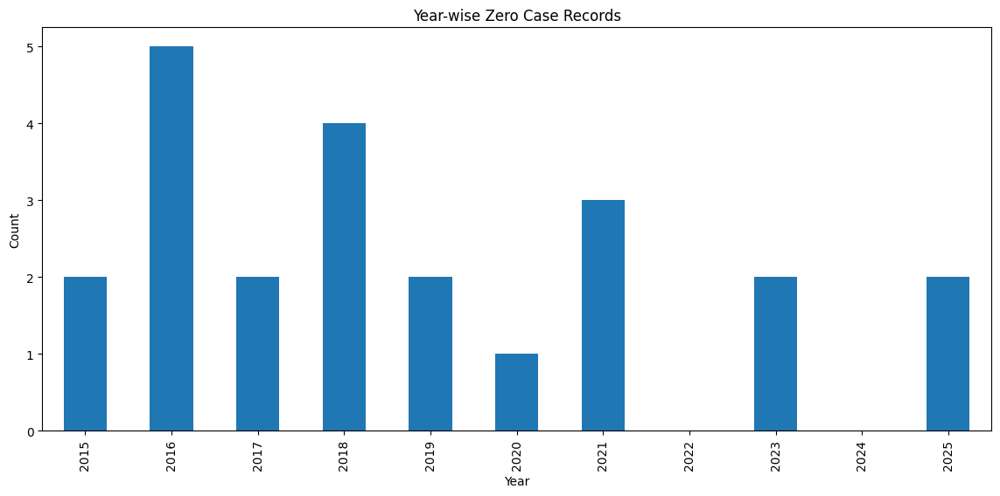

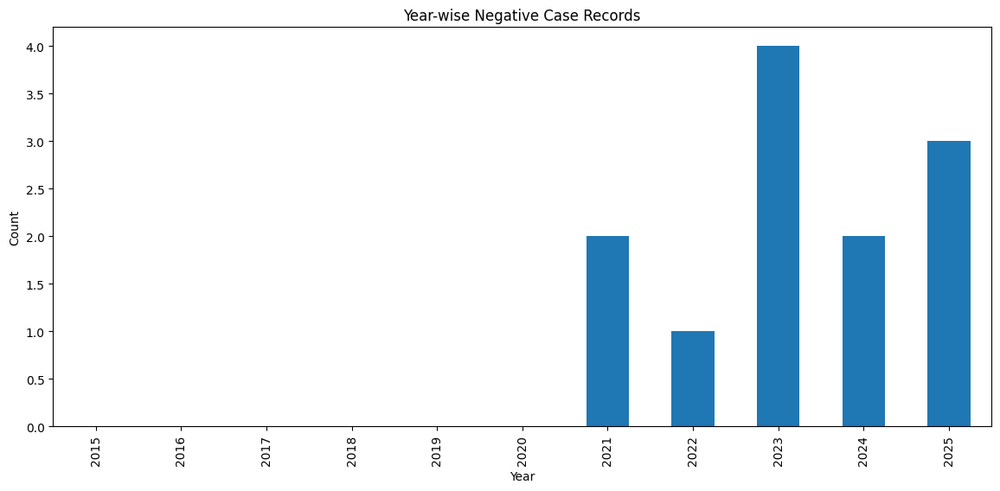

In [3]:
import matplotlib.pyplot as plt

# -------------------------------
# Set Year as index for plotting
# -------------------------------
plot_df = basic_checks_yearly.set_index("Year")

# -------------------------------
# Create bar plots
# -------------------------------



plt.figure(figsize=(14,6))
plot_df["Zero cases"].plot(kind="bar")
plt.title("Year-wise Zero Case Records")
plt.xlabel("Year")
plt.ylabel("Count")
plt.show()

plt.figure(figsize=(14,6))
plot_df["Negative cases"].plot(kind="bar")
plt.title("Year-wise Negative Case Records")
plt.xlabel("Year")
plt.ylabel("Count")
plt.show()


In [8]:
# =====================================================
# METRIC 2: TIME SERIES CONTINUITY CHECK
# a) Date frequency per warehouse/category (Year-wise)
# FINAL OUTPUT: Row-level (ALL YEARS)
# =====================================================

import pandas as pd
from pathlib import Path

# -----------------------------------------------------
# Load RAW data
# -----------------------------------------------------
RAW_PATH = Path("../data/raw")

df = pd.concat(
    [pd.read_parquet(p) for p in RAW_PATH.glob("year=*/*.parquet")],
    ignore_index=True
)

df['calendar_date'] = pd.to_datetime(df['calendar_date'])
df['year'] = df['calendar_date'].dt.year

# -----------------------------------------------------
# Continuity & frequency check (warehouse-category level)
# -----------------------------------------------------
results = []

for year, df_year in df.groupby("year"):
    
    for (wh, cat), grp in df_year.groupby(["warehouse_id", "category"]):
        
        dates = grp["calendar_date"].drop_duplicates().sort_values()
        
        expected_days = (dates.max() - dates.min()).days + 1
        observed_days = dates.nunique()
        missing_days = expected_days - observed_days
        
        results.append({
            "Year": year,
            "Warehouse": wh,
            "Category": cat,
            "Expected days": expected_days,
            "Observed days": observed_days,
            "Missing days": missing_days,
            "Frequency OK": missing_days == 0
        })

# -----------------------------------------------------
# FINAL OUTPUT DATAFRAME (WHAT YOU WANT)
# -----------------------------------------------------
continuity_df = (
    pd.DataFrame(results)
    .sort_values(["Year", "Warehouse", "Category"])
    .reset_index(drop=True)
)

continuity_df


,Year,Warehouse,Category,Expected days,Observed days,Missing days,Frequency OK
0,2015,6005,Ammunition,143,78,65,False
1,2015,6005,Apparel,142,93,49,False
2,2015,6005,Other,143,94,49,False
3,2015,6005,Shoes,143,95,48,False
4,2015,6014,Ammunition,141,103,38,False
...,...,...,...,...,...,...,...
245,2025,6041,Shoes,219,217,2,False
246,2025,7842,Ammunition,212,119,93,False
247,2025,7842,Apparel,219,219,0,True
248,2025,7842,Other,219,219,0,True


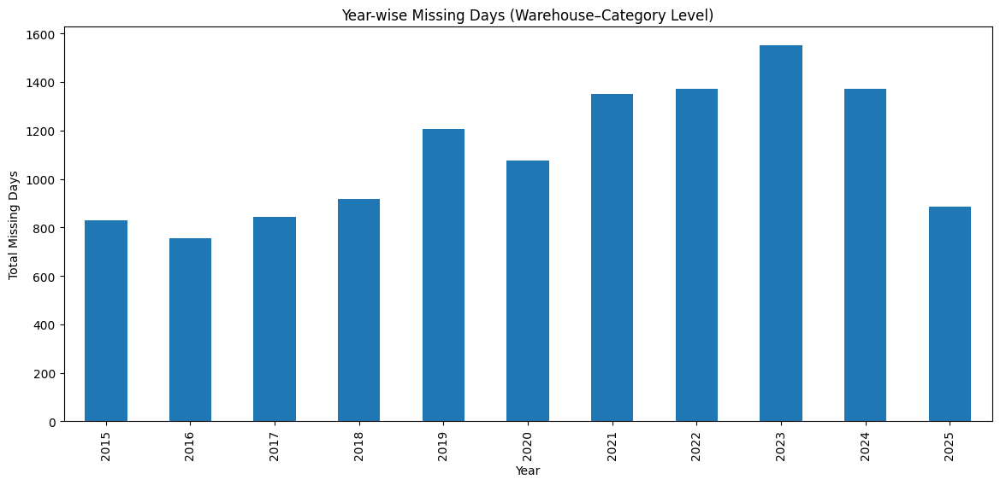

In [5]:
import matplotlib.pyplot as plt

missing_by_year = (
    continuity_df
    .groupby("Year")["Missing days"]
    .sum()
)

plt.figure(figsize=(14,6))
missing_by_year.plot(kind="bar")
plt.title("Year-wise Missing Days (Warehouse–Category Level)")
plt.xlabel("Year")
plt.ylabel("Total Missing Days")
plt.show()


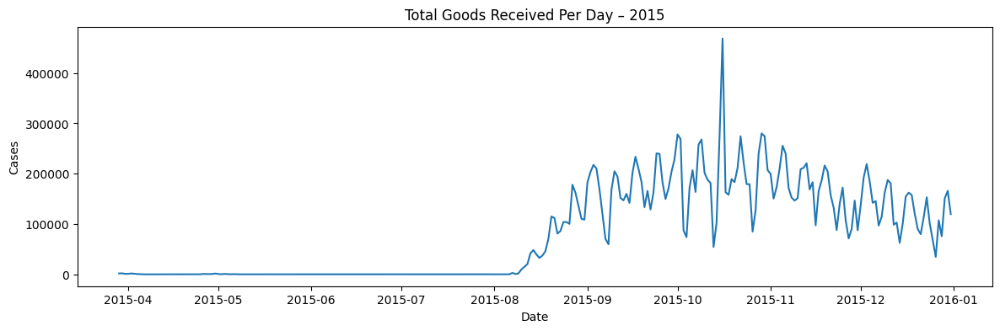

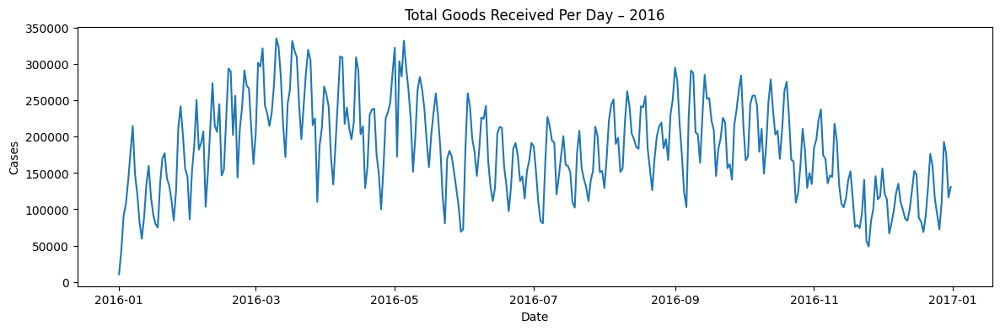

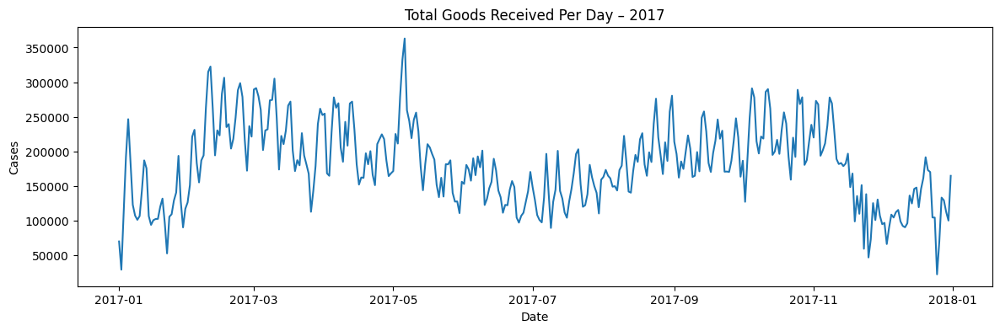

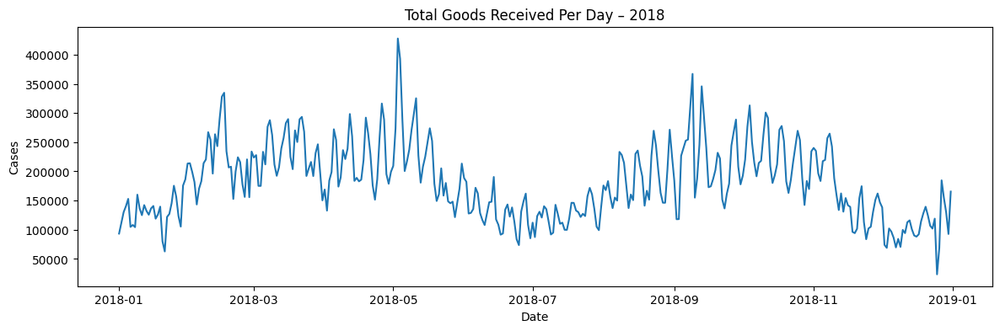

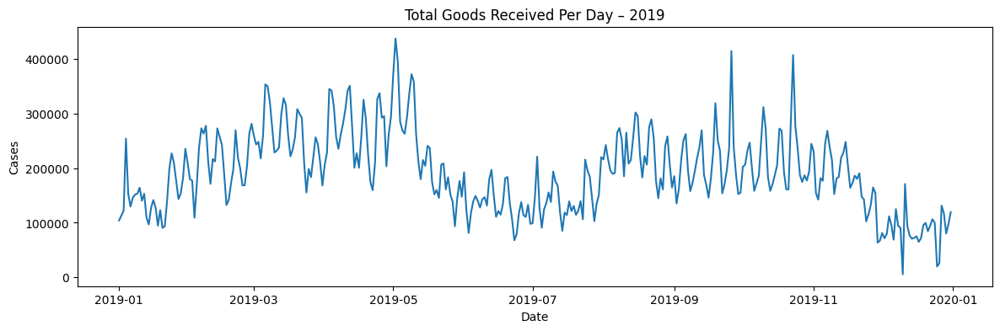

...

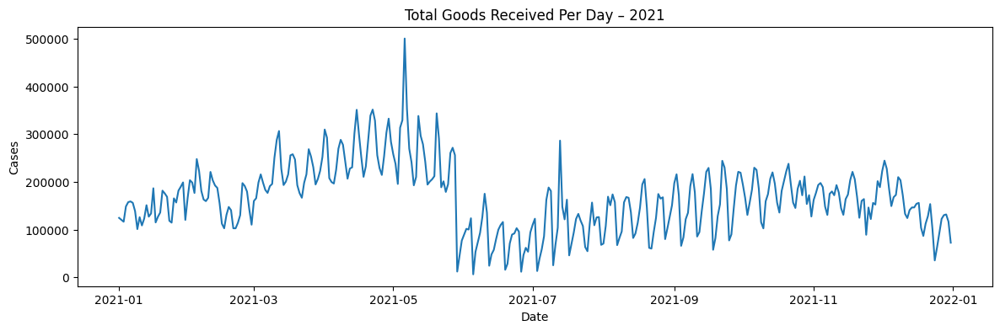

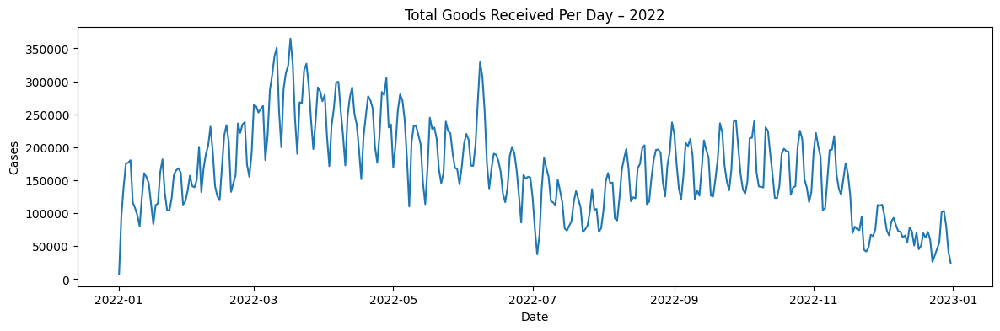

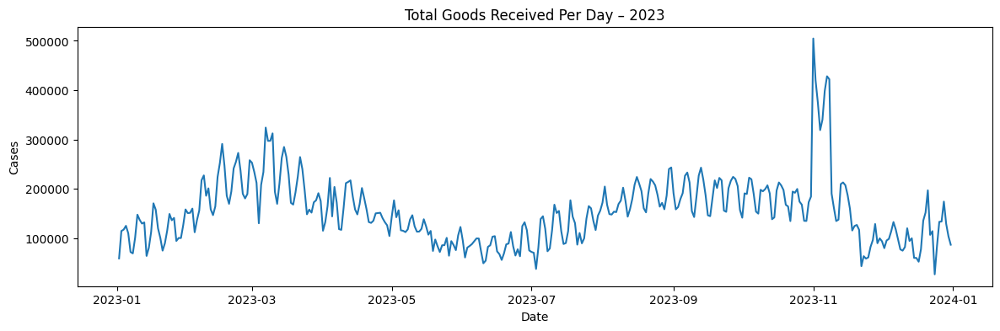

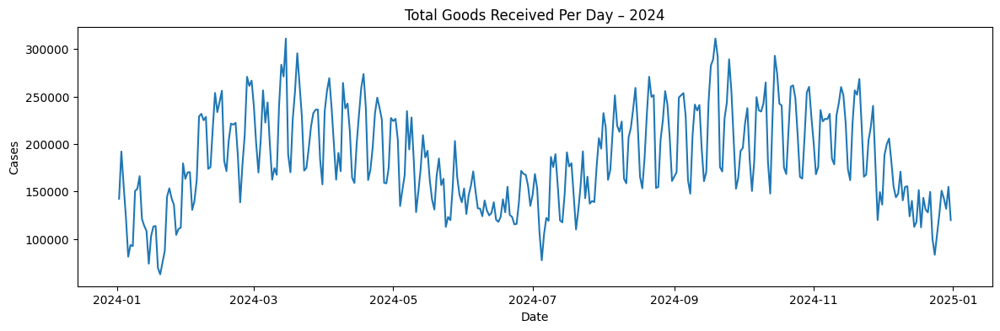

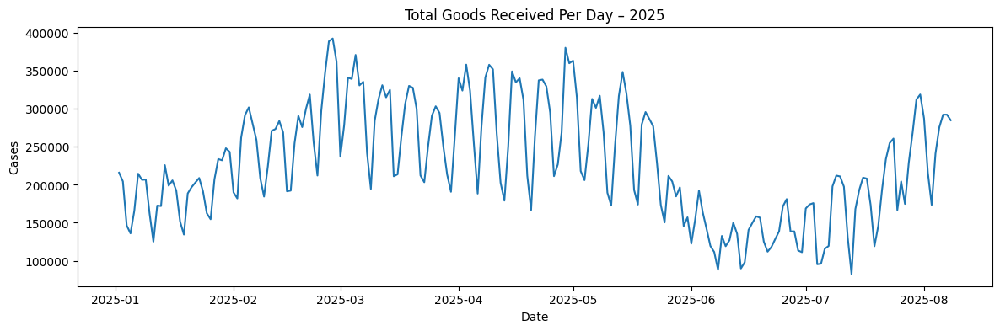

In [9]:
#3(a)  Total Goods Received per Day (YEAR-WISE)
for year, df_year in df.groupby("year"):
    
    daily_total = (
        df_year
        .groupby("calendar_date")["cases"]
        .sum()
    )
    
    plt.figure(figsize=(14,4))
    plt.plot(daily_total)
    plt.title(f"Total Goods Received Per Day – {year}")
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.show()


In [10]:
# 3b volume analysis Per warehouse/category
for year, df_year in df.groupby("year"):
    
    wh_cat_volume = (
        df_year
        .groupby(["warehouse_id", "category"])["cases"]
        .sum()
        .reset_index()
    )
    
    print(f"\n===== Warehouse–Category Volume Summary : {year} =====")
    display(wh_cat_volume.head(10))



===== Warehouse–Category Volume Summary : 2015 =====


,warehouse_id,category,cases
0,6005,Ammunition,82209.00
1,6005,Apparel,1582122.00
2,6005,Other,800754.00
3,6005,Shoes,595260.00
4,6014,Ammunition,173459.00
5,6014,Apparel,2489213.00
6,6014,Other,1516907.00
7,6014,Shoes,1045088.00
8,6022,Ammunition,160356.00
9,6022,Apparel,2287011.00



===== Warehouse–Category Volume Summary : 2016 =====


,warehouse_id,category,cases
0,6005,Ammunition,198378.00
1,6005,Apparel,4763554.00
2,6005,Other,1699618.00
3,6005,Shoes,2772217.00
4,6014,Ammunition,382071.00
5,6014,Apparel,8136571.00
6,6014,Other,3252089.00
7,6014,Shoes,4931051.00
8,6022,Ammunition,332459.00
9,6022,Apparel,7109919.00



===== Warehouse–Category Volume Summary : 2017 =====


,warehouse_id,category,cases
0,6005,Ammunition,172348.00
1,6005,Apparel,5560324.00
2,6005,Other,607842.00
3,6005,Shoes,2640348.00
4,6014,Ammunition,414713.00
5,6014,Apparel,9251423.00
6,6014,Other,1694235.00
7,6014,Shoes,4775769.00
8,6022,Ammunition,391592.00
9,6022,Apparel,8077081.00



===== Warehouse–Category Volume Summary : 2018 =====


,warehouse_id,category,cases
0,6005,Ammunition,167405.00
1,6005,Apparel,5561540.00
2,6005,Other,609775.00
3,6005,Shoes,2508379.00
4,6014,Ammunition,417764.00
5,6014,Apparel,9965403.00
6,6014,Other,1699785.00
7,6014,Shoes,4698759.00
8,6022,Ammunition,357699.00
9,6022,Apparel,8236538.00



===== Warehouse–Category Volume Summary : 2019 =====


,warehouse_id,category,cases
0,6005,Ammunition,176352.00
1,6005,Apparel,4874079.00
2,6005,Other,592827.00
3,6005,Shoes,2419714.00
4,6014,Ammunition,433706.00
5,6014,Apparel,8759170.00
6,6014,Other,1680045.00
7,6014,Shoes,4661696.00
8,6022,Ammunition,365424.00
9,6022,Apparel,7350140.00



===== Warehouse–Category Volume Summary : 2020 =====


,warehouse_id,category,cases
0,6005,Ammunition,208380.00
1,6005,Apparel,3902155.00
2,6005,Other,636665.00
3,6005,Shoes,1620300.00
4,6014,Ammunition,539413.00
5,6014,Apparel,7407218.00
6,6014,Other,1377980.00
7,6014,Shoes,3360856.00
8,6022,Ammunition,502992.00
9,6022,Apparel,6758779.00



===== Warehouse–Category Volume Summary : 2021 =====


,warehouse_id,category,cases
0,6005,Ammunition,188766.00
1,6005,Apparel,4232745.00
2,6005,Other,745964.00
3,6005,Shoes,1675054.00
4,6014,Ammunition,335895.00
5,6014,Apparel,7246171.00
6,6014,Other,1351033.67
7,6014,Shoes,3064194.00
8,6022,Ammunition,474162.00
9,6022,Apparel,6345222.00



===== Warehouse–Category Volume Summary : 2022 =====


,warehouse_id,category,cases
0,6005,Ammunition,160091.00
1,6005,Apparel,4289708.98
2,6005,Other,632767.75
3,6005,Shoes,1802723.00
4,6014,Ammunition,355730.00
5,6014,Apparel,7738190.82
6,6014,Other,1281649.97
7,6014,Shoes,3240678.00
8,6022,Ammunition,429117.00
9,6022,Apparel,6421479.11



===== Warehouse–Category Volume Summary : 2023 =====


,warehouse_id,category,cases
0,6005,Ammunition,110449.11
1,6005,Apparel,3743573.86
2,6005,Other,878933.75
3,6005,Shoes,1279360.88
4,6014,Ammunition,279118.18
5,6014,Apparel,7147607.71
6,6014,Other,1702265.22
7,6014,Shoes,2765026.87
8,6022,Ammunition,258905.29
9,6022,Apparel,5938153.23



===== Warehouse–Category Volume Summary : 2024 =====


,warehouse_id,category,cases
0,6005,Ammunition,125538.00
1,6005,Apparel,4804891.00
2,6005,Other,581466.67
3,6005,Shoes,1426302.08
4,6014,Ammunition,282987.00
5,6014,Apparel,8681046.00
6,6014,Other,1533681.67
7,6014,Shoes,2876840.13
8,6022,Ammunition,278882.70
9,6022,Apparel,8087037.89



===== Warehouse–Category Volume Summary : 2025 =====


,warehouse_id,category,cases
0,6005,Ammunition,38909.00
1,6005,Apparel,4140528.00
2,6005,Other,287434.92
3,6005,Shoes,925632.00
4,6014,Ammunition,107297.00
5,6014,Apparel,7350328.16
6,6014,Other,699497.00
7,6014,Shoes,1796364.41
8,6022,Ammunition,116798.00
9,6022,Apparel,6871920.00


In [12]:
#3(c)  Stats Analysis (Min, Max, Median + Box Plot) – YEAR-WISE
# -----------------------------------------------------
# Ensure numeric consistency (IMPORTANT FIX)
# -----------------------------------------------------
df['cases'] = df['cases'].astype(float)

# -----------------------------------------------------
# Stats analysis (Year-wise)
# -----------------------------------------------------
stats_results = []

for year, df_year in df.groupby("year"):
    
    daily = (
        df_year
        .groupby("calendar_date")["cases"]
        .sum()
    )
    
    stats_results.append({
        "Year": year,
        "Min": daily.min(),
        "Max": daily.max(),
        "Median": daily.median(),
        "Mean": daily.mean(),
        "Std": daily.std()
    })

stats_df = pd.DataFrame(stats_results).sort_values("Year")
stats_df


,Year,Min,Max,Median,Mean,Std
0,2015,0.00,468405.00,128843.0,117936.251337,87937.911968
1,2016,10257.00,335507.00,183175.0,184297.684932,64260.056493
2,2017,22172.00,363041.00,180915.0,180951.216438,57994.852887
3,2018,23559.00,427631.00,175666.0,180786.652893,63491.111682
4,2019,5331.00,437758.00,184662.0,191743.719008,72903.931612
5,2020,9242.00,518428.00,165125.0,167583.134247,58664.320705
6,2021,6185.00,500185.00,165691.0,165976.317115,70462.260501
7,2022,7252.38,364977.50,165009.0,167652.058898,67588.401791
8,2023,27029.00,504697.80,149191.5,155168.950714,66341.271268
9,2024,62607.00,311020.25,175521.0,184828.216860,50587.827152


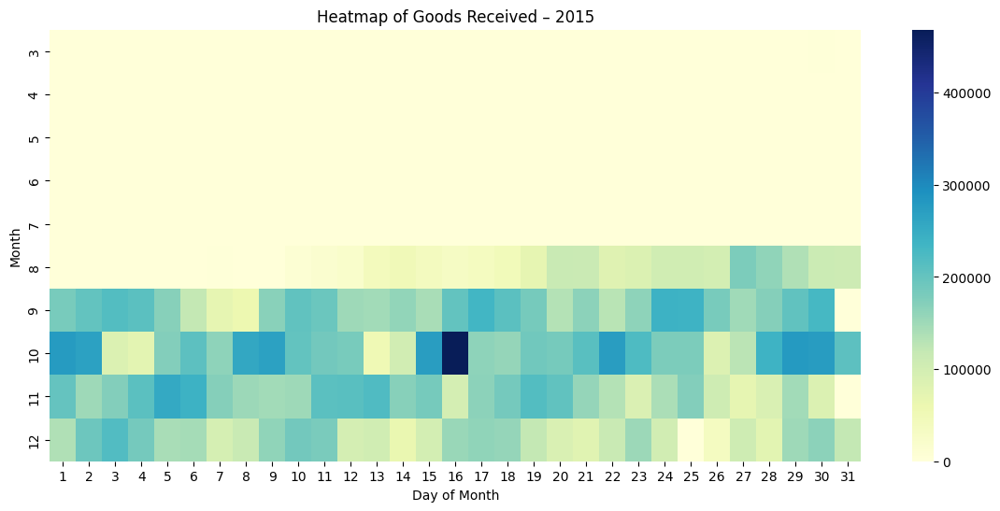

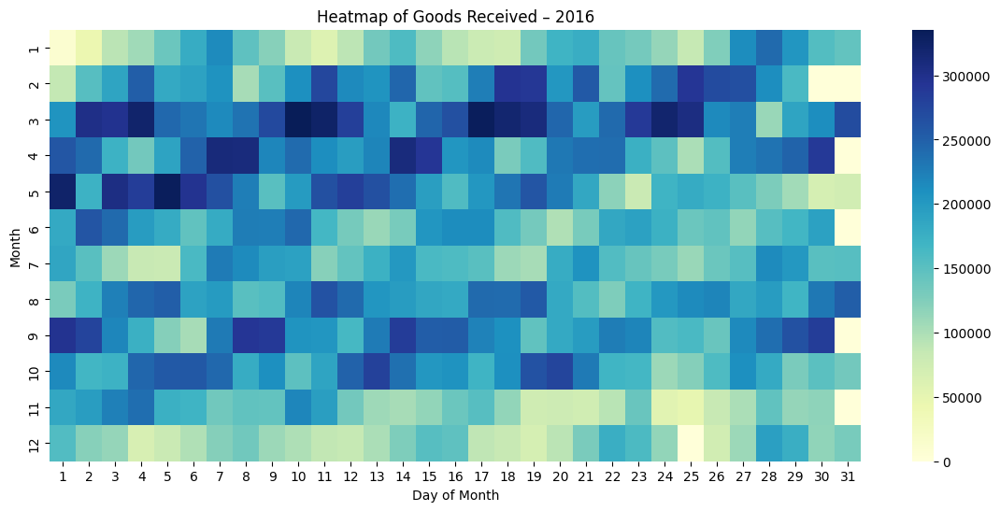

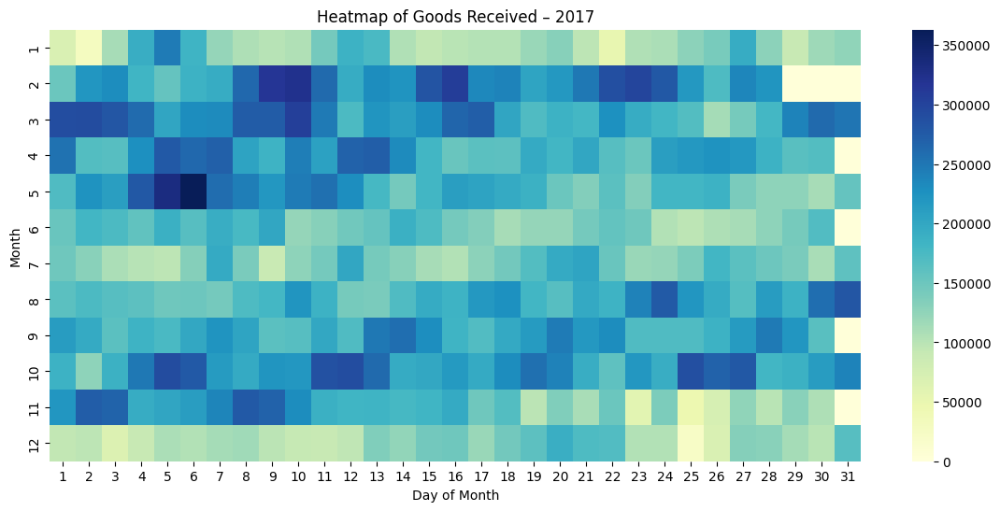

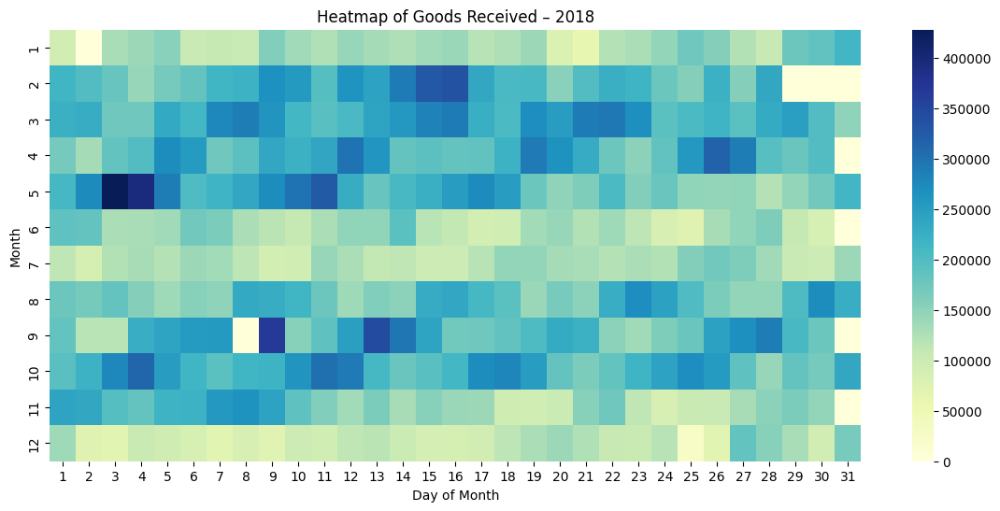

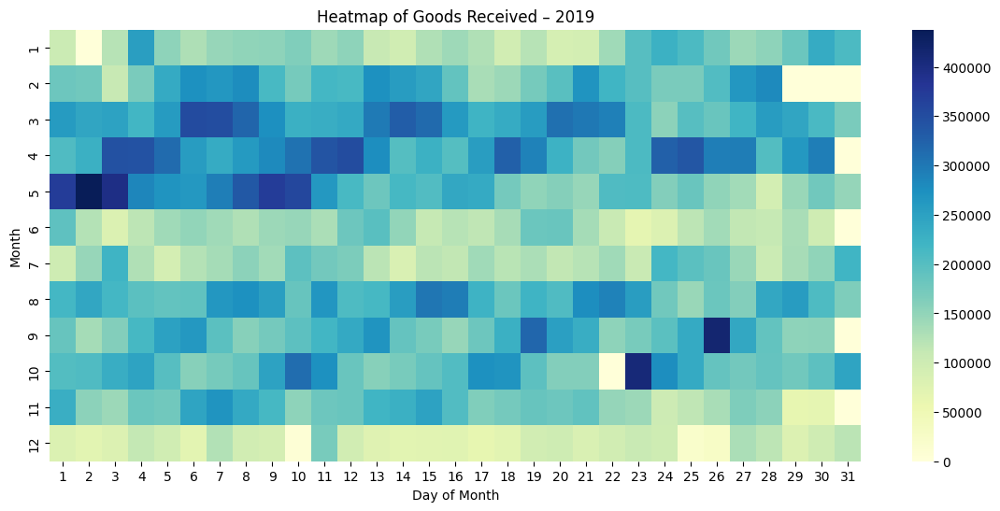

...

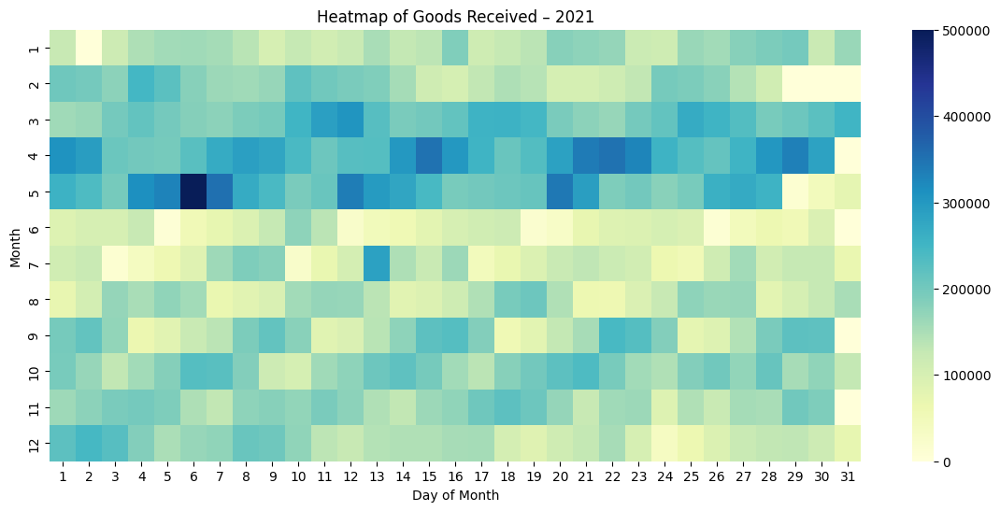

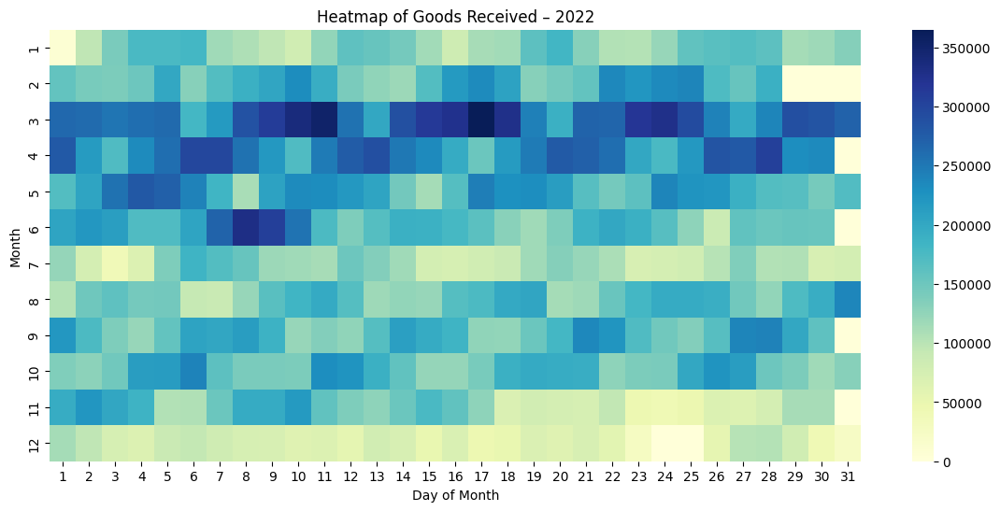

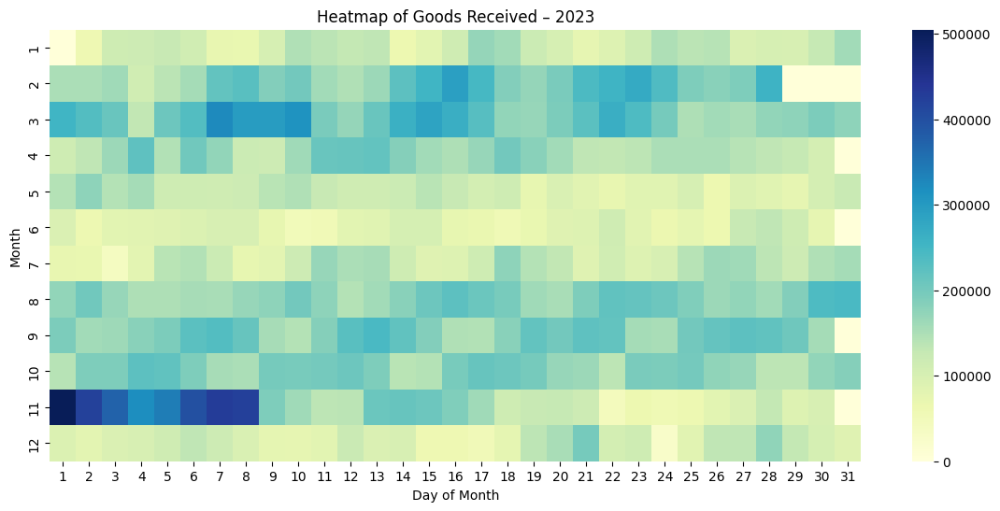

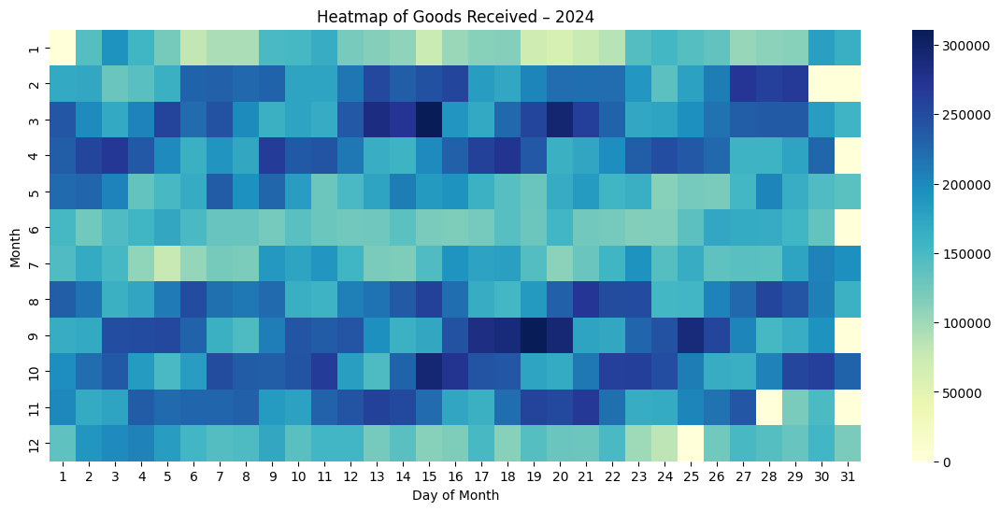

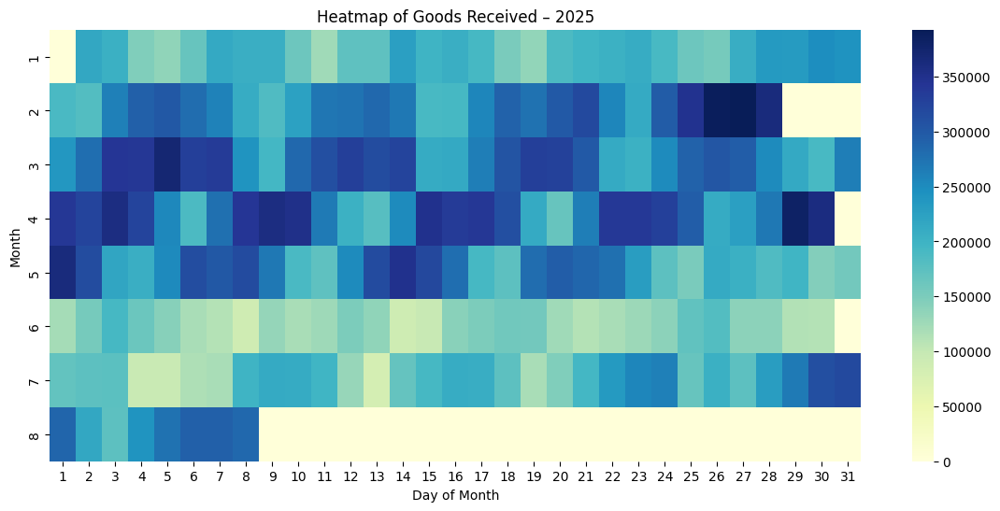

In [14]:
#3(d) Heatmap of Receivings Over Time (YEAR-WISE)
import matplotlib.pyplot as plt
import seaborn as sns   

# Create month & day columns
df['month'] = df['calendar_date'].dt.month
df['day'] = df['calendar_date'].dt.day

for year, df_year in df.groupby("year"):
    
    heatmap_data = (
        df_year
        .groupby(["month", "day"])["cases"]
        .sum()
        .unstack(fill_value=0)
    )
    
    plt.figure(figsize=(14,6))
    sns.heatmap(heatmap_data, cmap="YlGnBu")
    plt.title(f"Heatmap of Goods Received – {year}")
    plt.xlabel("Day of Month")
    plt.ylabel("Month")
    plt.show()


In [15]:
# 4(a)  Line Plots Over Time (Total Goods per Day – Year-wise)
df['cases'] = df['cases'].astype(float)
df = df.sort_values('calendar_date')


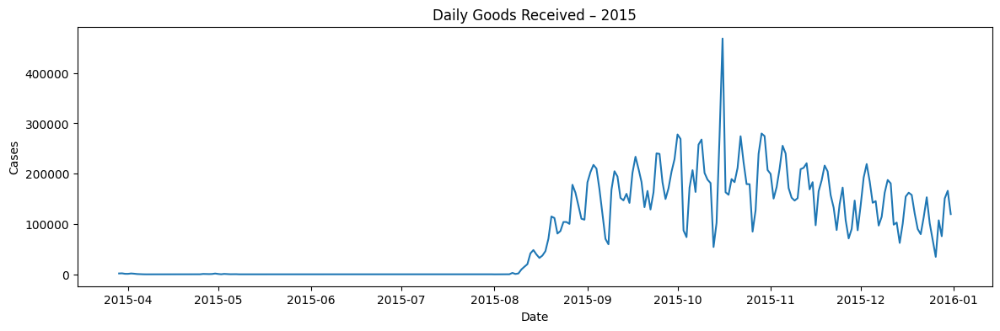

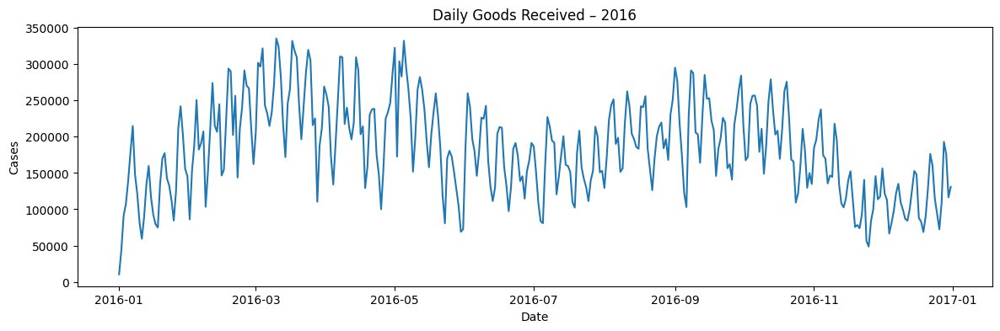

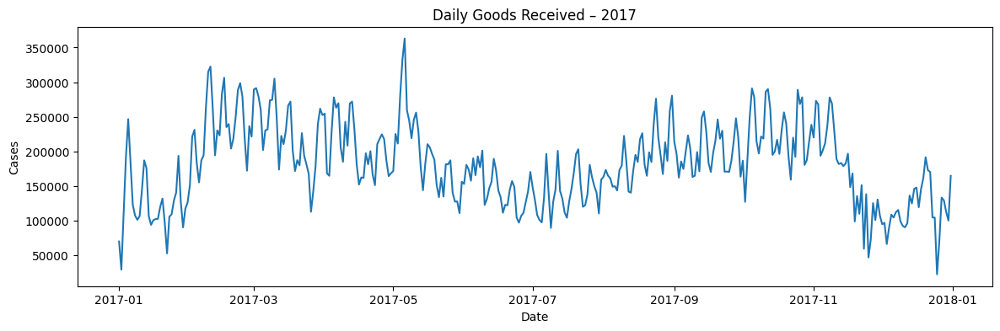

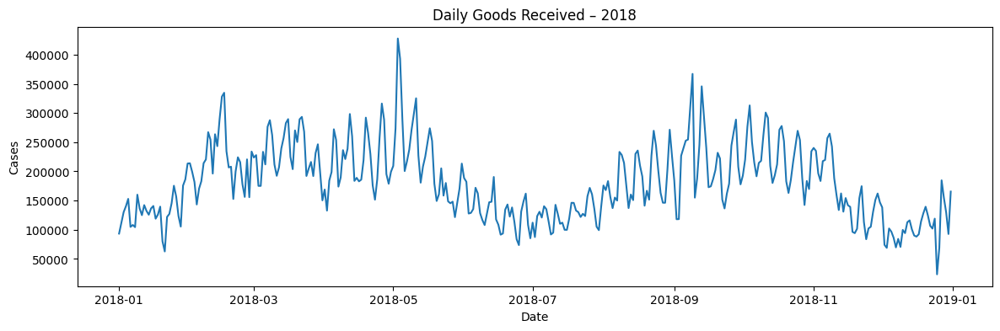

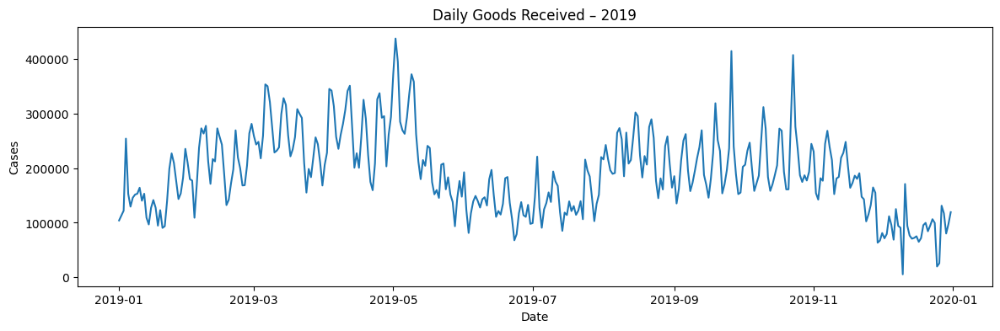

...

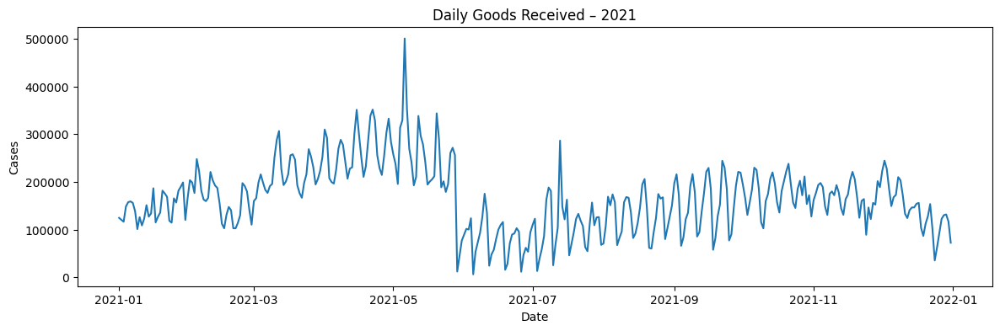

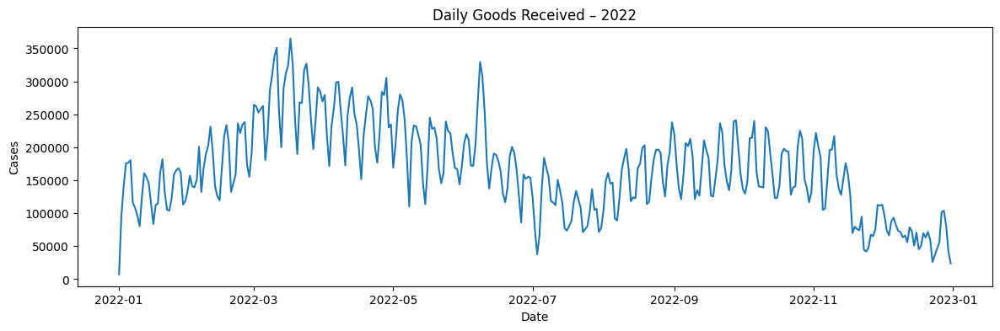

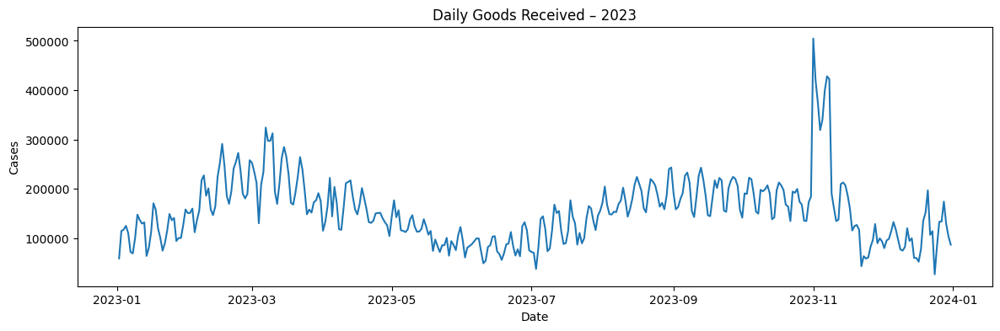

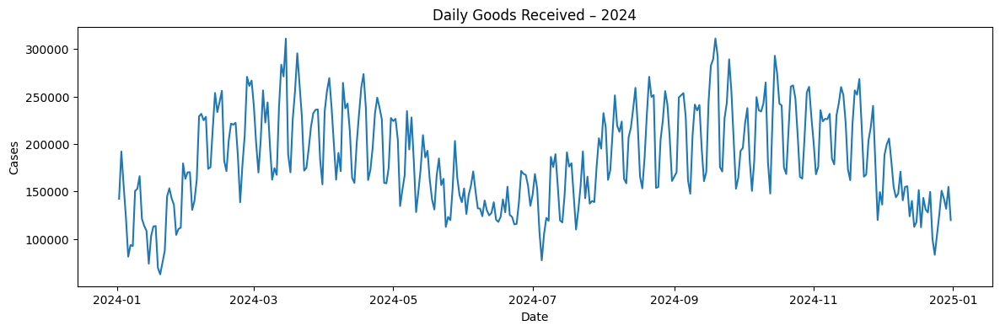

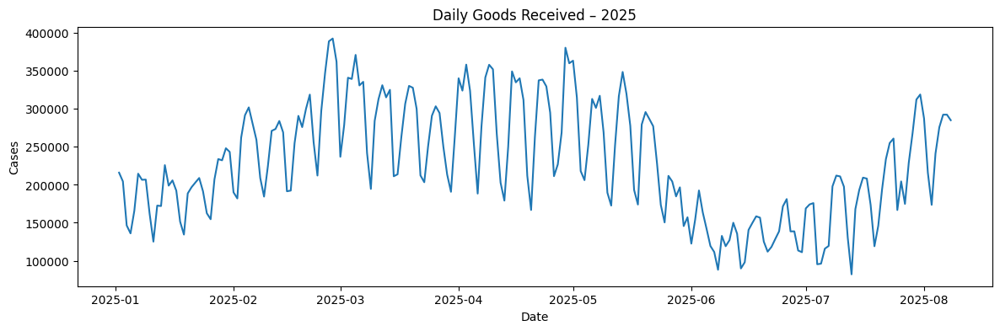

In [16]:
import matplotlib.pyplot as plt

for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
    )
    
    plt.figure(figsize=(14,4))
    plt.plot(daily.index, daily.values)
    plt.title(f"Daily Goods Received – {year}")
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.show()


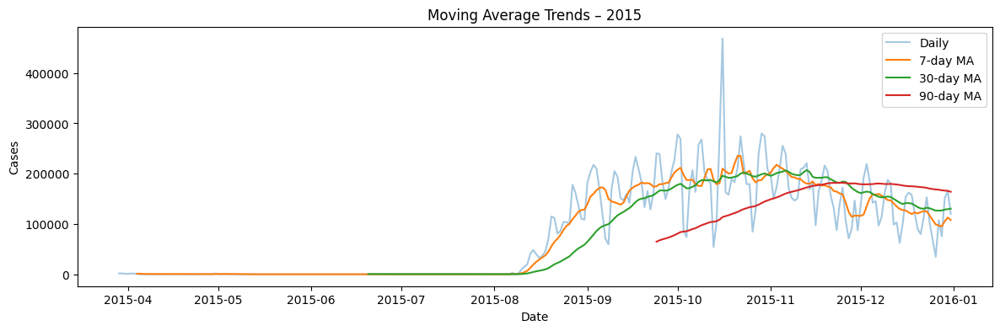

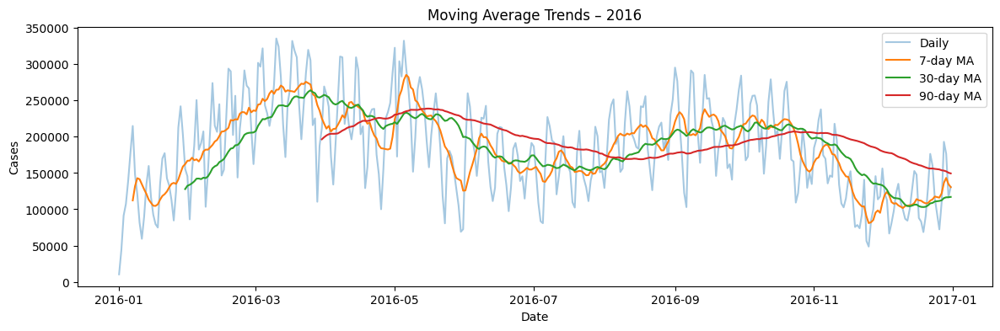

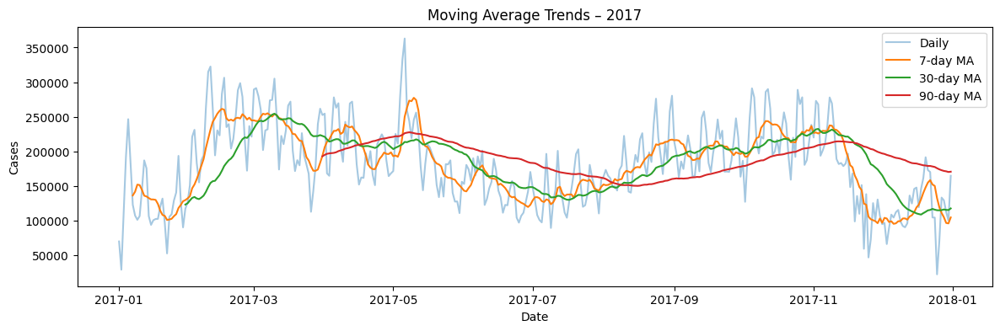

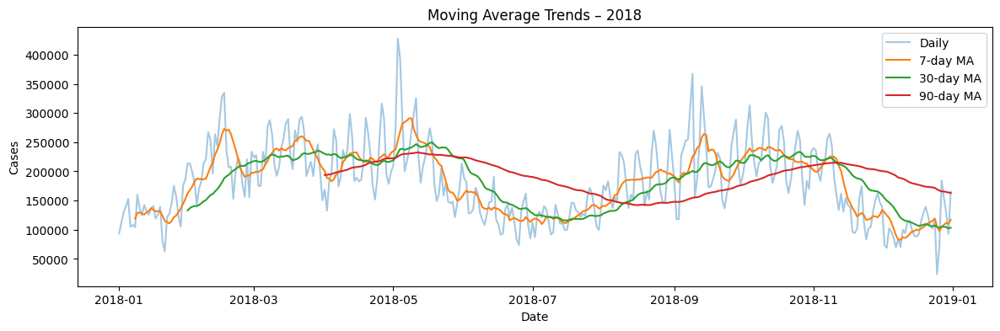

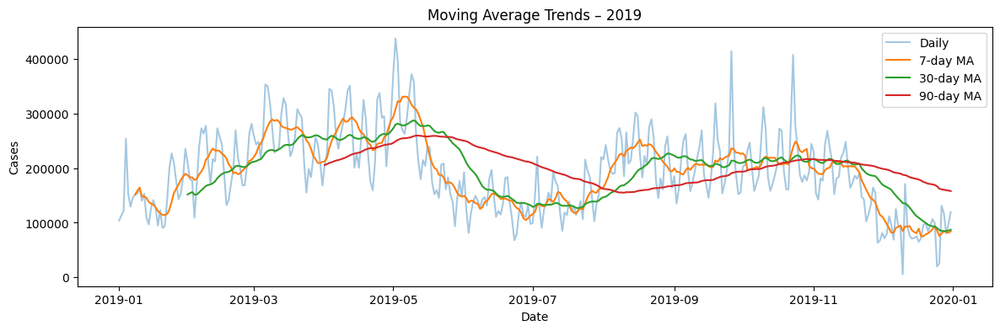

...

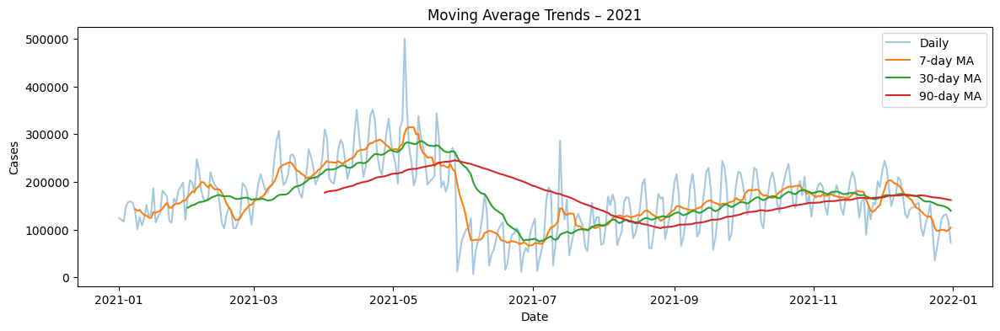

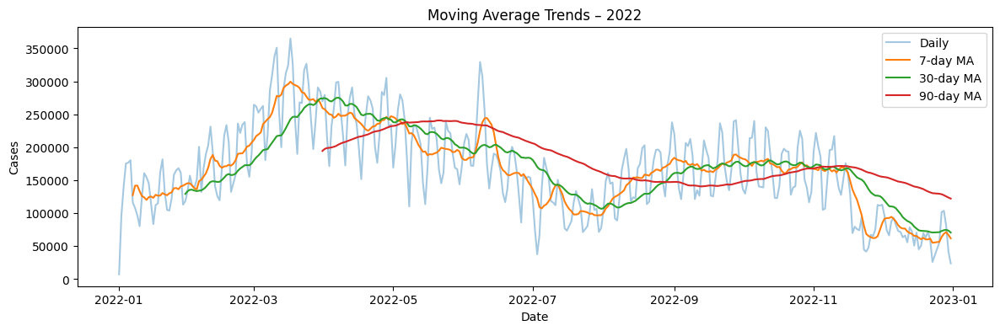

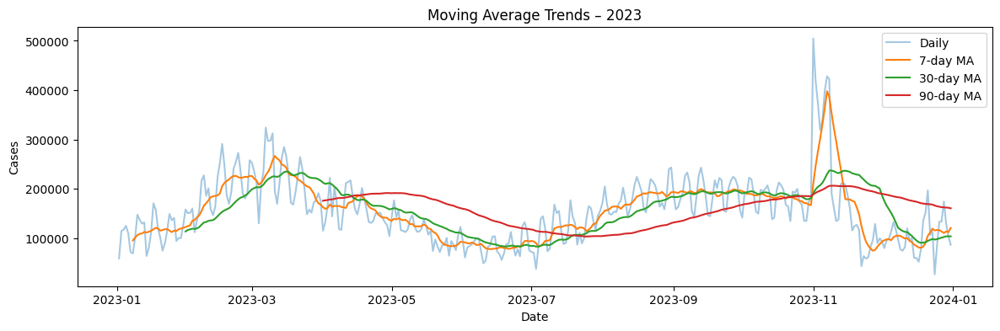

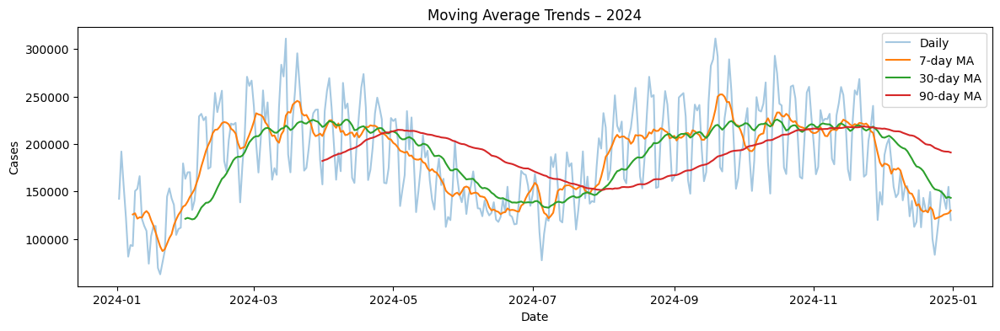

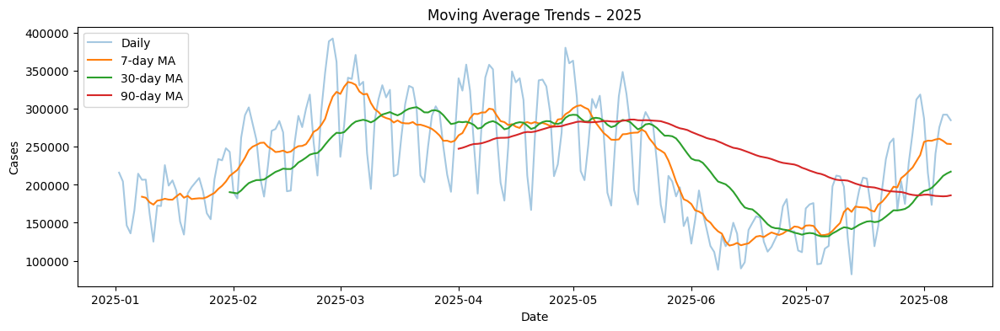

In [17]:
#4(b) Moving Averages (7 / 30 / 90 days – Year-wise)
for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    ma_7  = daily.rolling(7).mean()
    ma_30 = daily.rolling(30).mean()
    ma_90 = daily.rolling(90).mean()
    
    plt.figure(figsize=(14,4))
    plt.plot(daily, alpha=0.4, label="Daily")
    plt.plot(ma_7,  label="7-day MA")
    plt.plot(ma_30, label="30-day MA")
    plt.plot(ma_90, label="90-day MA")
    plt.title(f"Moving Average Trends – {year}")
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.show()


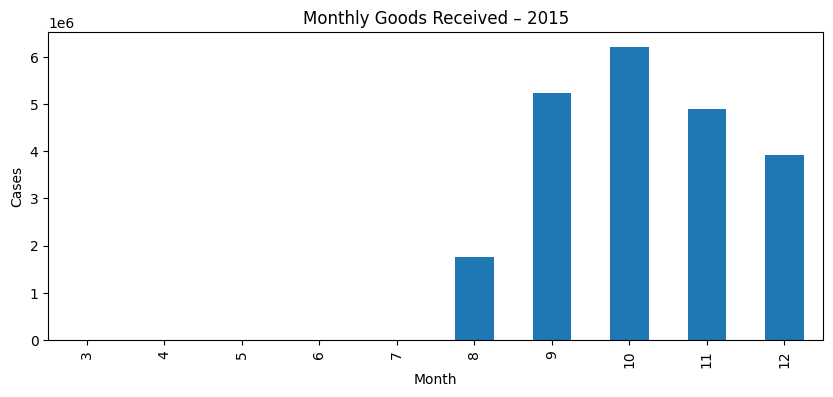

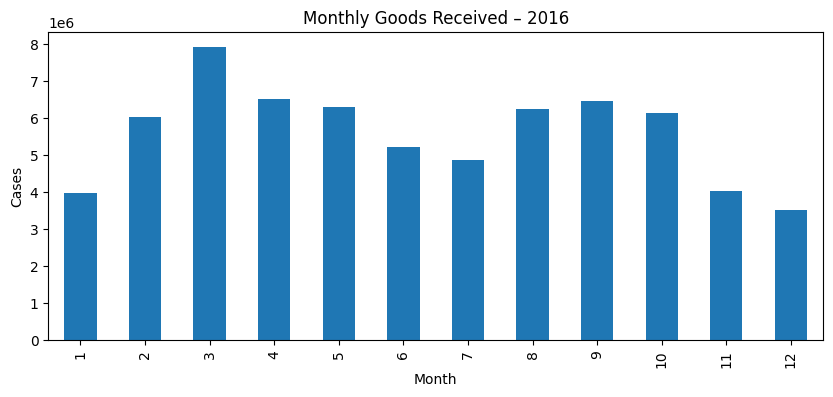

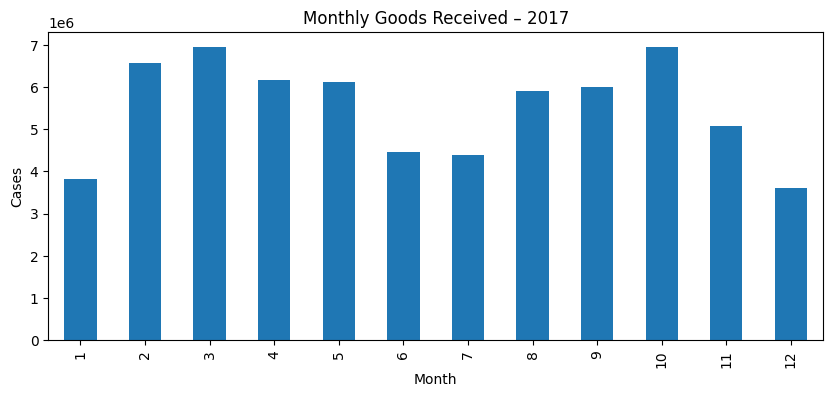

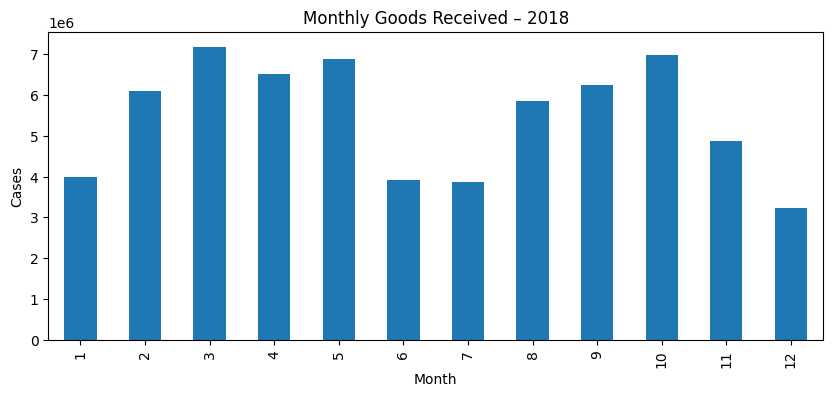

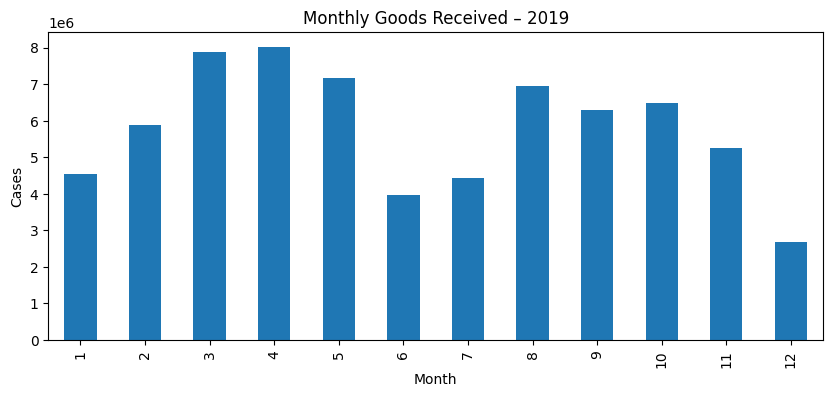

...

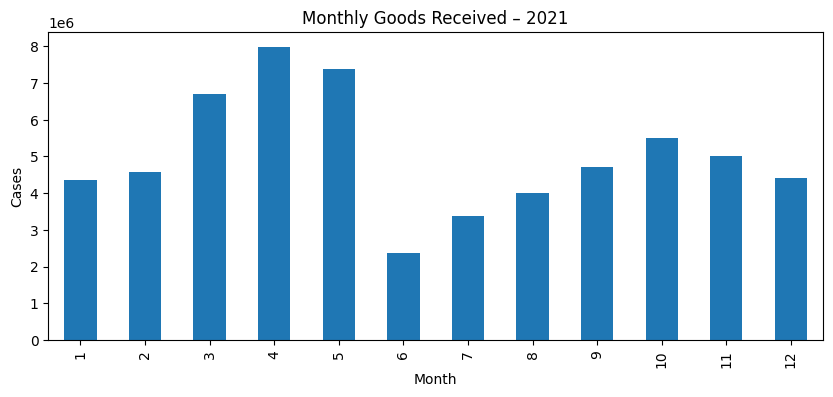

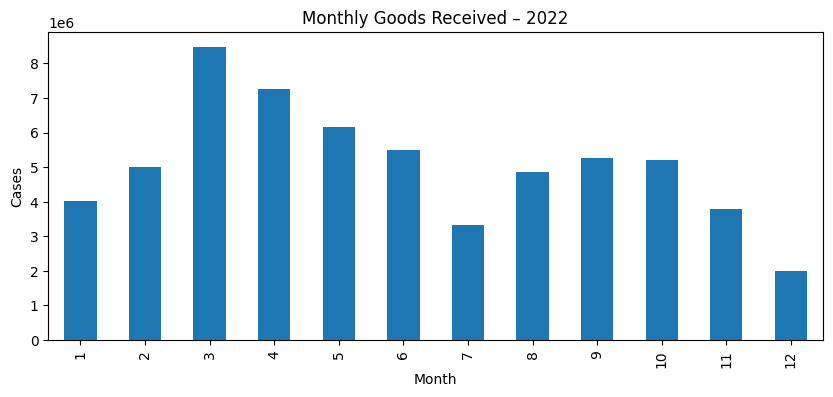

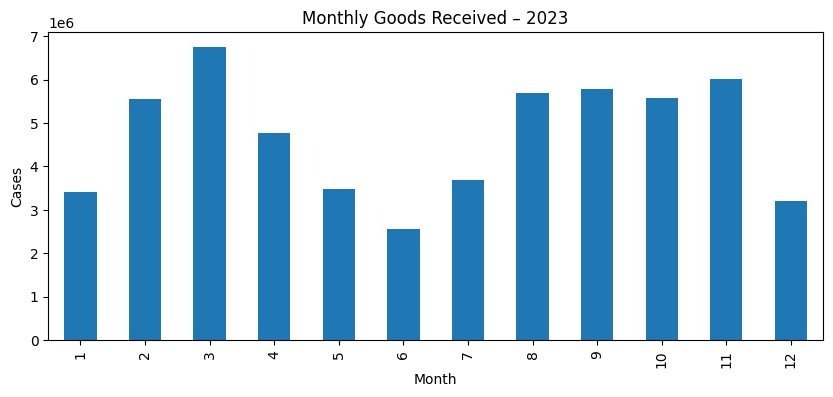

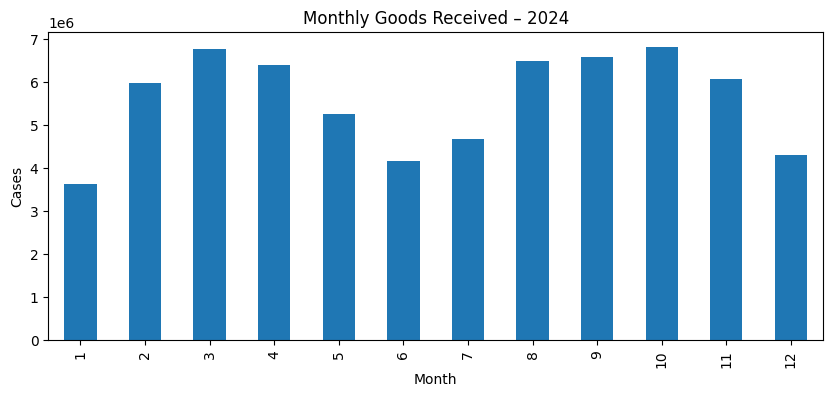

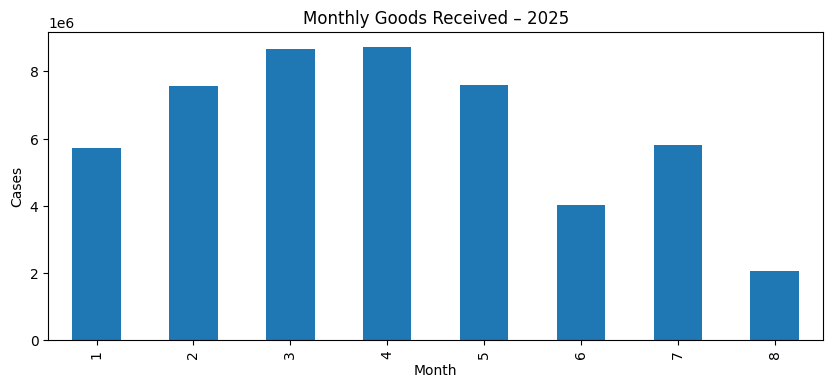

In [18]:
#4(c) Monthly & Yearly Aggregates
df['month'] = df['calendar_date'].dt.month

for year, df_year in df.groupby('year'):
    
    monthly = (
        df_year
        .groupby('month')['cases']
        .sum()
    )
    
    plt.figure(figsize=(10,4))
    monthly.plot(kind='bar')
    plt.title(f"Monthly Goods Received – {year}")
    plt.xlabel("Month")
    plt.ylabel("Cases")
    plt.show()


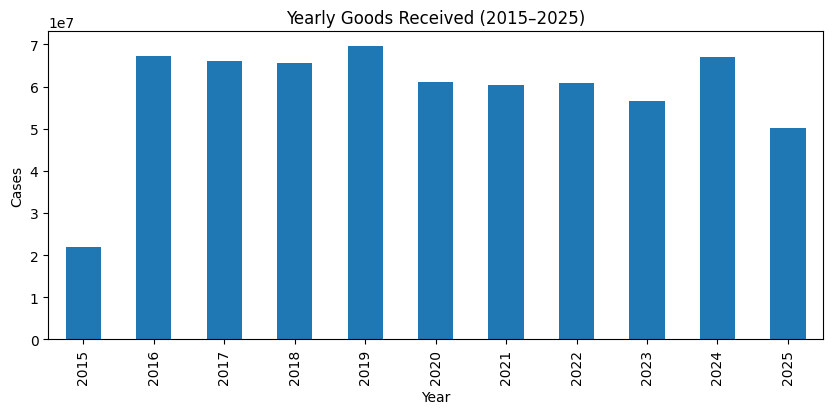

In [19]:
yearly = (
    df
    .groupby('year')['cases']
    .sum()
)

plt.figure(figsize=(10,4))
yearly.plot(kind='bar')
plt.title("Yearly Goods Received (2015–2025)")
plt.xlabel("Year")
plt.ylabel("Cases")
plt.show()


In [39]:
#5(a) 🔁 Auto-Correlation Function (ACF) – Year-wise
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import seasonal_decompose

df['cases'] = df['cases'].astype(float)
df = df.sort_values('calendar_date')



<Figure size 1000x400 with 0 Axes>

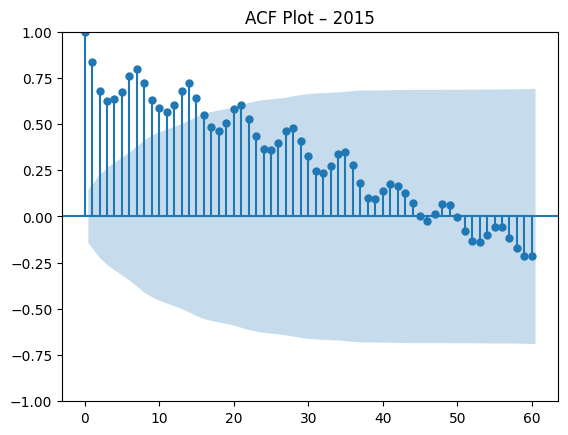

<Figure size 1000x400 with 0 Axes>

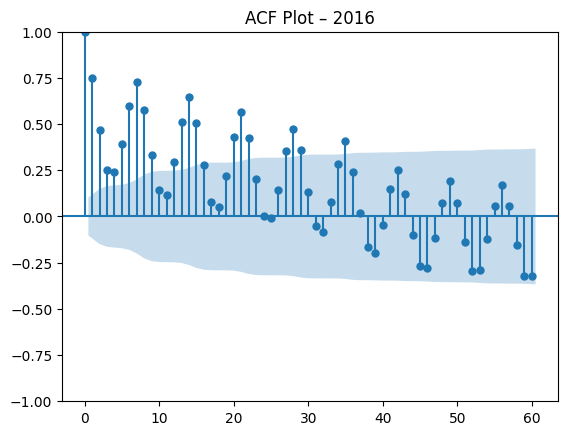

<Figure size 1000x400 with 0 Axes>

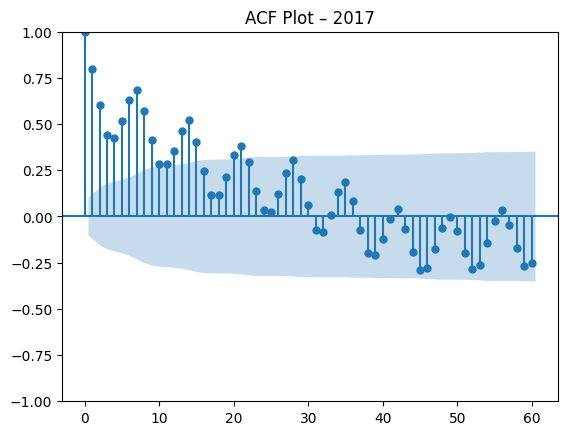

<Figure size 1000x400 with 0 Axes>

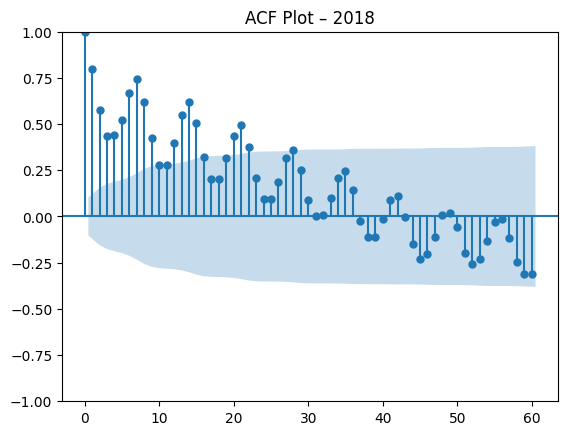

<Figure size 1000x400 with 0 Axes>

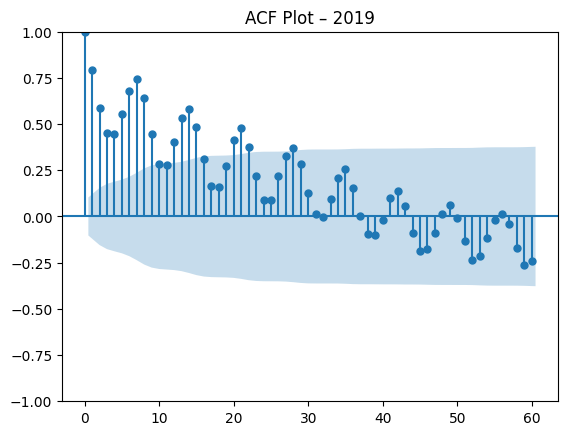

<Figure size 1000x400 with 0 Axes>

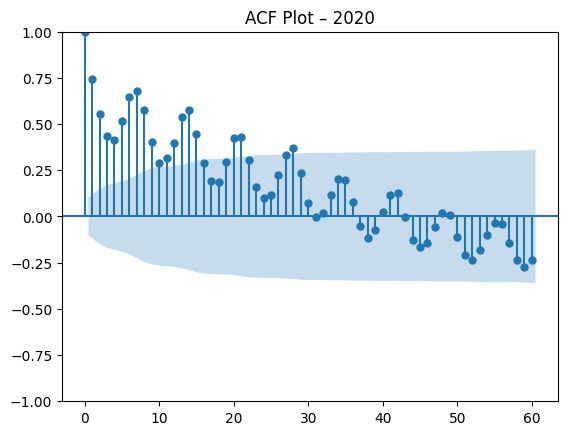

<Figure size 1000x400 with 0 Axes>

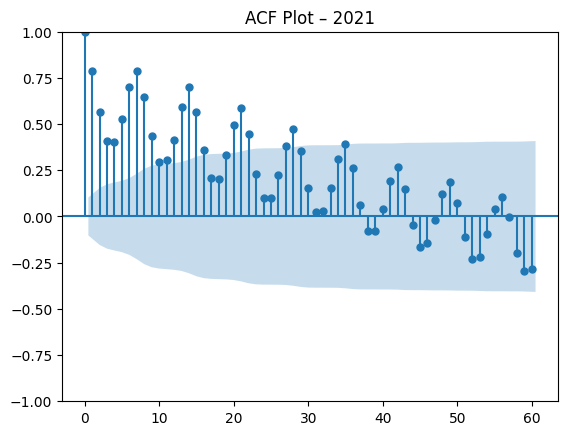

<Figure size 1000x400 with 0 Axes>

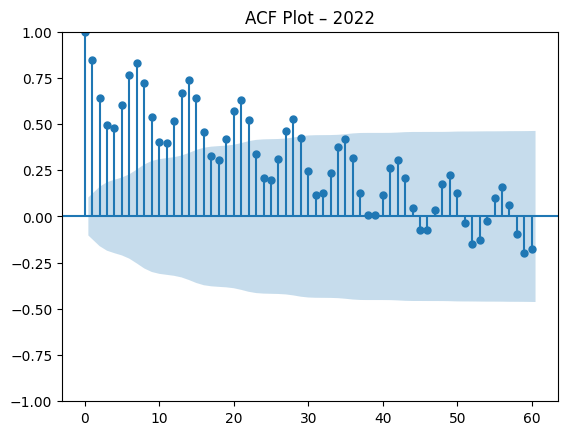

<Figure size 1000x400 with 0 Axes>

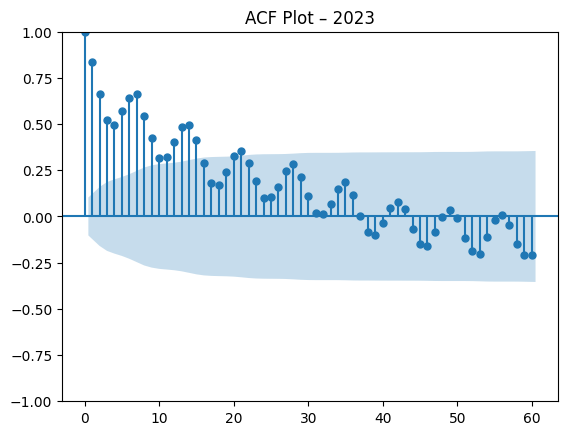

<Figure size 1000x400 with 0 Axes>

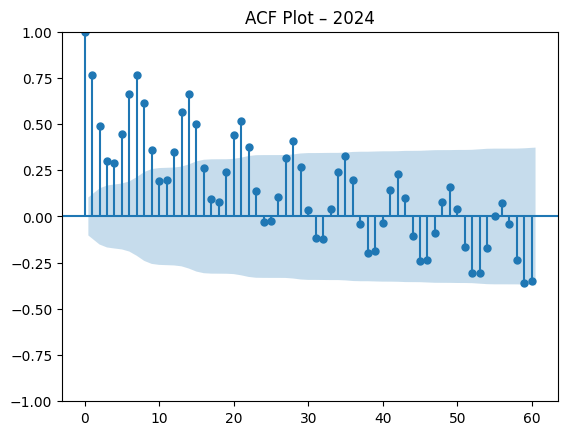

<Figure size 1000x400 with 0 Axes>

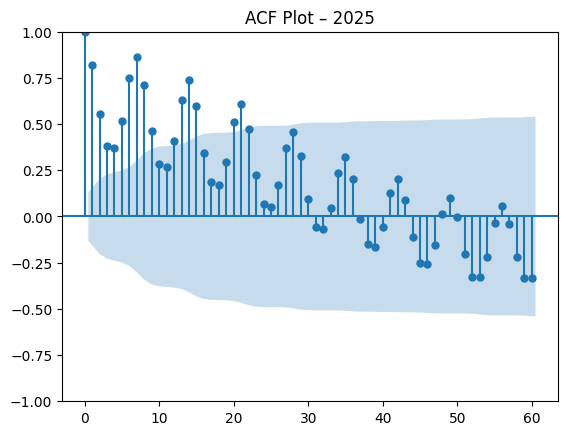

In [40]:
for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    plt.figure(figsize=(10,4))
    plot_acf(daily, lags=60)
    plt.title(f"ACF Plot – {year}")
    plt.show()


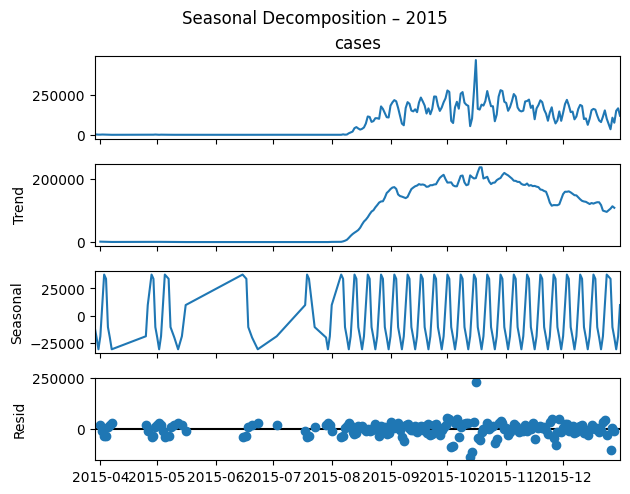

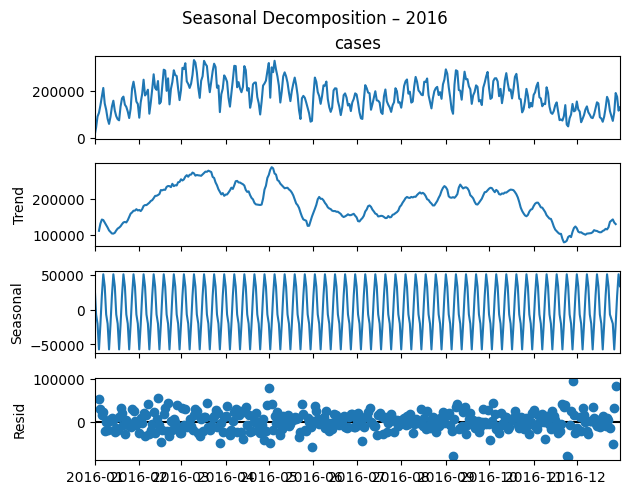

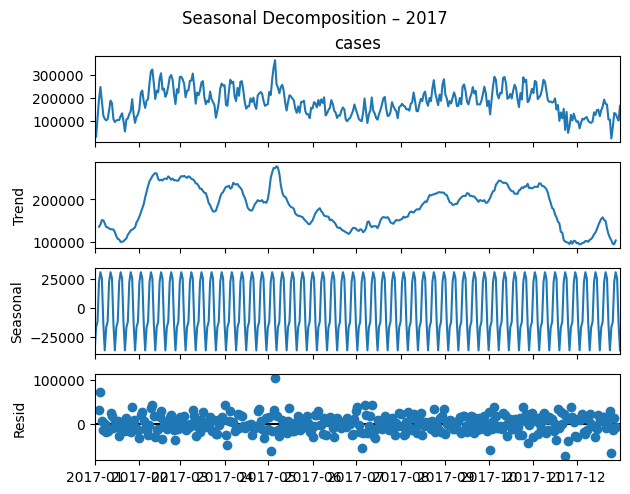

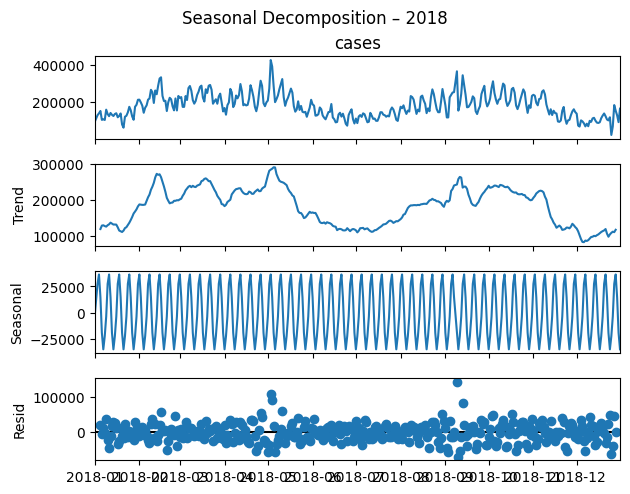

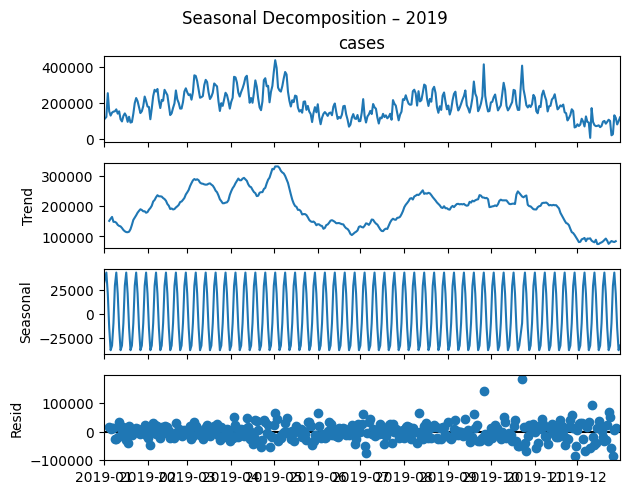

...

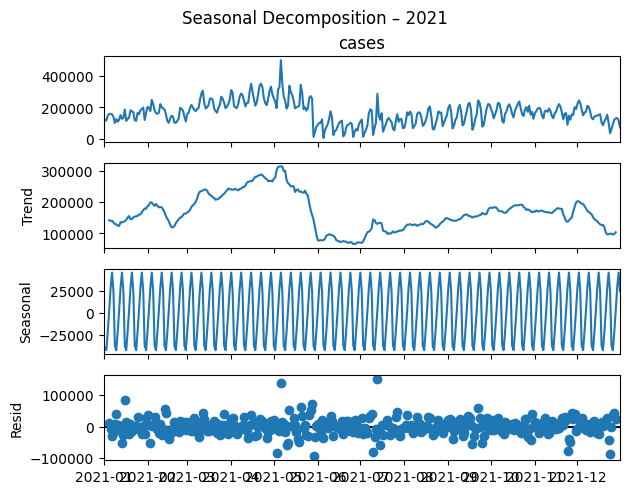

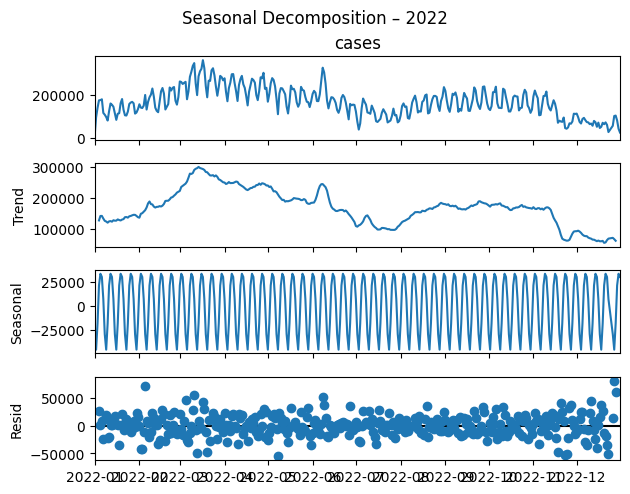

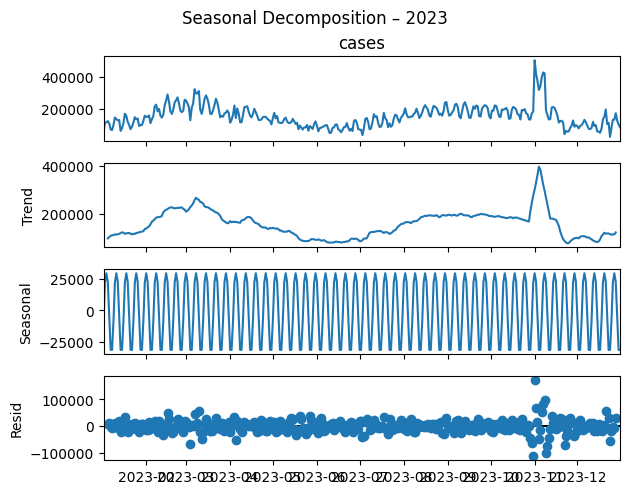

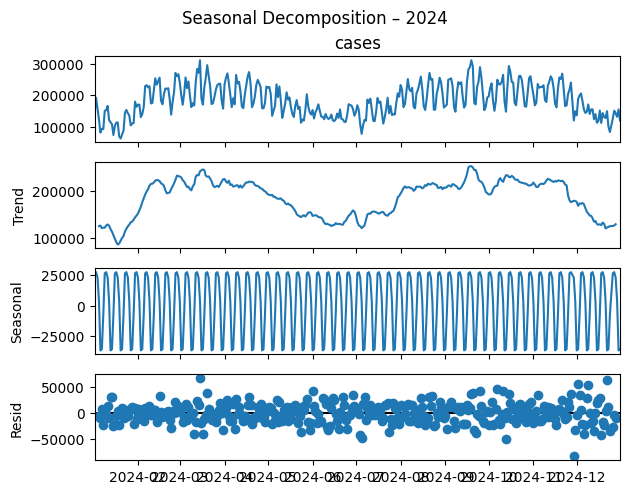

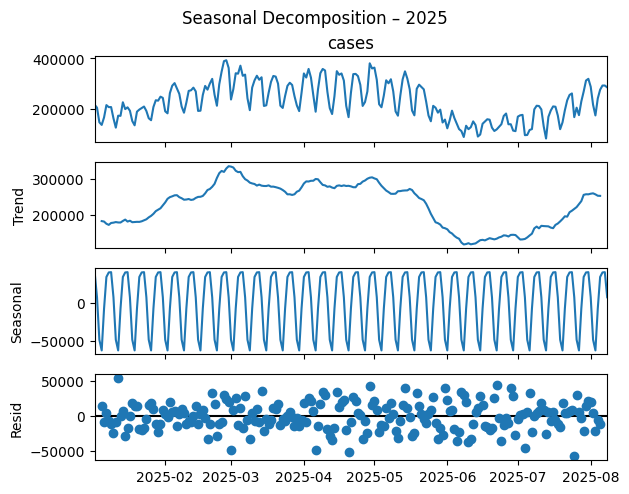

In [35]:
#5 b Seasonal Decomposition – Year-wise
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    if len(daily) >= 14:  # minimum safety check
        decomposition = seasonal_decompose(
            daily,
            model='additive',
            period=7
        )
        
        decomposition.plot()
        plt.suptitle(f"Seasonal Decomposition – {year}", y=1.02)
        plt.show()



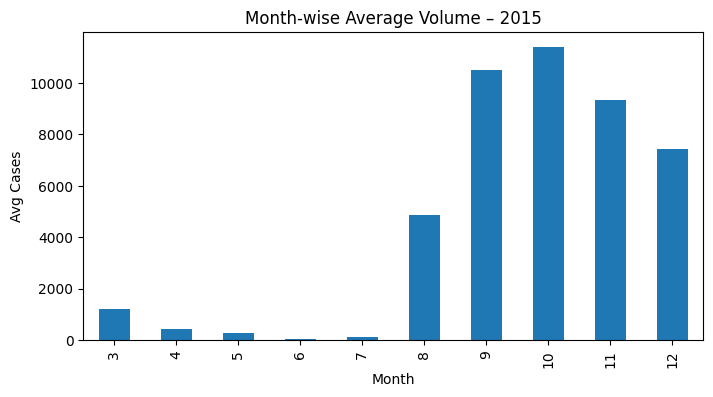

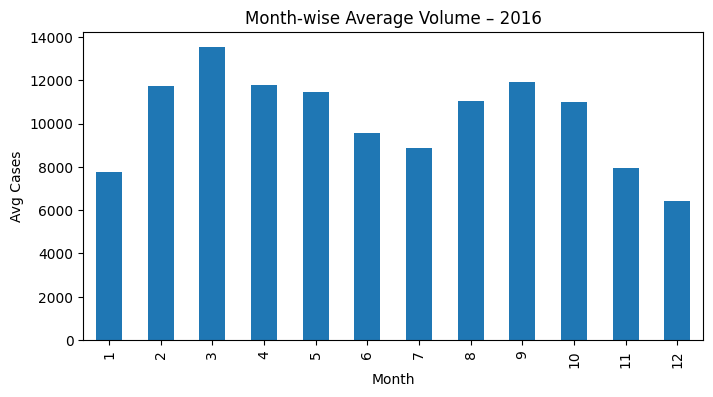

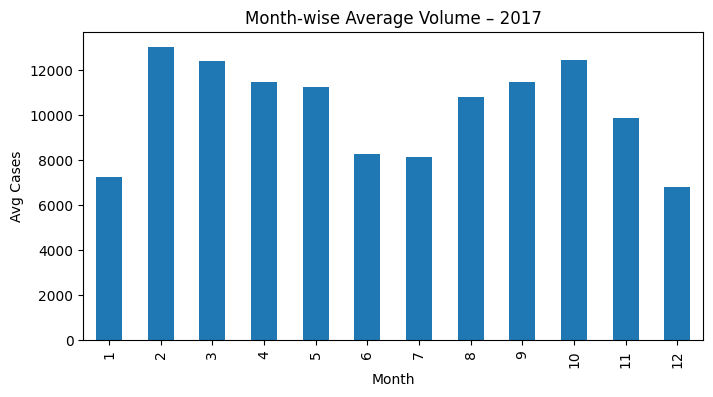

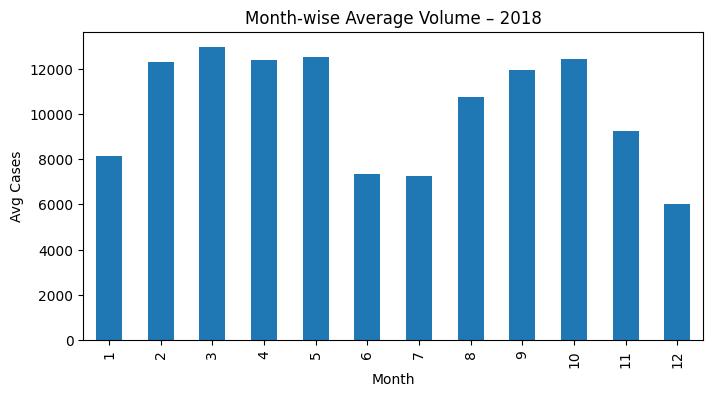

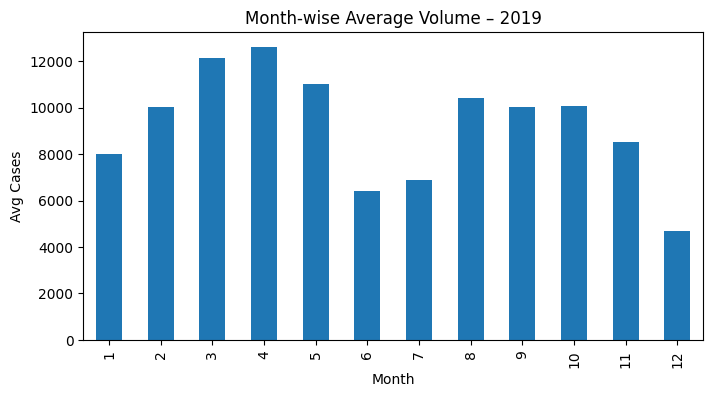

...

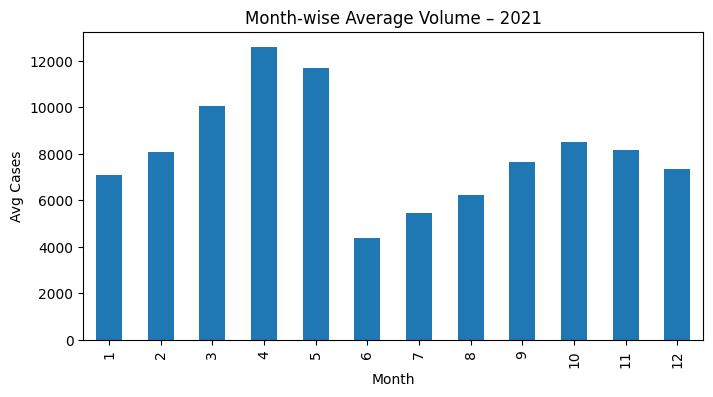

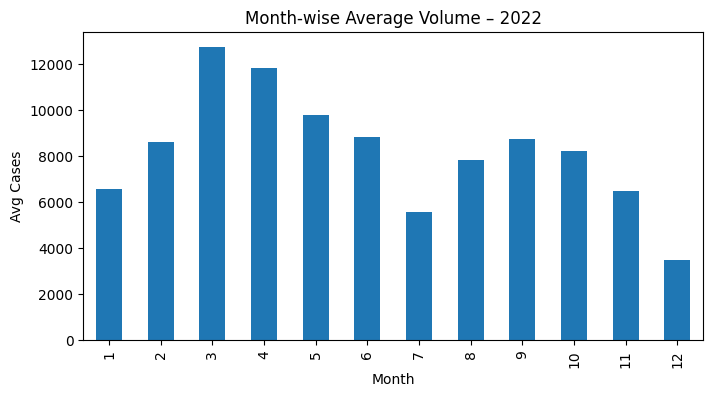

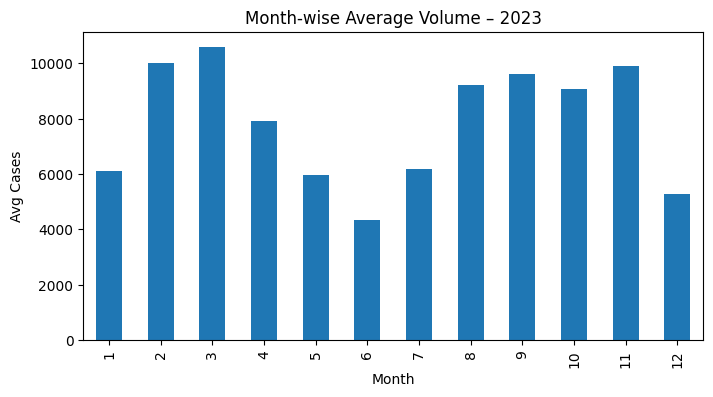

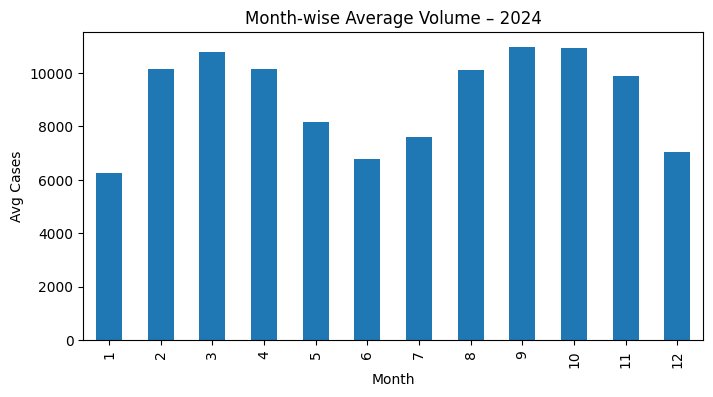

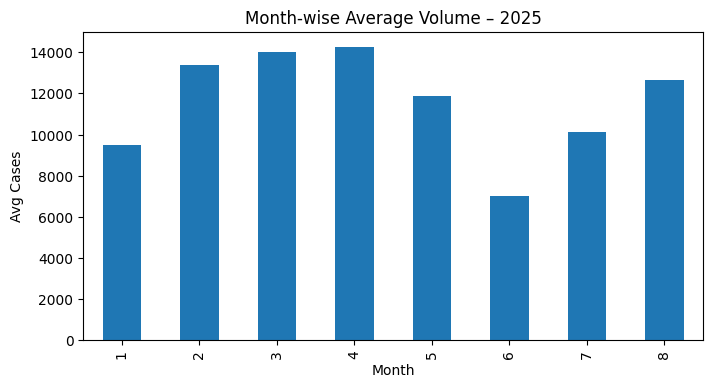

In [36]:
# 5c Month-wise & Day-wise Aggregations (Pattern Detection)
df['month'] = df['calendar_date'].dt.month

for year, df_year in df.groupby('year'):
    
    month_pattern = (
        df_year
        .groupby('month')['cases']
        .mean()
    )
    
    plt.figure(figsize=(8,4))
    month_pattern.plot(kind='bar')
    plt.title(f"Month-wise Average Volume – {year}")
    plt.xlabel("Month")
    plt.ylabel("Avg Cases")
    plt.show()


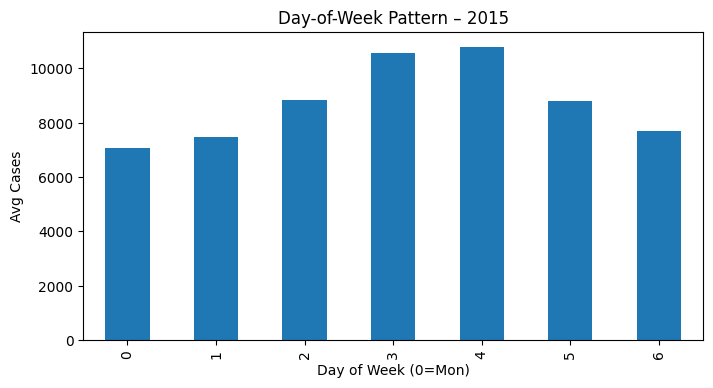

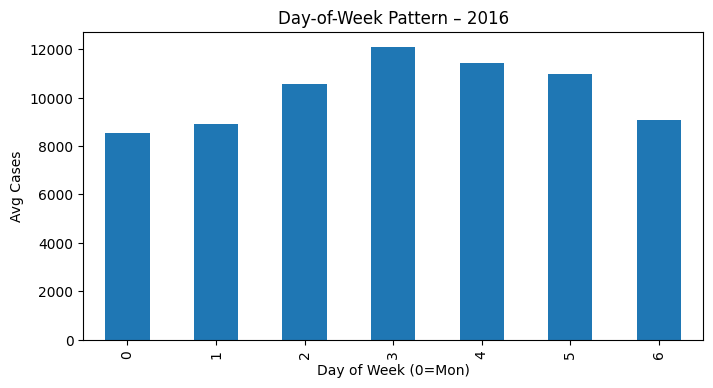

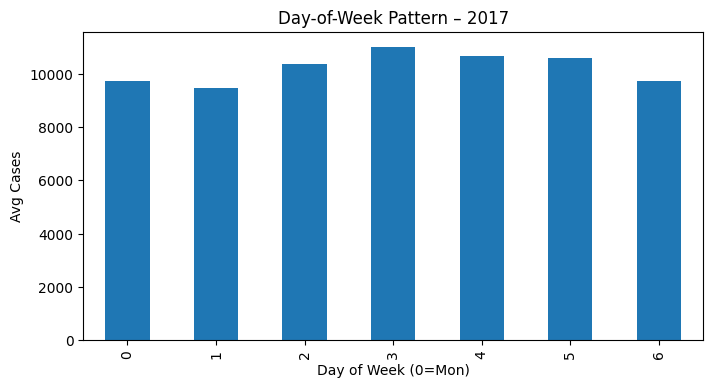

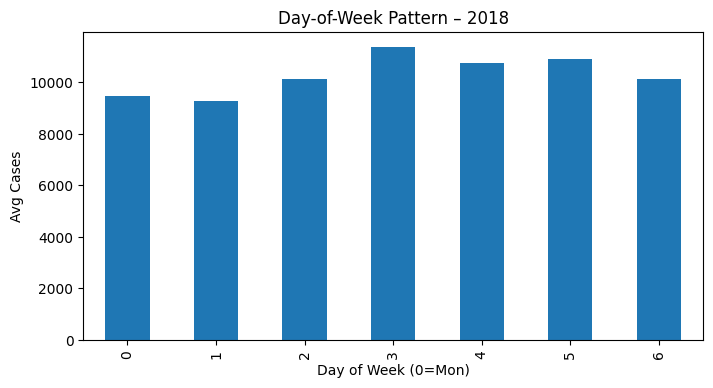

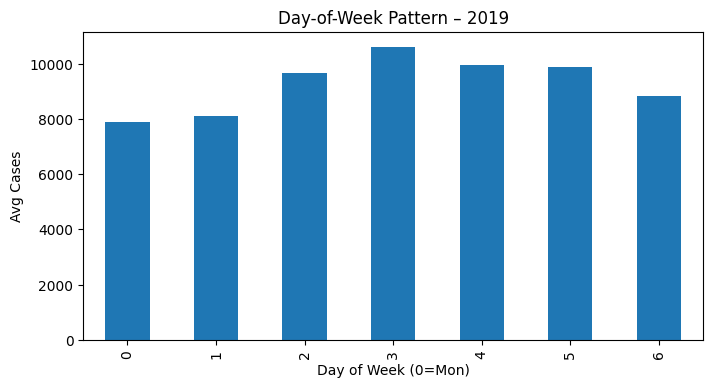

...

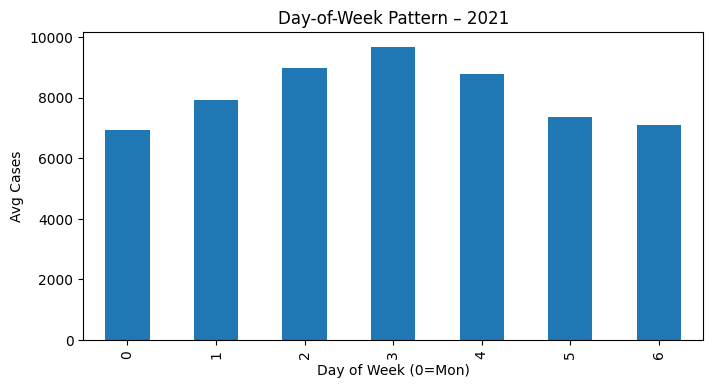

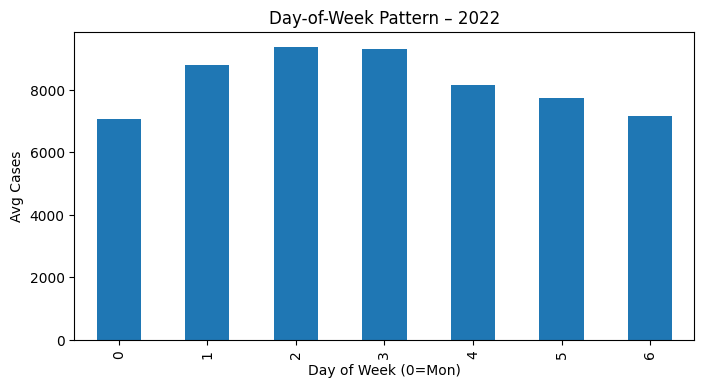

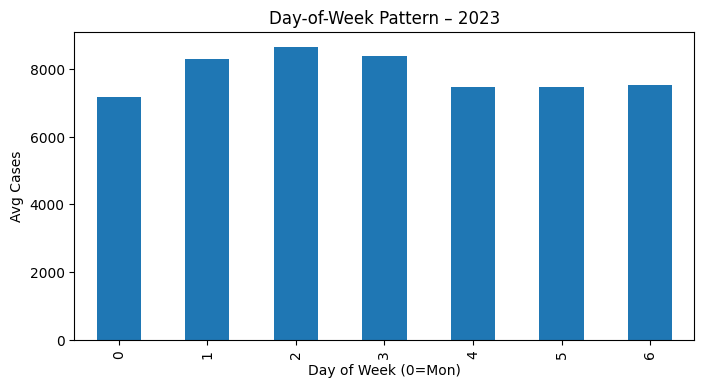

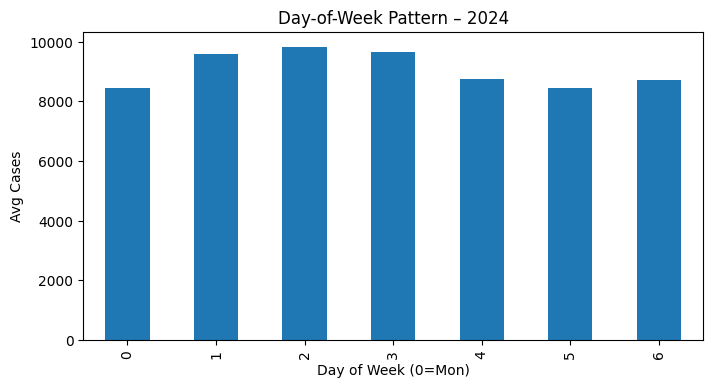

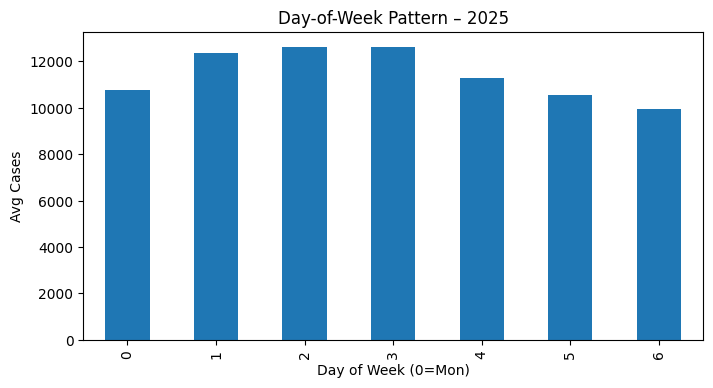

In [37]:
#5 c Day-of-Week Pattern (Year-wise)
df['day_of_week'] = df['calendar_date'].dt.dayofweek

for year, df_year in df.groupby('year'):
    
    dow_pattern = (
        df_year
        .groupby('day_of_week')['cases']
        .mean()
    )
    
    plt.figure(figsize=(8,4))
    dow_pattern.plot(kind='bar')
    plt.title(f"Day-of-Week Pattern – {year}")
    plt.xlabel("Day of Week (0=Mon)")
    plt.ylabel("Avg Cases")
    plt.show()


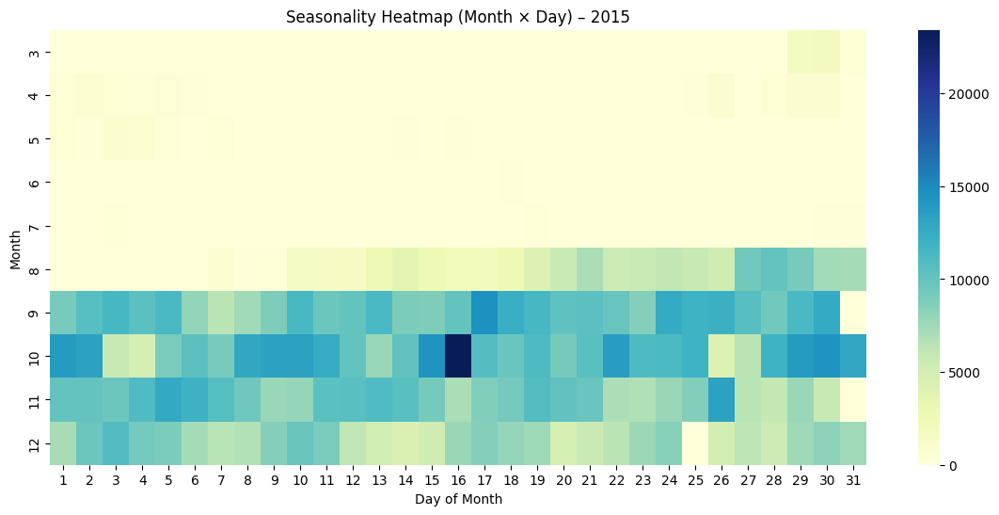

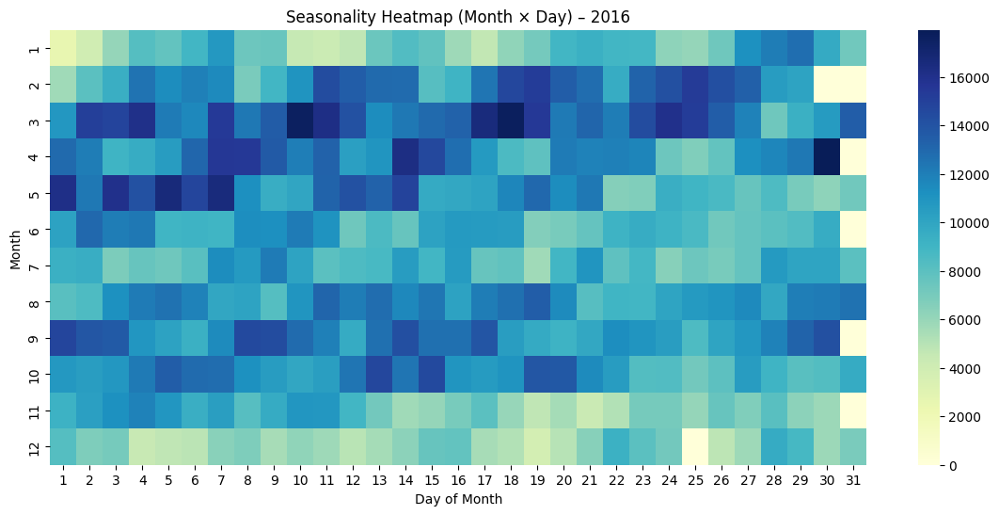

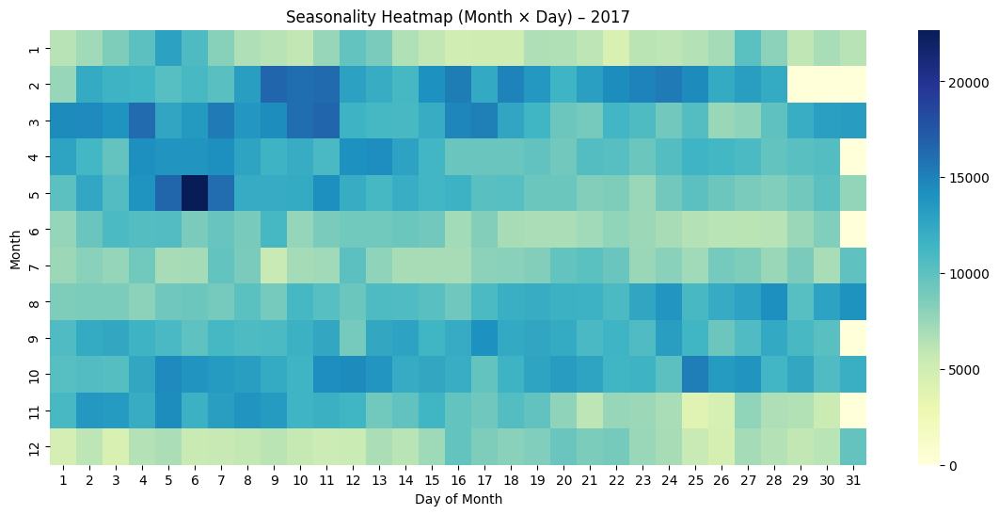

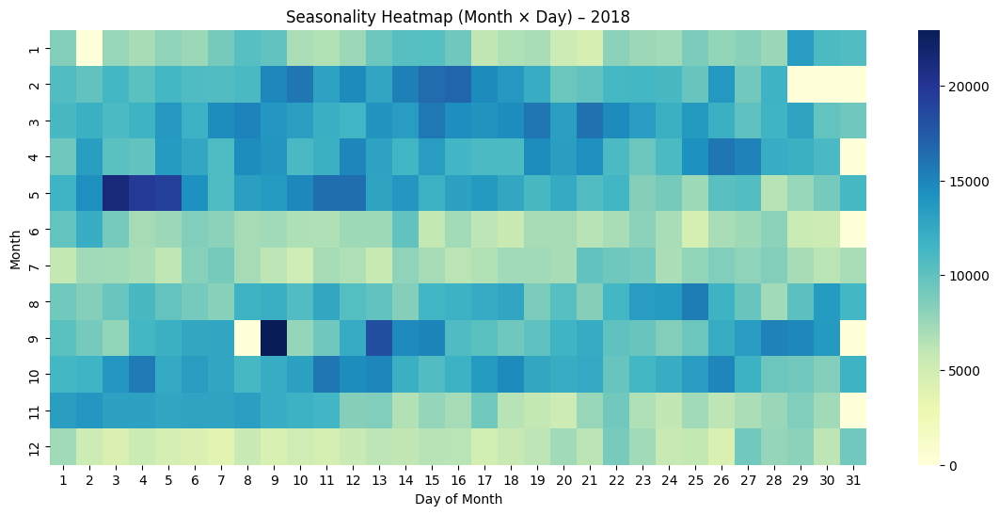

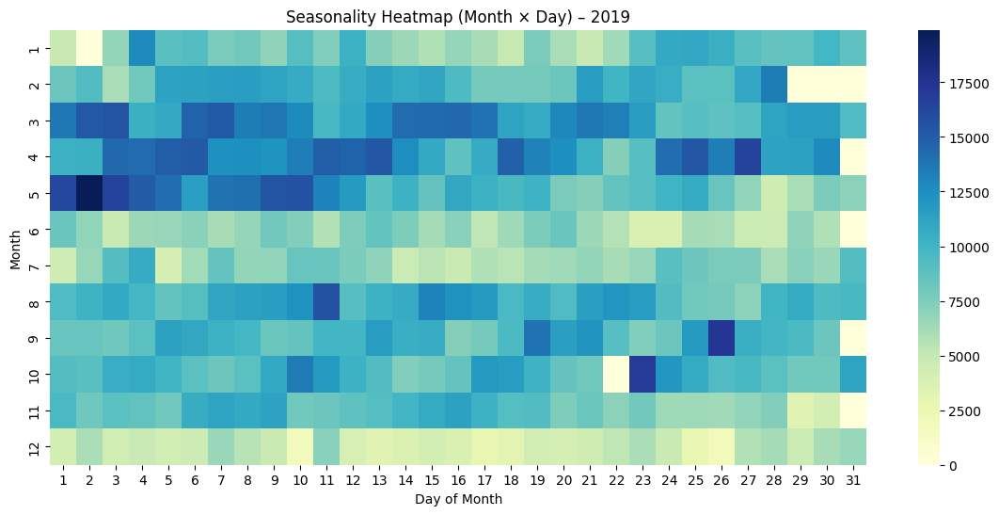

...

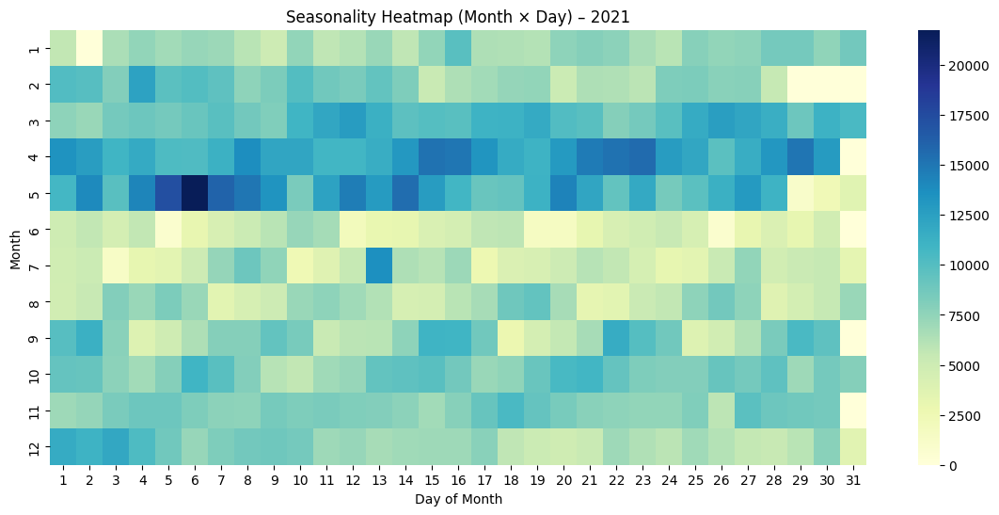

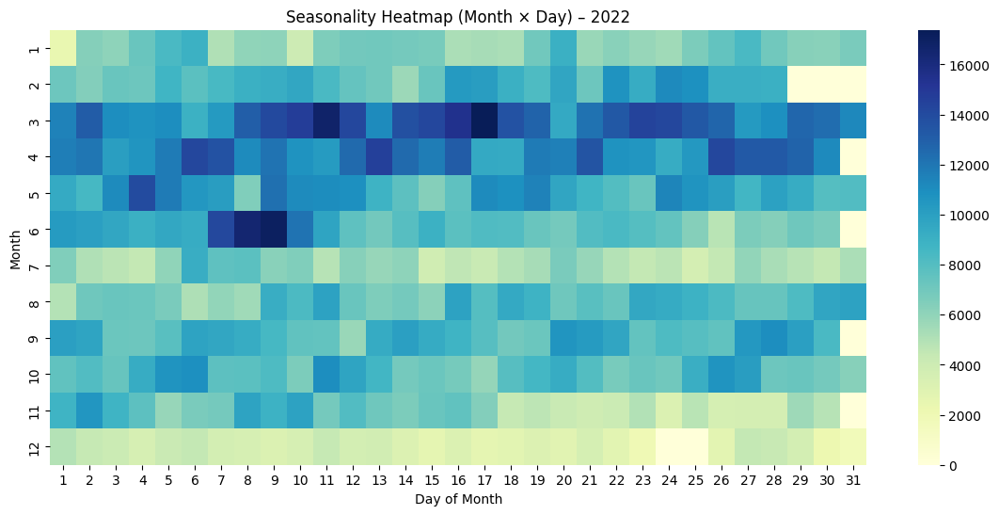

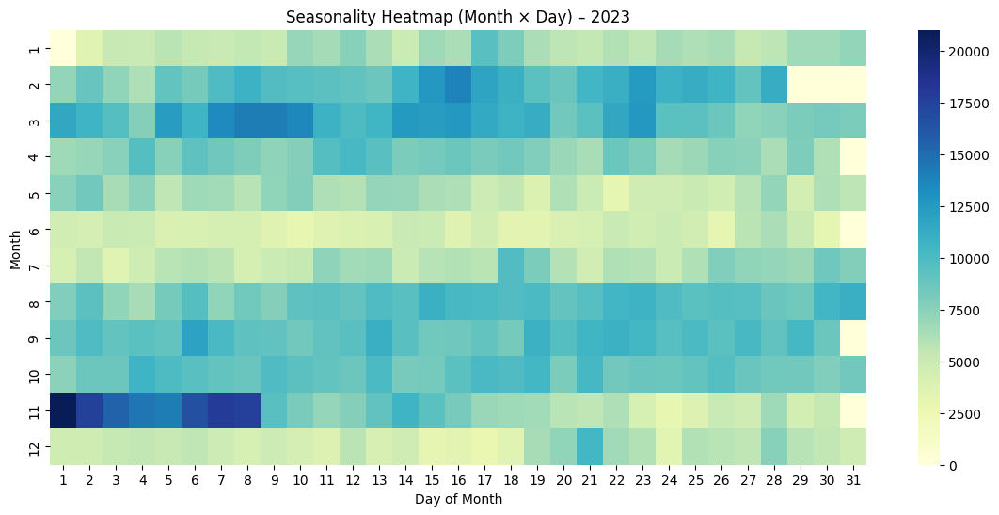

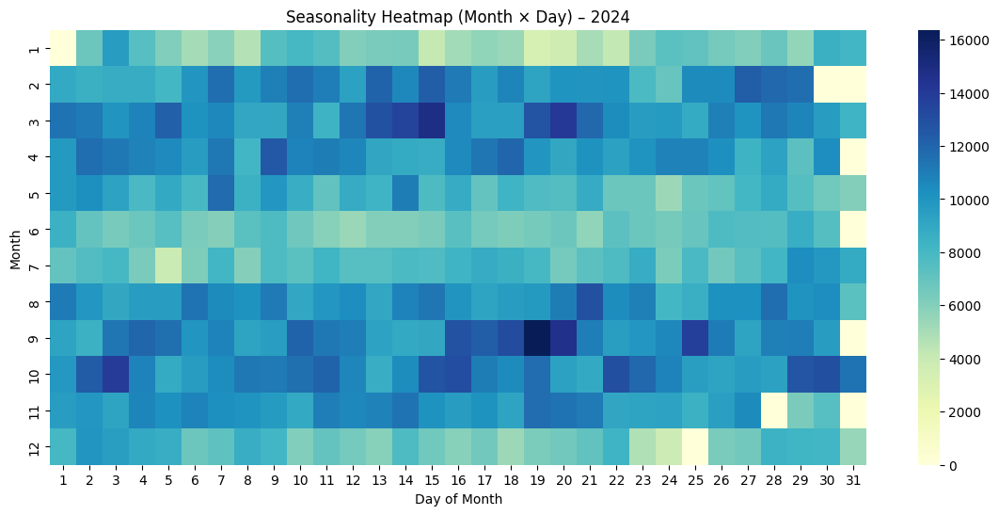

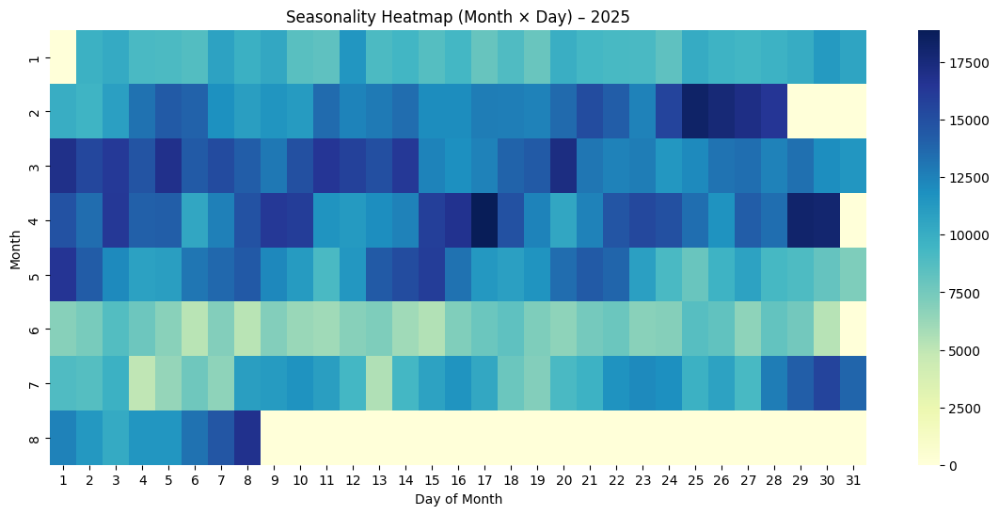

In [38]:
#5 d Heatmaps – Seasonality Over Time (Year-wise)
df['day'] = df['calendar_date'].dt.day

for year, df_year in df.groupby('year'):
    
    heatmap_data = (
        df_year
        .groupby(['month', 'day'])['cases']
        .mean()
        .unstack(fill_value=0)
    )
    
    plt.figure(figsize=(14,6))
    sns.heatmap(heatmap_data, cmap="YlGnBu")
    plt.title(f"Seasonality Heatmap (Month × Day) – {year}")
    plt.xlabel("Day of Month")
    plt.ylabel("Month")
    plt.show()


In [43]:
#6(a) Coefficient of Variation (CV) per Warehouse – Year-wise
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df['cases'] = df['cases'].astype(float)
df = df.sort_values('calendar_date')
cv_results = []

for year, df_year in df.groupby('year'):
    
    wh_daily = (
        df_year
        .groupby(['warehouse_id', 'calendar_date'])['cases']
        .sum()
        .reset_index()
    )
    
    for wh, grp in wh_daily.groupby('warehouse_id'):
        mean_val = grp['cases'].mean()
        std_val = grp['cases'].std()
        
        if mean_val > 0:
            cv = std_val / mean_val
        else:
            cv = np.nan
        
        cv_results.append({
            "Year": year,
            "Warehouse": wh,
            "Mean": mean_val,
            "Std": std_val,
            "Coefficient_of_Variation": cv
        })

cv_df = pd.DataFrame(cv_results)

cv_df.head()


,Year,Warehouse,Mean,Std,Coefficient_of_Variation
0,2015,6005,32214.157895,11639.616726,0.361320
1,2015,6014,36793.429577,17660.865563,0.480001
2,2015,6022,27168.180233,20841.212848,0.767118
3,2015,6029,33789.771429,13514.829880,0.399968
4,2015,6041,26782.650307,18381.878156,0.686335


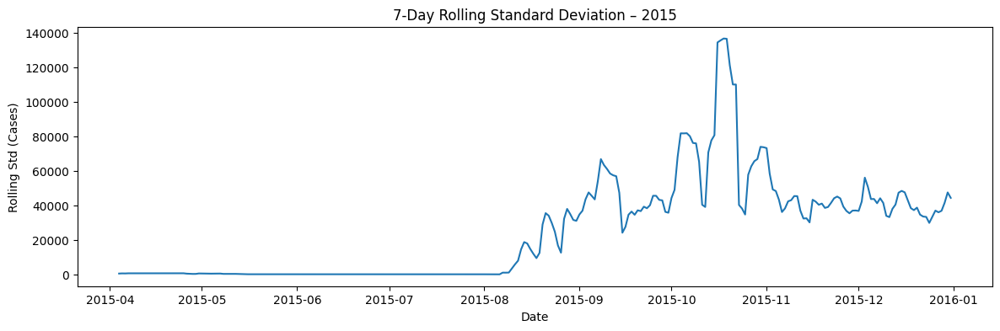

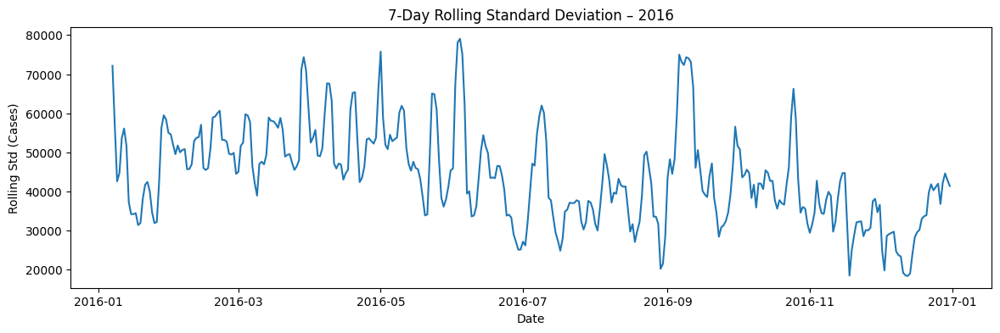

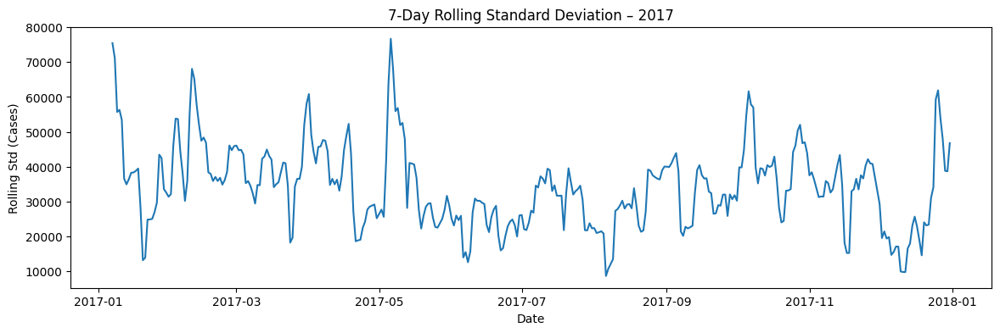

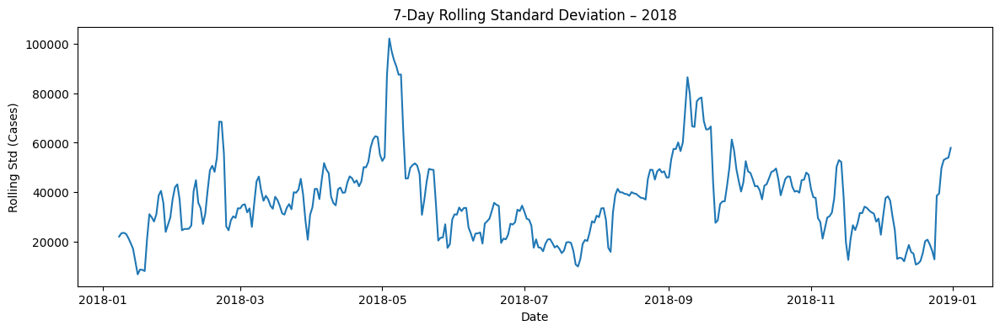

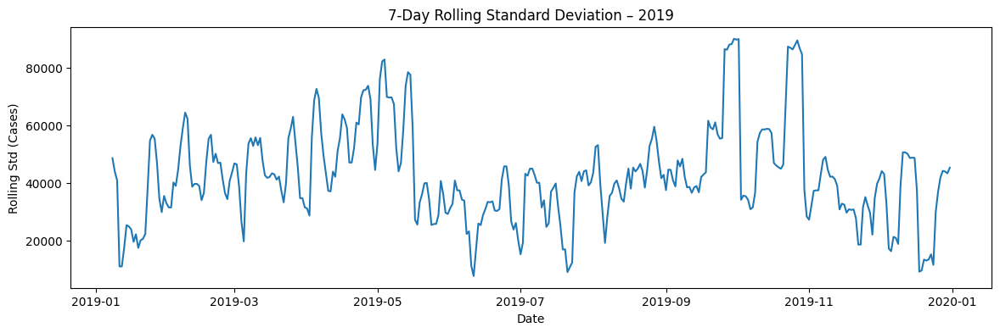

...

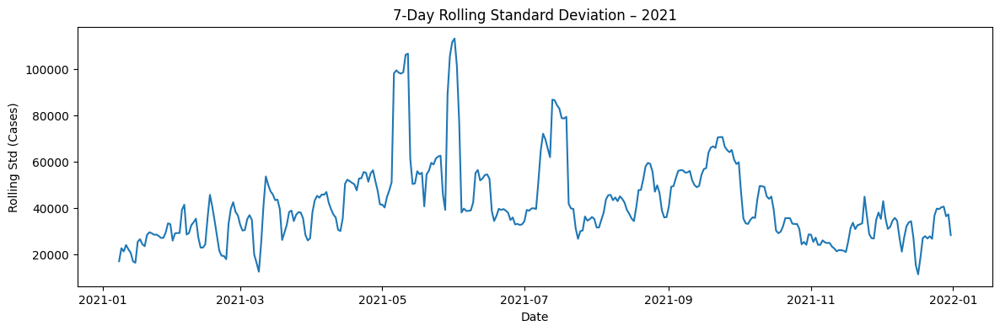

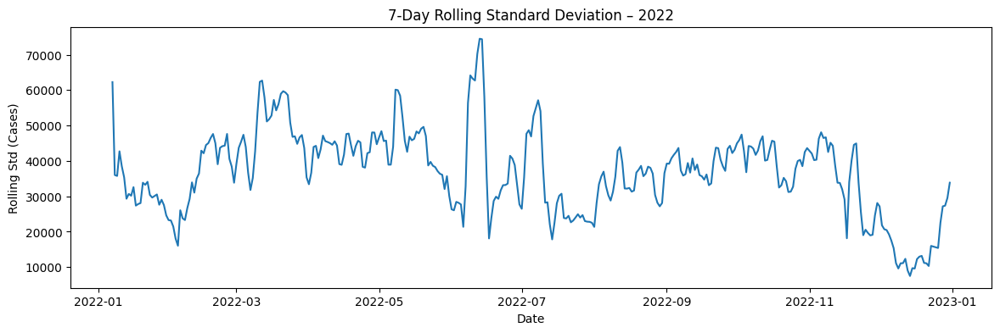

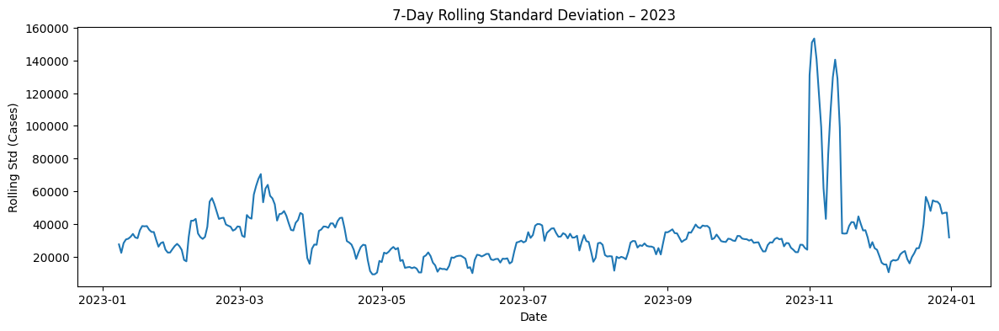

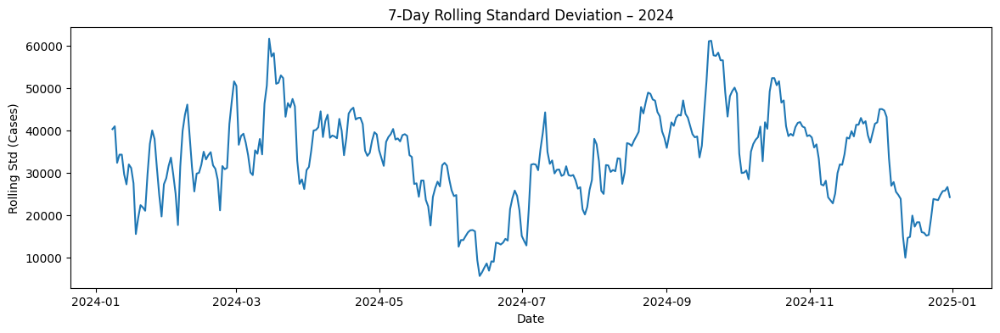

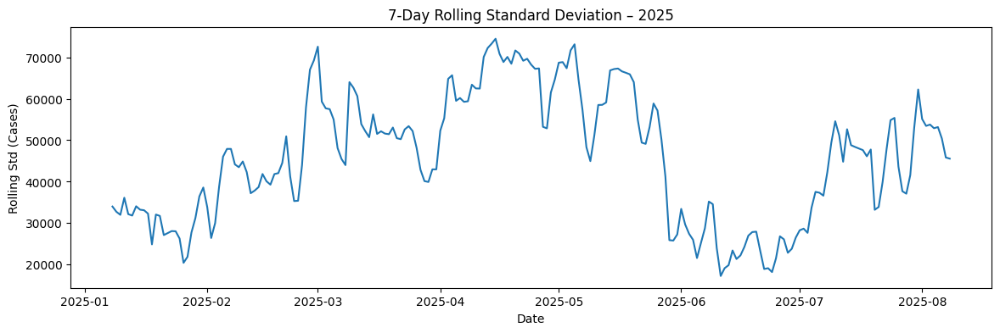

In [44]:
#6(b) Rolling Standard Deviation (Time-Series Variability)
for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    rolling_std = daily.rolling(window=7).std()
    
    plt.figure(figsize=(14,4))
    plt.plot(rolling_std)
    plt.title(f"7-Day Rolling Standard Deviation – {year}")
    plt.xlabel("Date")
    plt.ylabel("Rolling Std (Cases)")
    plt.show()


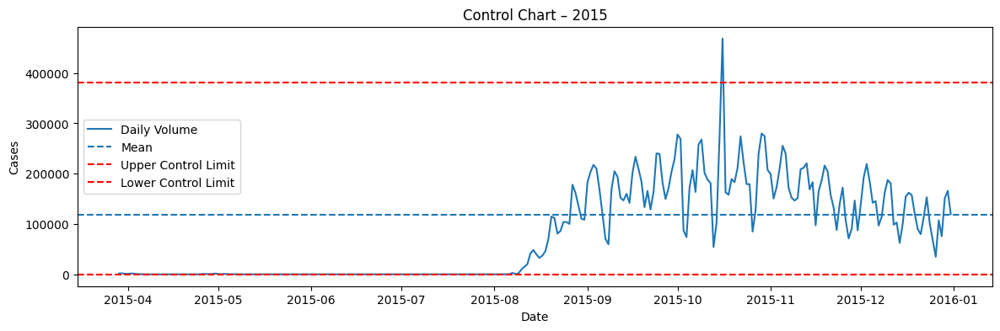

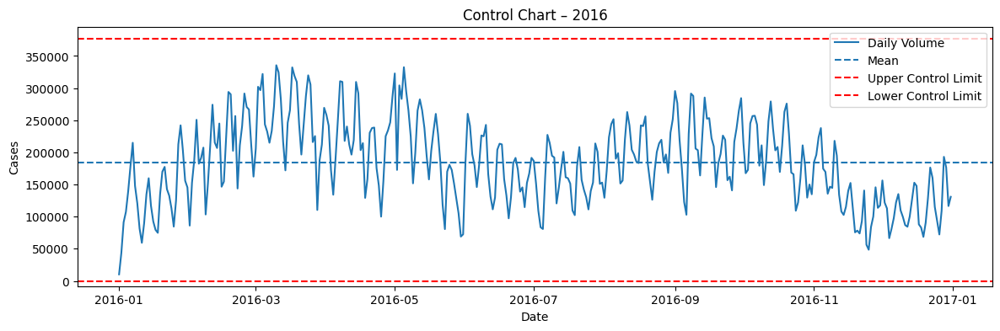

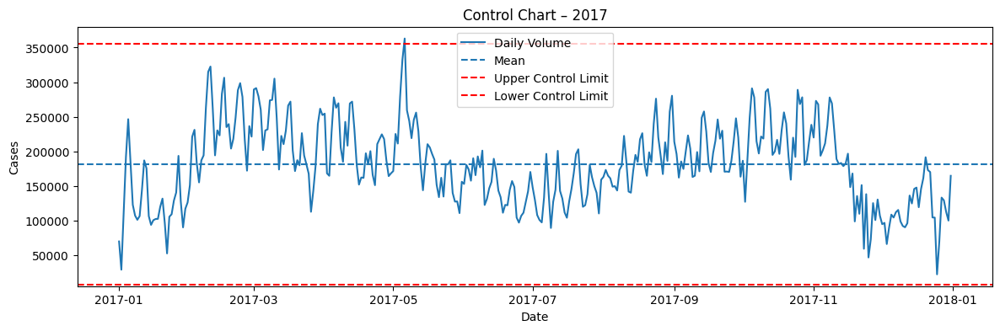

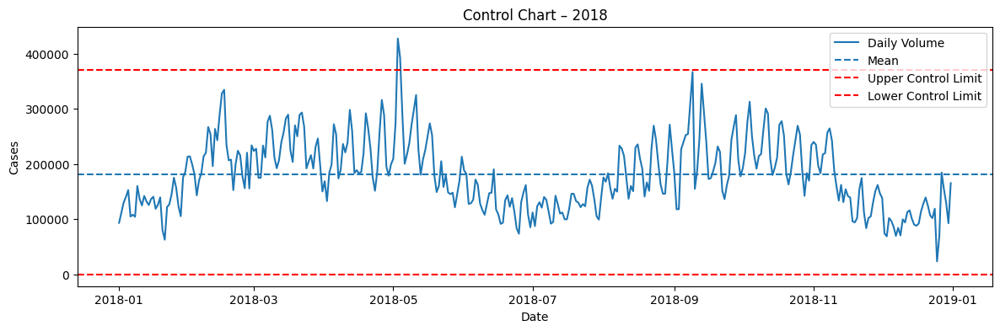

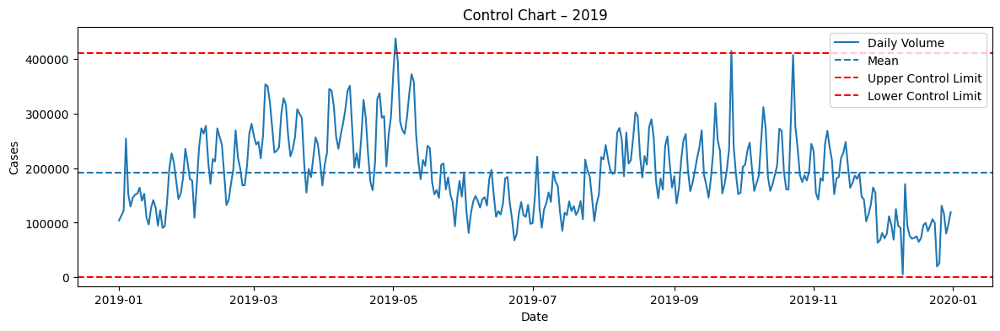

...

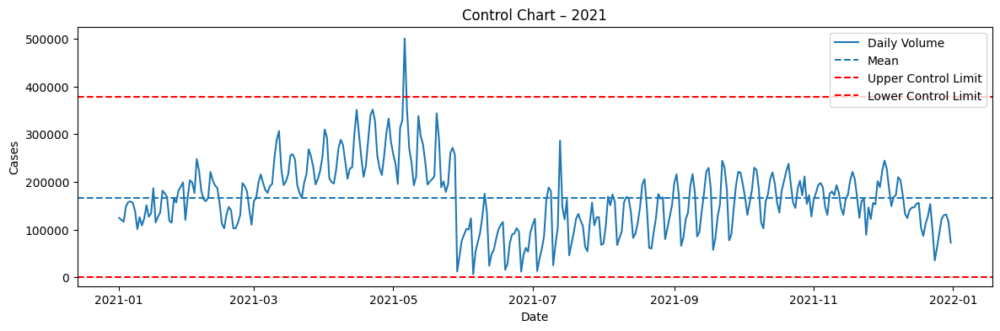

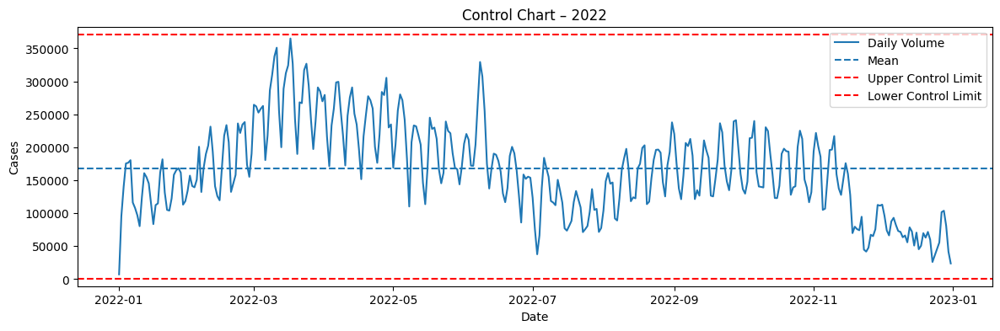

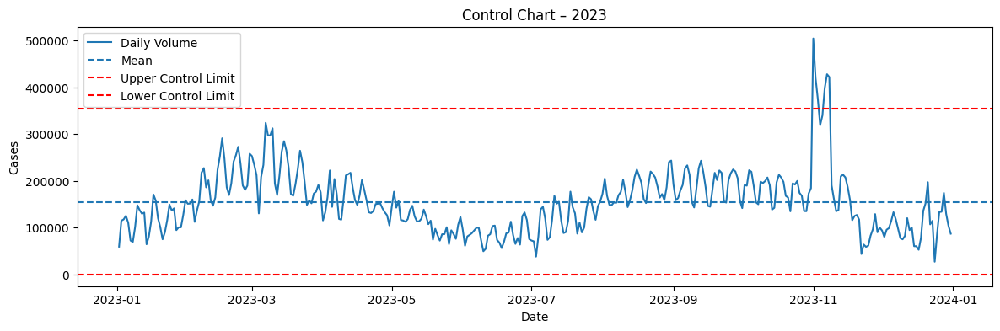

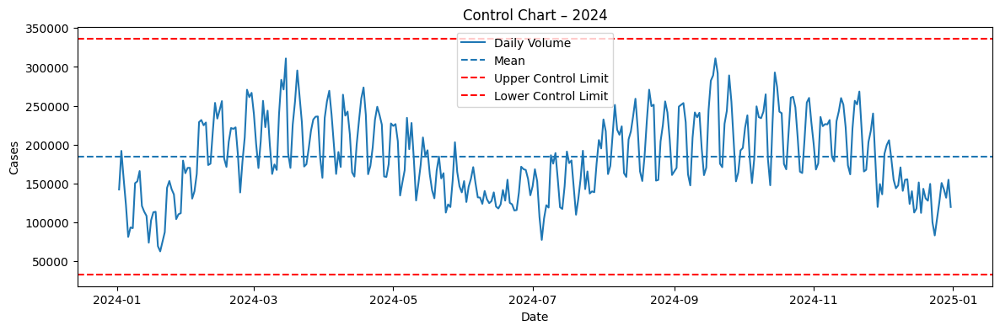

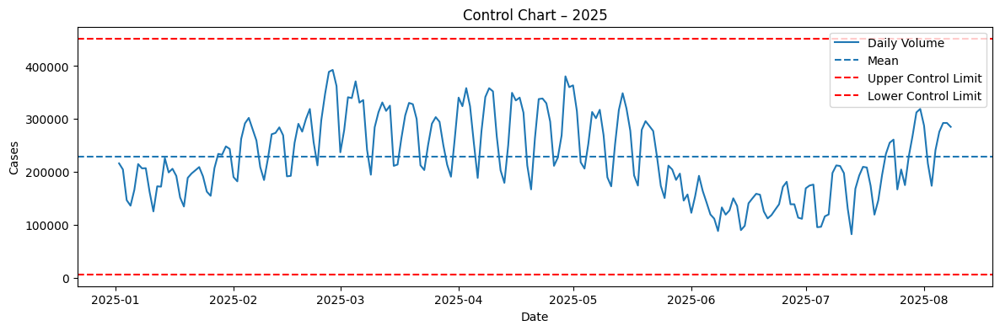

In [23]:
# 6(c) Control Charts (Detect Abnormal Periods)
for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    mean_val = daily.mean()
    std_val = daily.std()
    
    upper_limit = mean_val + 3 * std_val
    lower_limit = max(mean_val - 3 * std_val, 0)
    
    plt.figure(figsize=(14,4))
    plt.plot(daily, label="Daily Volume")
    plt.axhline(mean_val, linestyle='--', label="Mean")
    plt.axhline(upper_limit, color='red', linestyle='--', label="Upper Control Limit")
    plt.axhline(lower_limit, color='red', linestyle='--', label="Lower Control Limit")
    
    plt.title(f"Control Chart – {year}")
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.show()


In [45]:
#7(a) Z-Score of Daily Volume (Year-wise)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import holidays

df['cases'] = df['cases'].astype(float)
df = df.sort_values('calendar_date')
from scipy.stats import zscore

outlier_records = []

for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    z_scores = zscore(daily.fillna(0))
    
    outliers = daily[np.abs(z_scores) > 3]
    
    for date, value in outliers.items():
        outlier_records.append({
            "Year": year,
            "Date": date,
            "Daily Volume": value,
            "Z-score": z_scores[daily.index.get_loc(date)]
        })

outlier_df = pd.DataFrame(outlier_records)
outlier_df.head()


,Year,Date,Daily Volume,Z-score
0,2015,2015-10-16,468405.0,3.996110
1,2017,2017-05-06,363041.0,3.144068
2,2018,2018-05-03,427631.0,3.893223
3,2018,2018-05-04,392964.0,3.346456
4,2019,2019-05-02,437758.0,3.379157


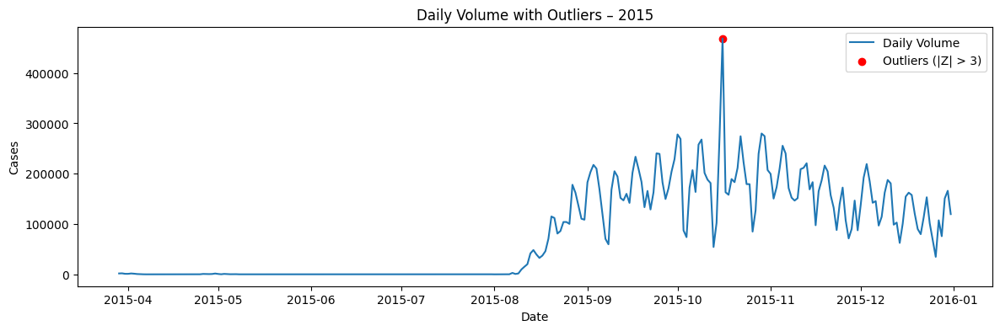

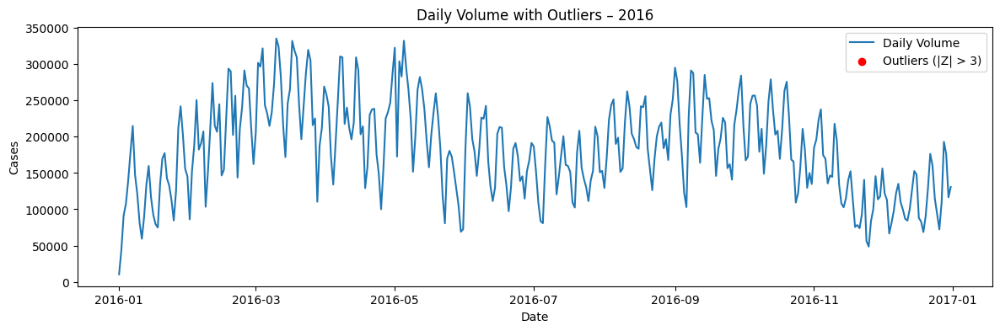

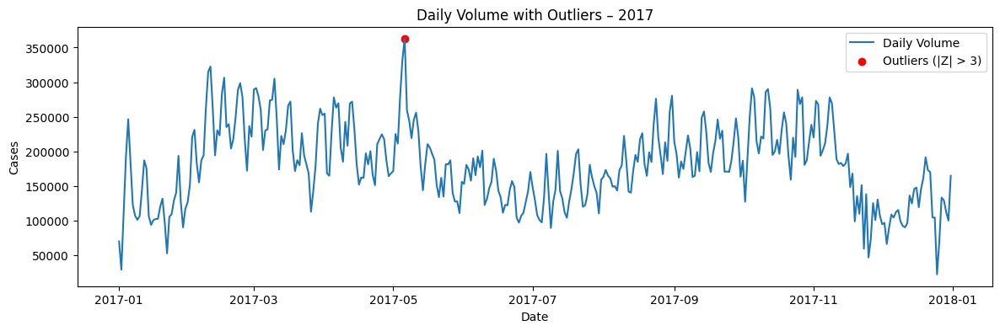

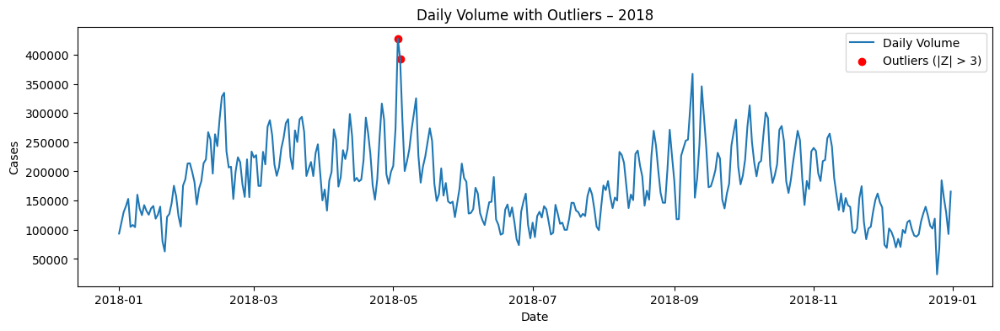

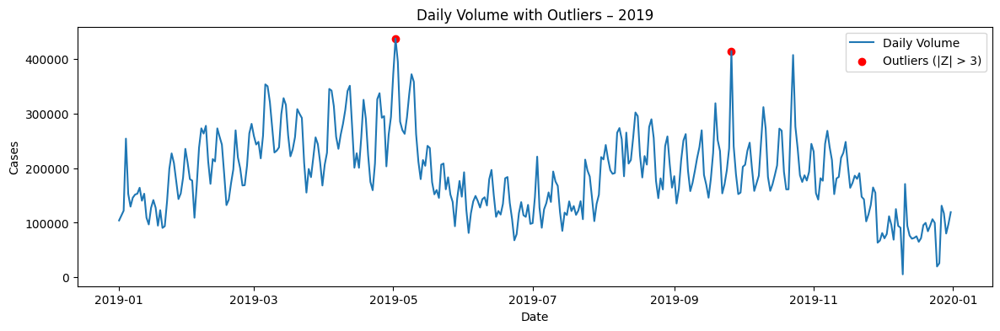

...

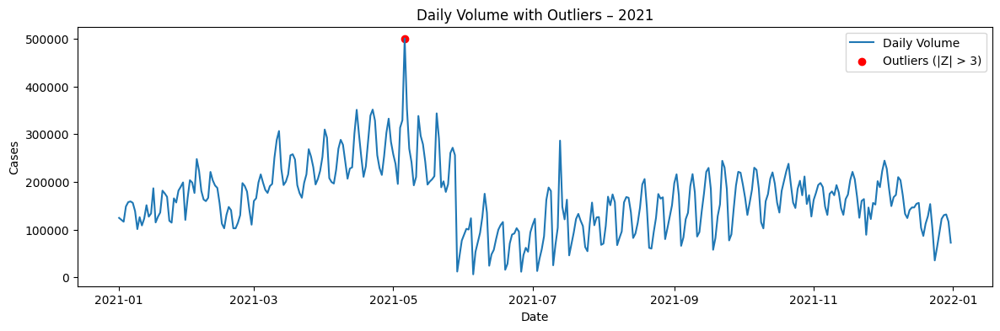

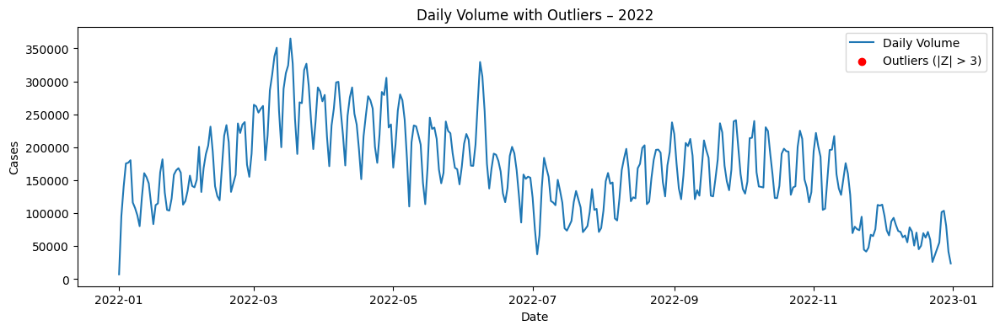

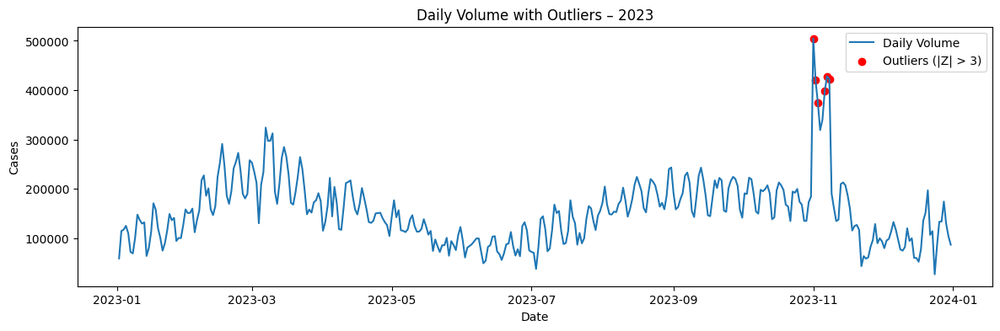

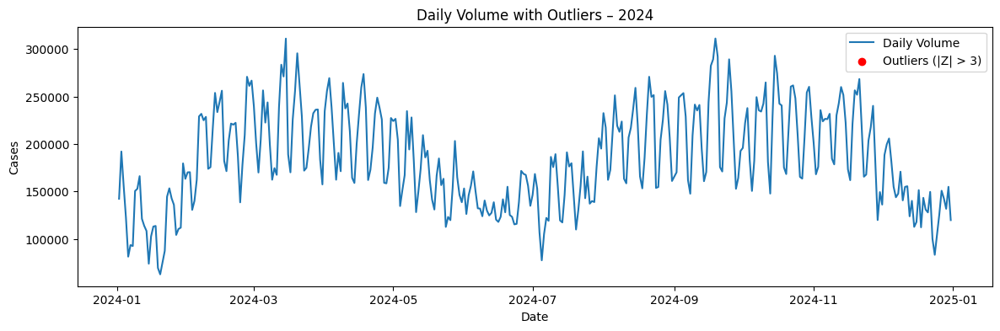

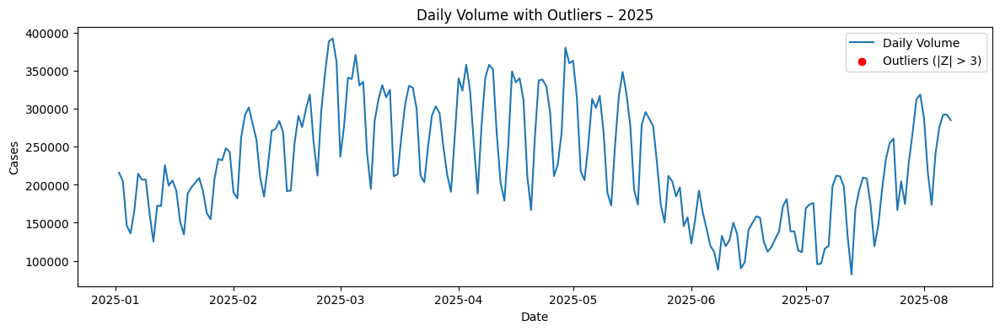

In [26]:
#7(b) Visual Line Plots with Outlier Annotations
for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    z_scores = zscore(daily.fillna(0))
    outlier_dates = daily.index[np.abs(z_scores) > 3]
    
    plt.figure(figsize=(14,4))
    plt.plot(daily, label="Daily Volume")
    plt.scatter(
        outlier_dates,
        daily.loc[outlier_dates],
        color='red',
        label="Outliers (|Z| > 3)"
    )
    
    plt.title(f"Daily Volume with Outliers – {year}")
    plt.xlabel("Date")
    plt.ylabel("Cases")
    plt.legend()
    plt.show()


In [27]:
#7(c)  Context-Aware Analysis (Holidays)
us_holidays = holidays.US()

outlier_df["Is_Holiday"] = outlier_df["Date"].isin(us_holidays)

outlier_df.head()



,Year,Date,Daily Volume,Z-score,Is_Holiday
0,2015,2015-10-16,468405.0,3.996110,False
1,2017,2017-05-06,363041.0,3.144068,False
2,2018,2018-05-03,427631.0,3.893223,False
3,2018,2018-05-04,392964.0,3.346456,False
4,2019,2019-05-02,437758.0,3.379157,False


In [28]:
outlier_df.groupby("Is_Holiday").size()


Is_Holiday
False    14
dtype: int64

In [30]:
#8(a) 📆 Aggregations by Week & Month (Year-wise)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df['cases'] = df['cases'].astype(float)
df['calendar_date'] = pd.to_datetime(df['calendar_date'])
df['year'] = df['calendar_date'].dt.year
df = df.sort_values('calendar_date')


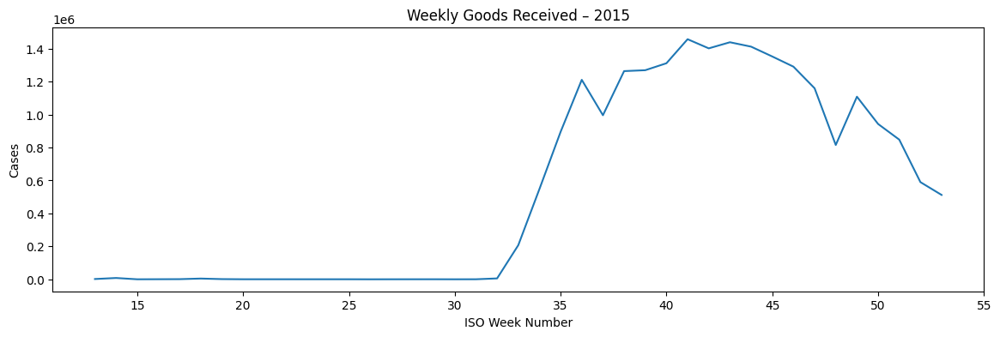

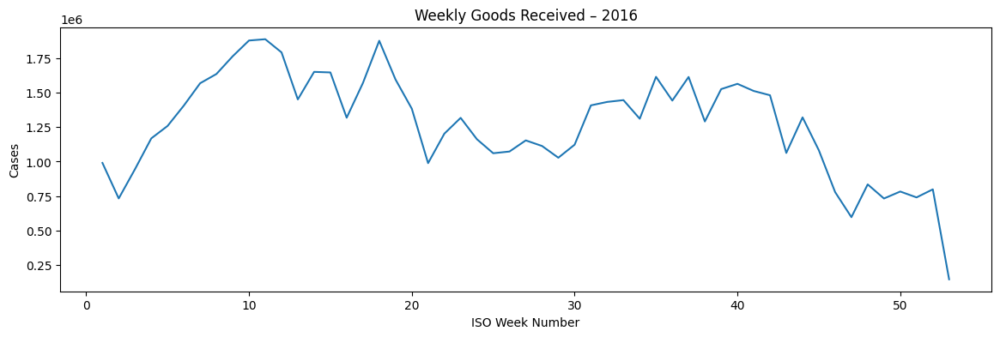

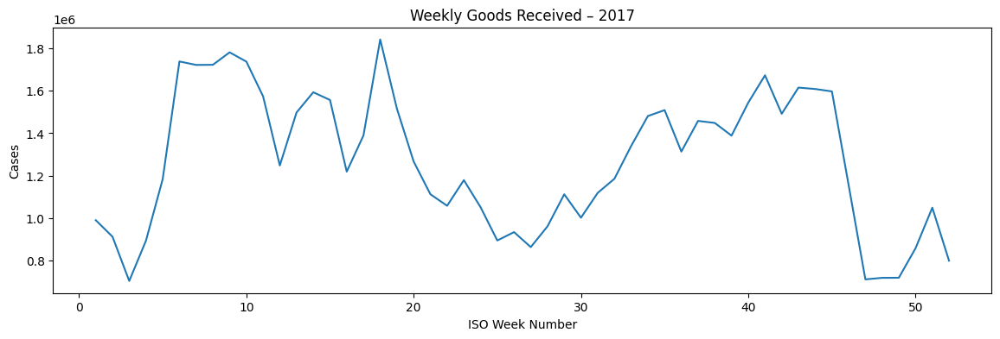

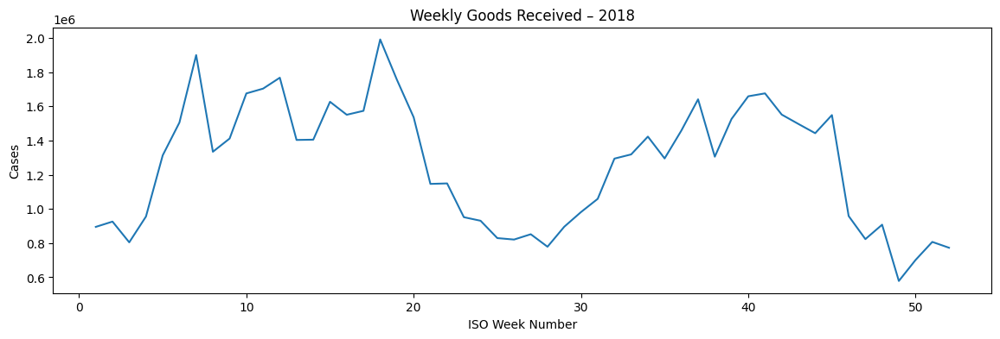

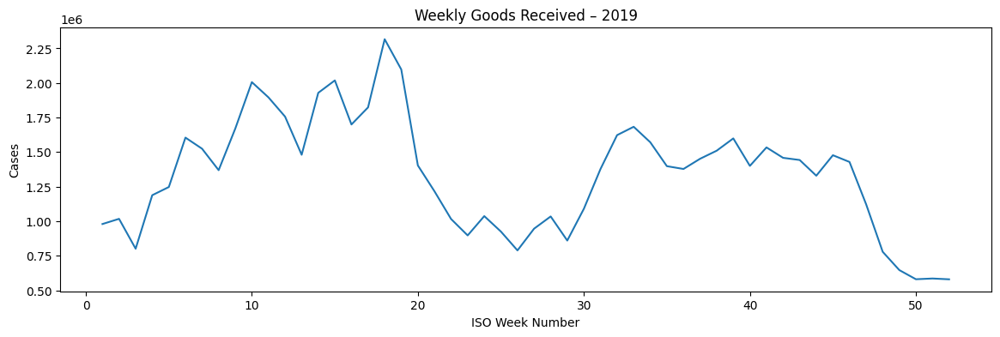

...

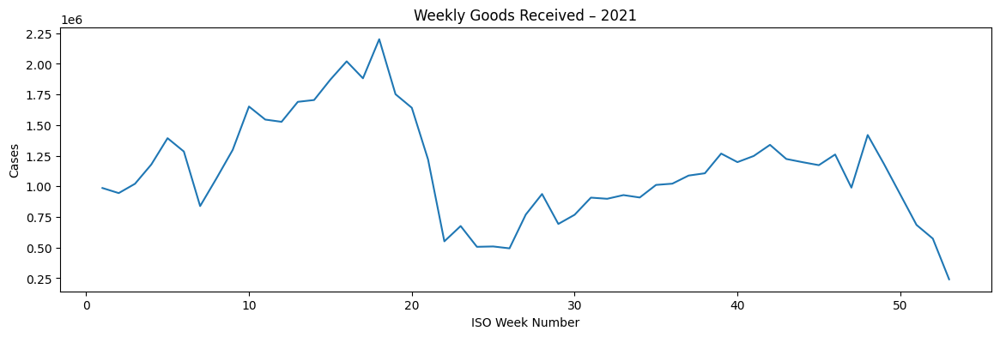

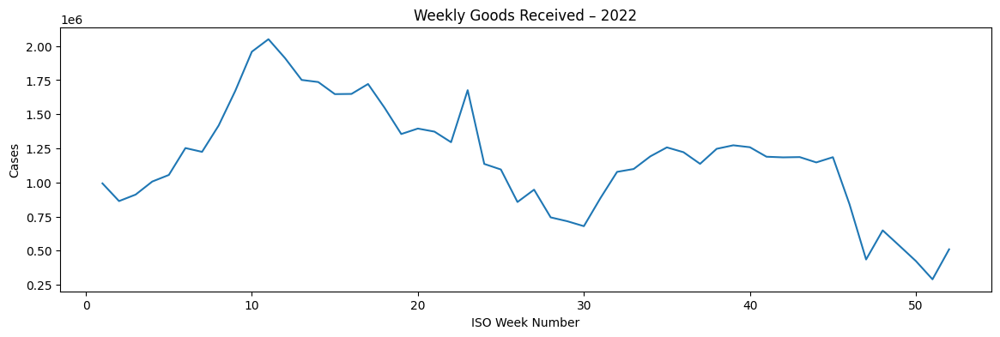

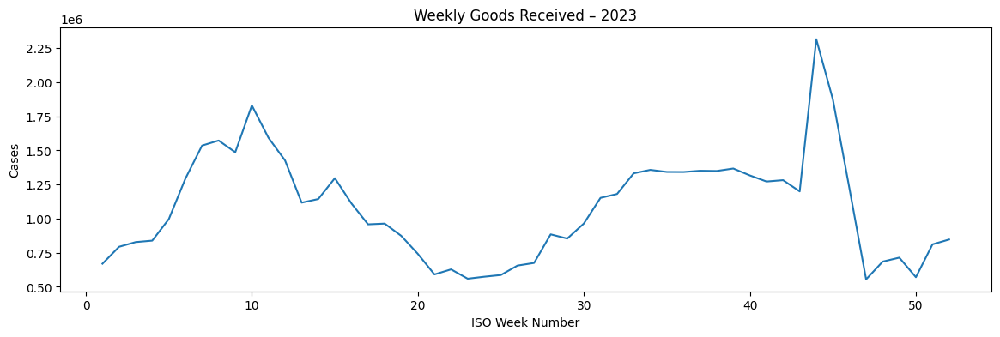

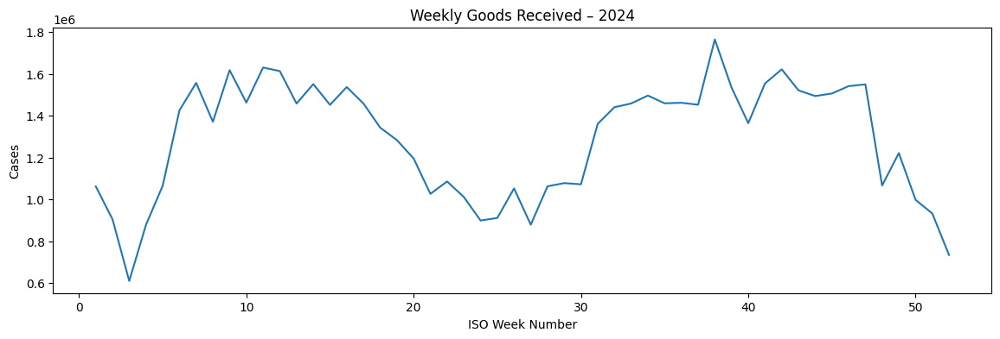

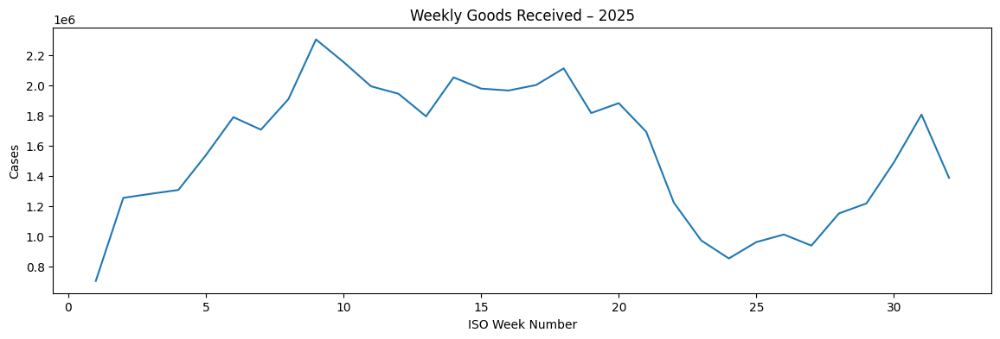

In [31]:
df['week'] = df['calendar_date'].dt.isocalendar().week

for year, df_year in df.groupby('year'):
    
    weekly = (
        df_year
        .groupby('week')['cases']
        .sum()
    )
    
    plt.figure(figsize=(14,4))
    plt.plot(weekly.index, weekly.values)
    plt.title(f"Weekly Goods Received – {year}")
    plt.xlabel("ISO Week Number")
    plt.ylabel("Cases")
    plt.show()


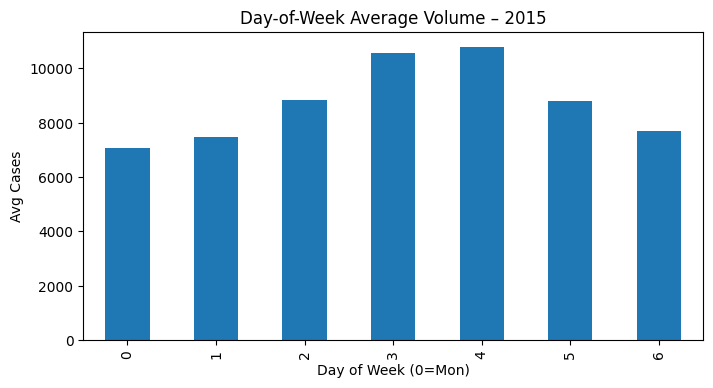

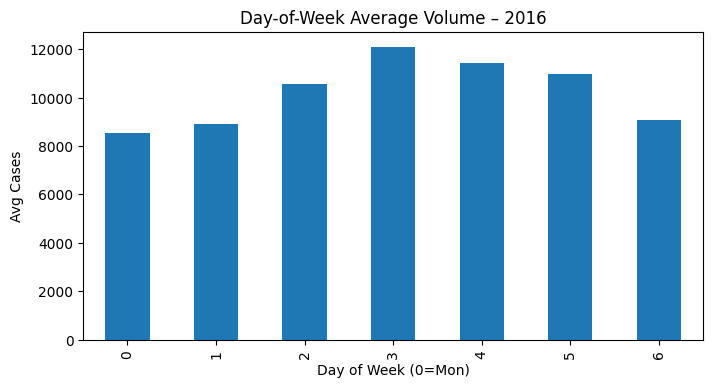

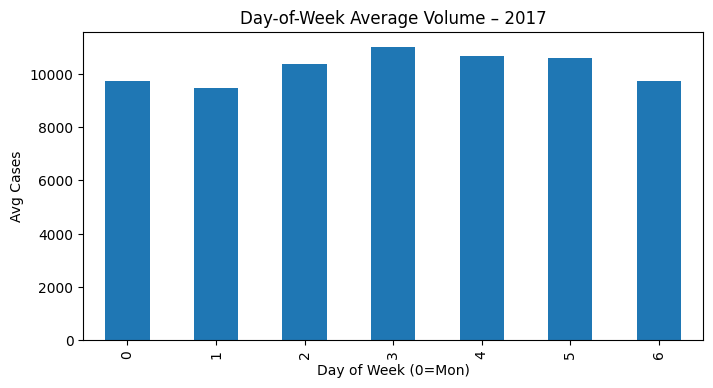

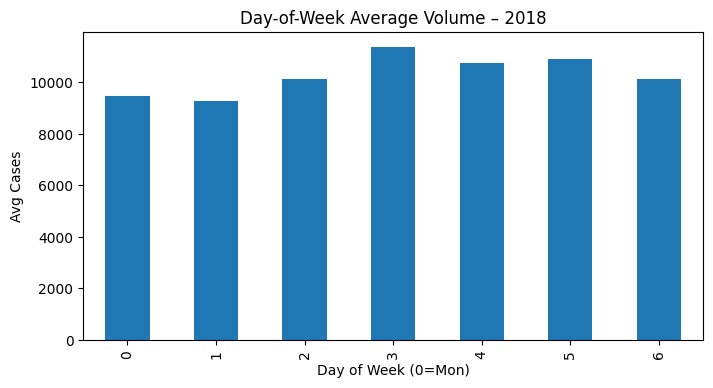

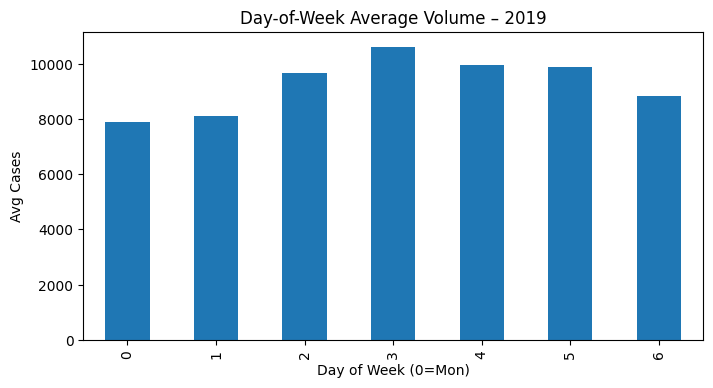

...

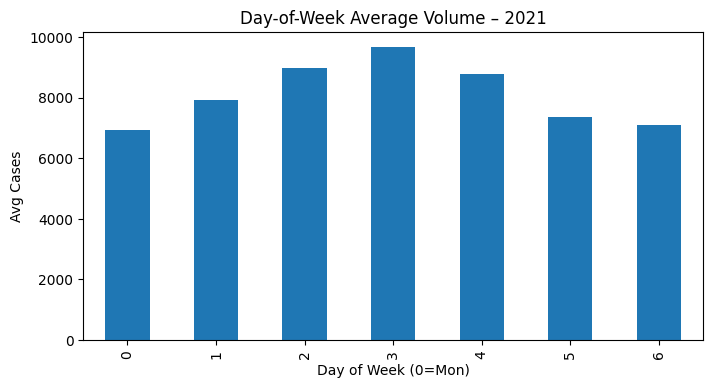

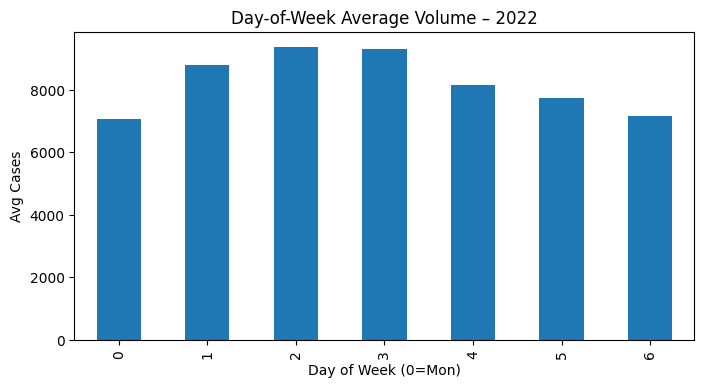

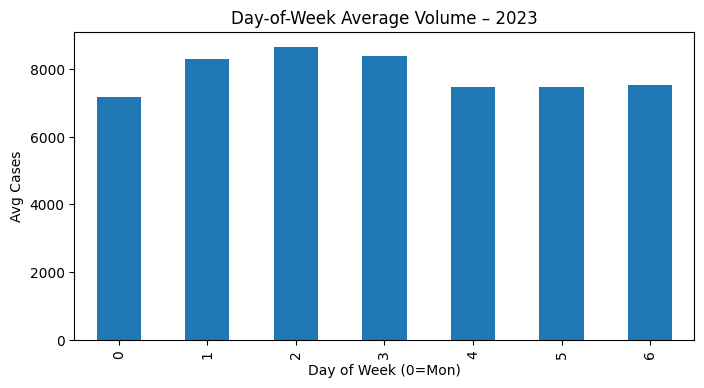

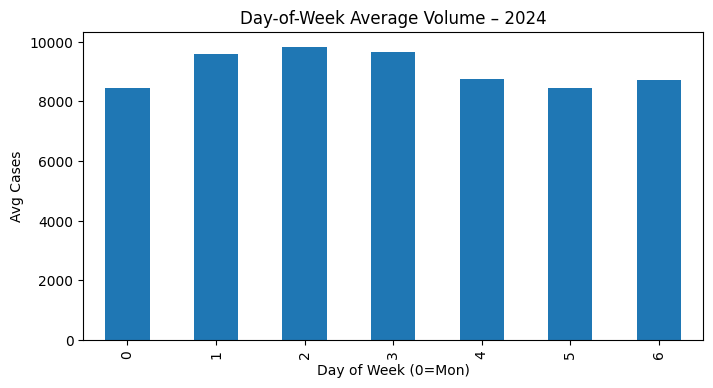

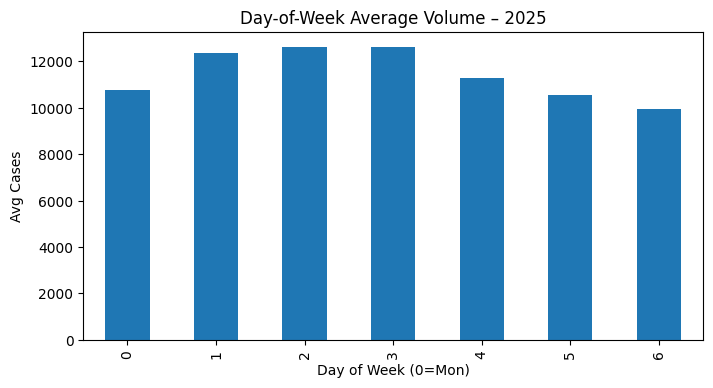

In [33]:
#8(b) 🗓️ Weekday vs Weekend Analysis (Day-of-Week)
df['day_of_week'] = df['calendar_date'].dt.dayofweek  # 0=Mon, 6=Sun

for year, df_year in df.groupby('year'):
    
    dow_avg = (
        df_year
        .groupby('day_of_week')['cases']
        .mean()
    )
    
    plt.figure(figsize=(8,4))
    dow_avg.plot(kind='bar')
    plt.title(f"Day-of-Week Average Volume – {year}")
    plt.xlabel("Day of Week (0=Mon)")
    plt.ylabel("Avg Cases")
    plt.show()


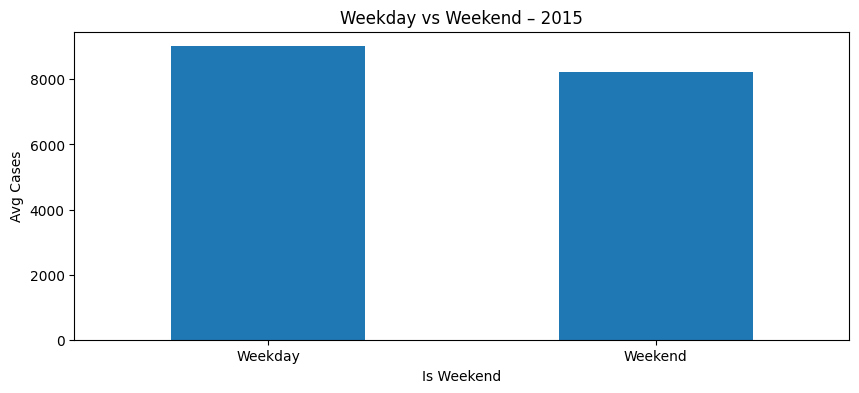

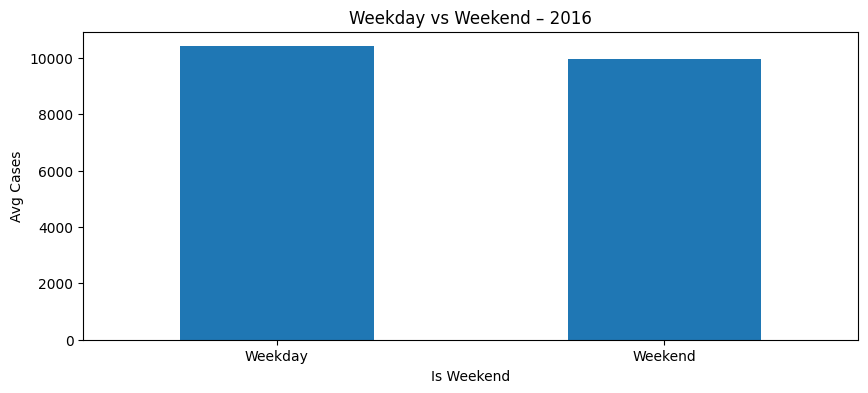

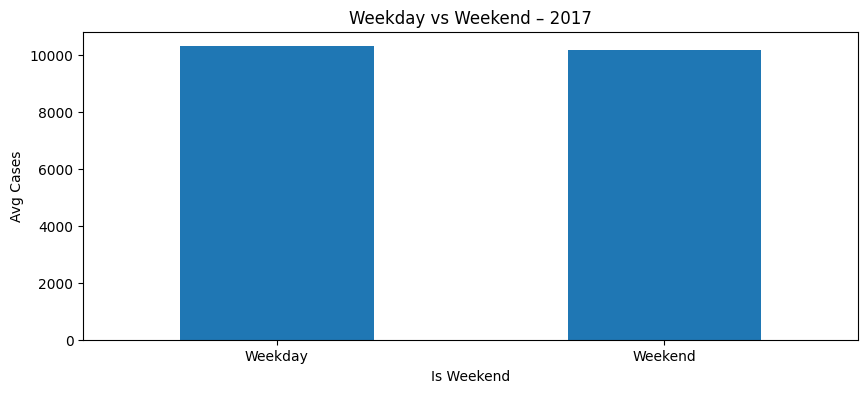

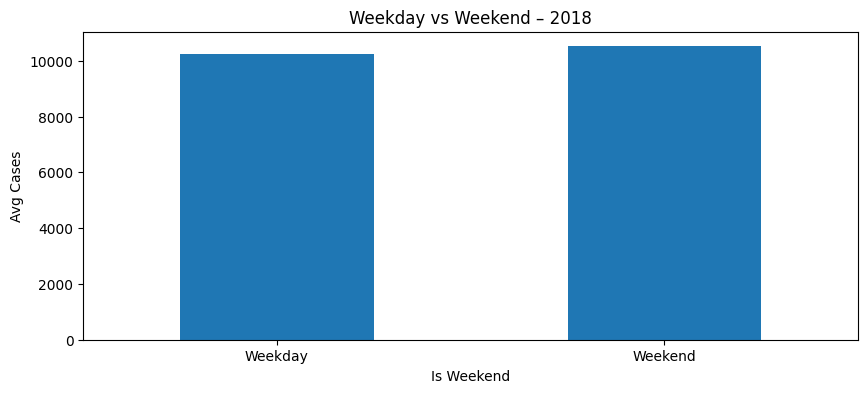

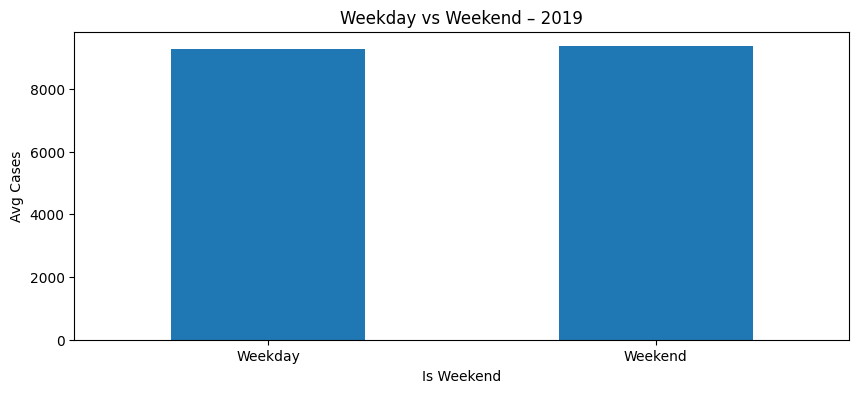

...

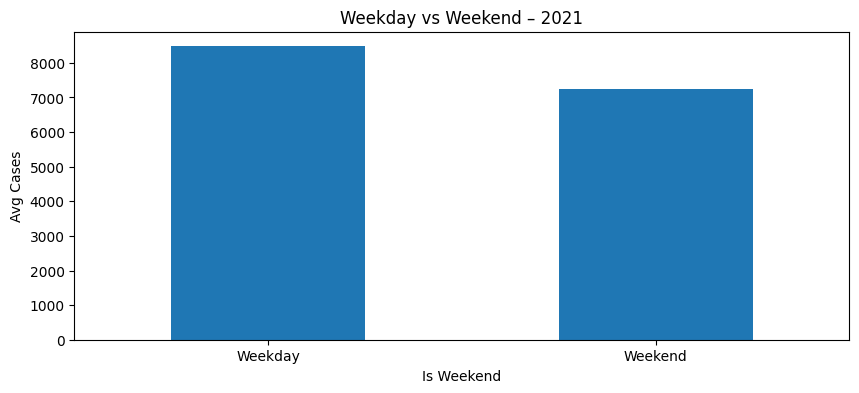

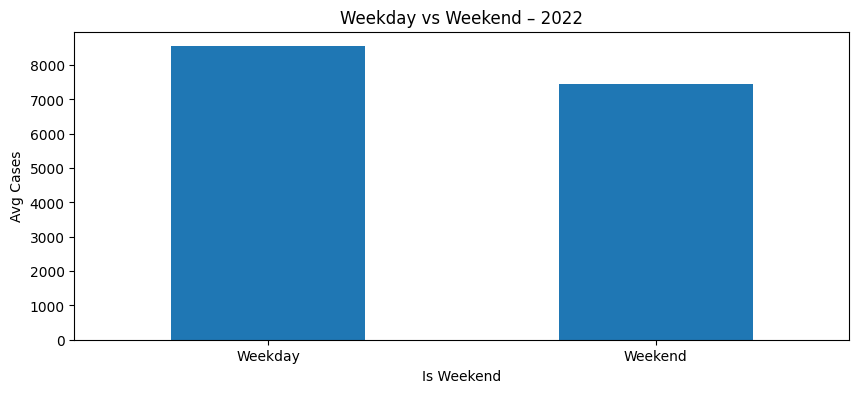

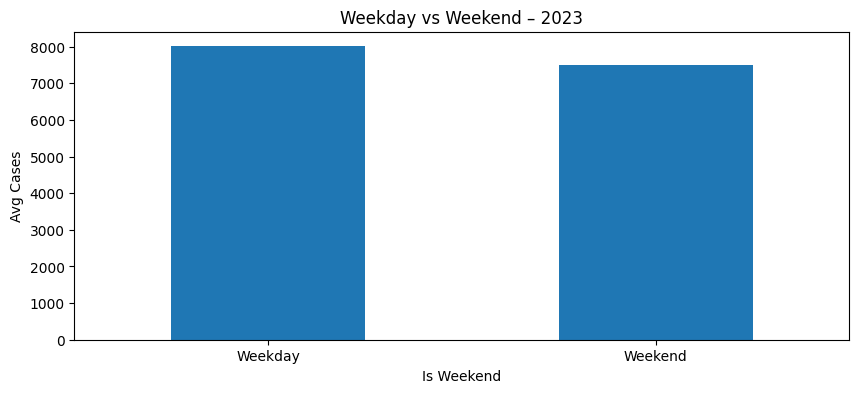

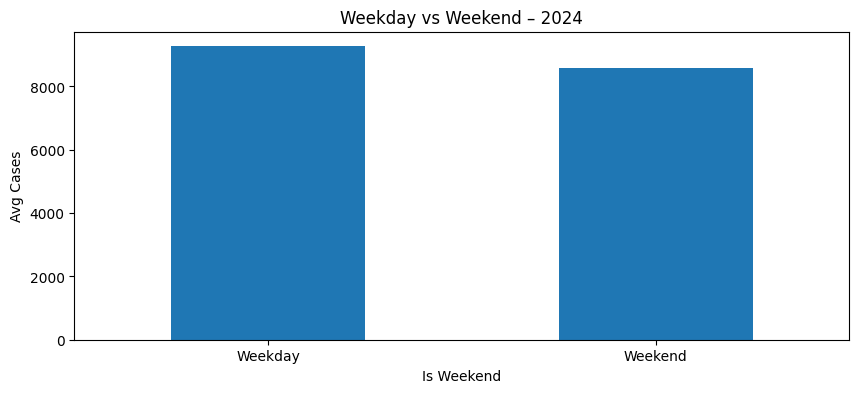

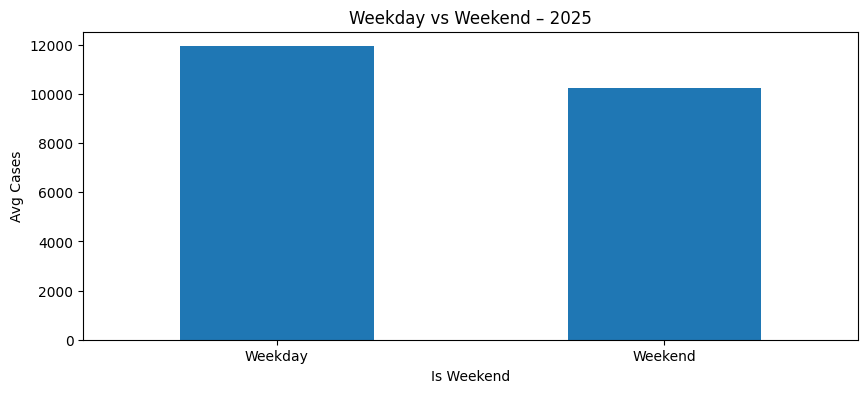

In [47]:
# 8b Weekday vs Weekend Comparison (Year-wise)
df['is_weekend'] = df['day_of_week'] >= 5

for year, df_year in df.groupby('year'):
    
    weekday_weekend = (
        df_year
        .groupby('is_weekend')['cases']
        .mean()
    )
    
    plt.figure(figsize=(10,4))
    weekday_weekend.plot(kind='bar')
    plt.title(f"Weekday vs Weekend – {year}")
    plt.xlabel("Is Weekend")
    plt.ylabel("Avg Cases")
    plt.xticks([0,1], ["Weekday", "Weekend"], rotation=0)
    plt.show()


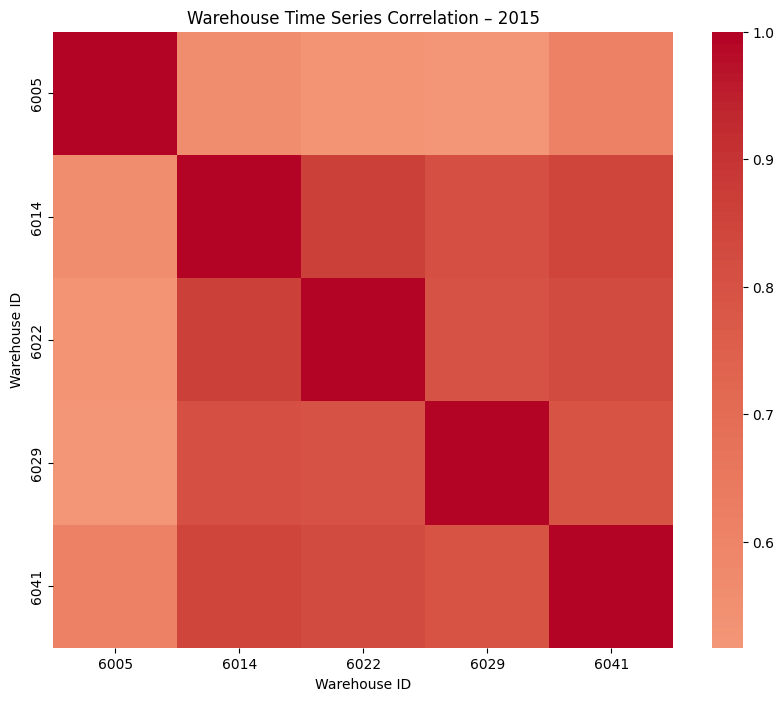

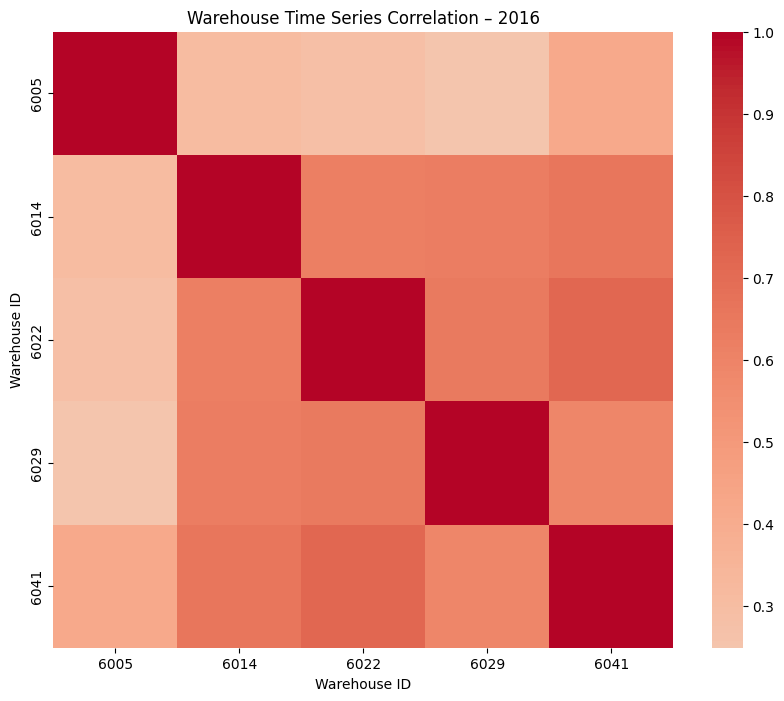

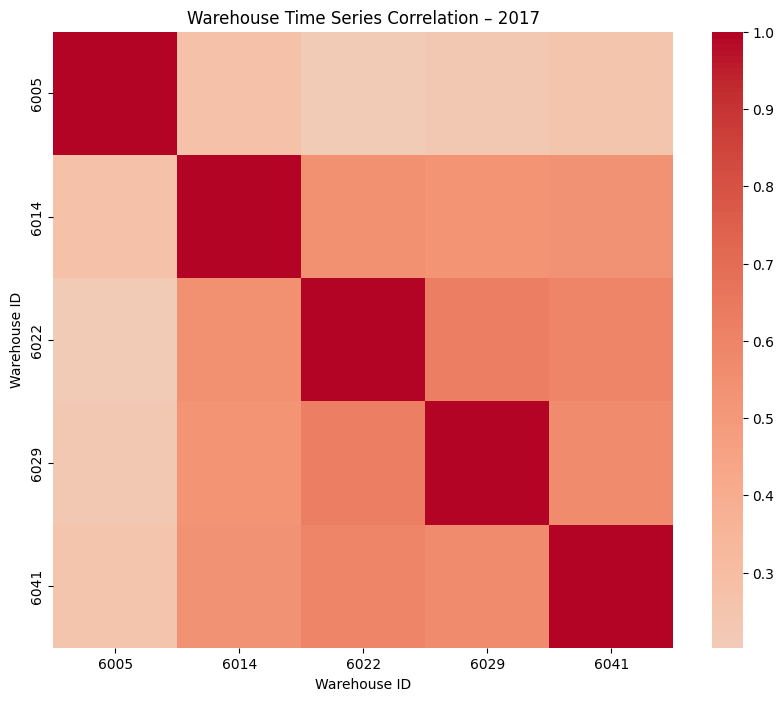

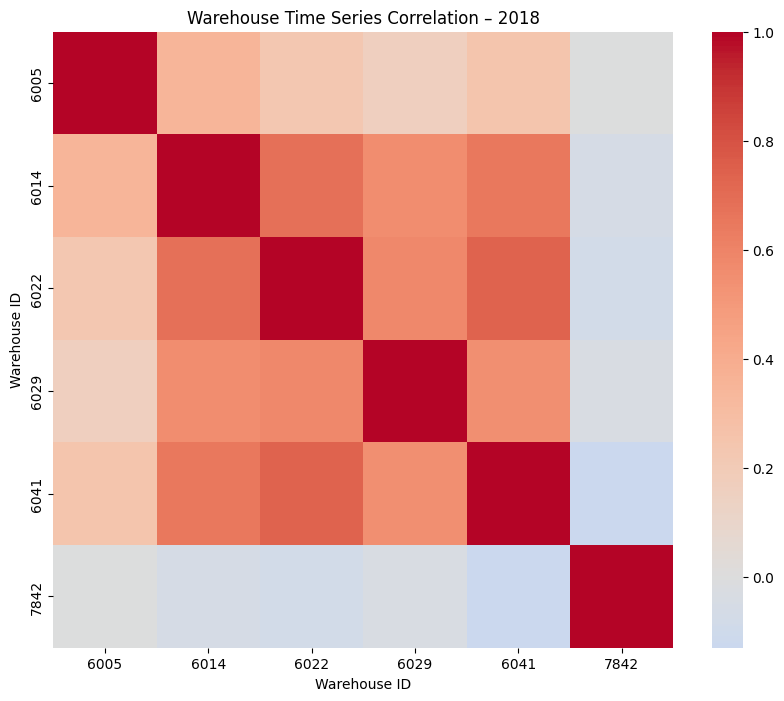

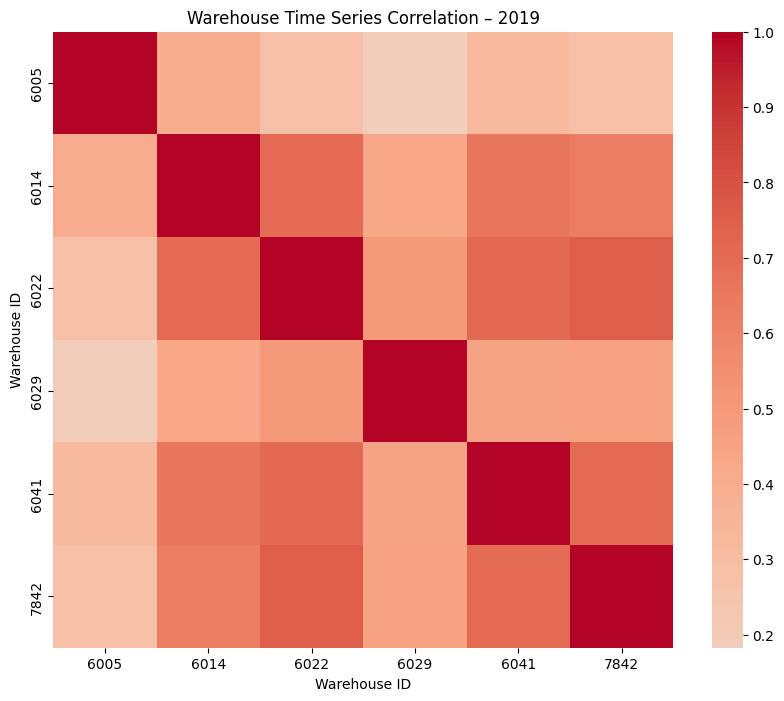

...

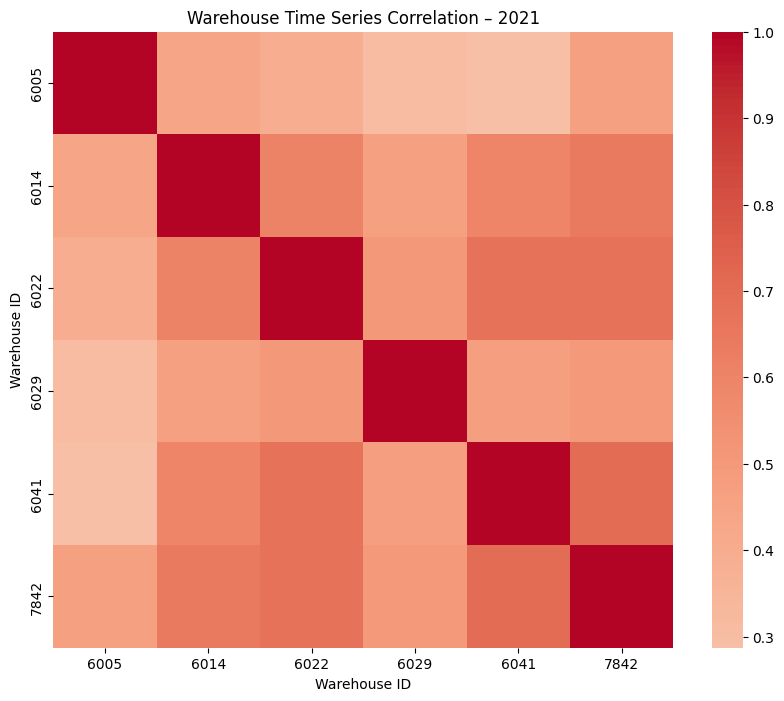

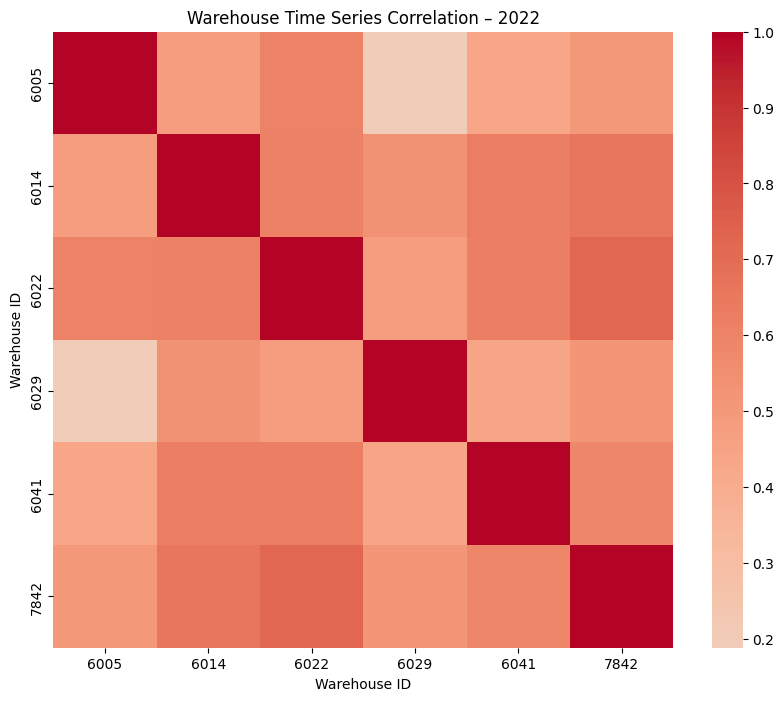

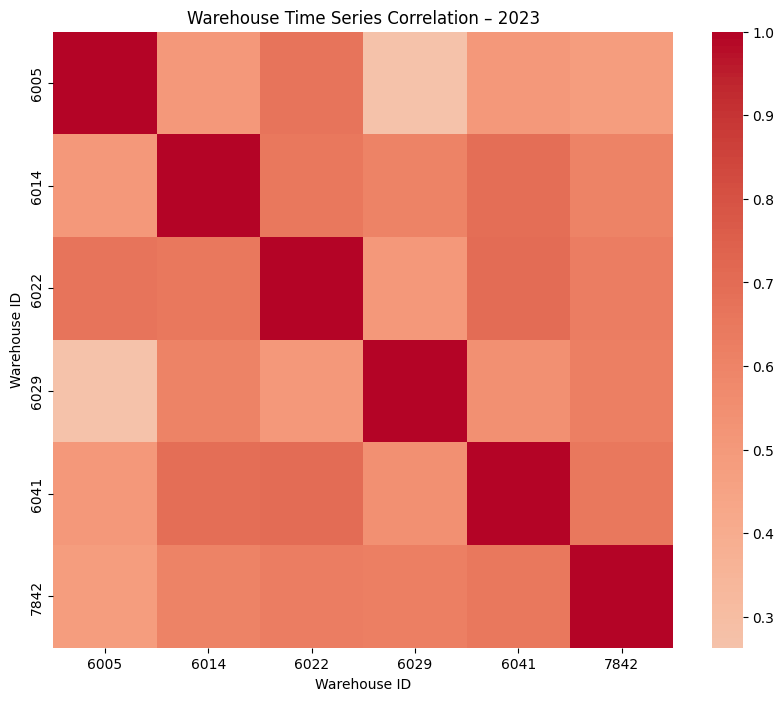

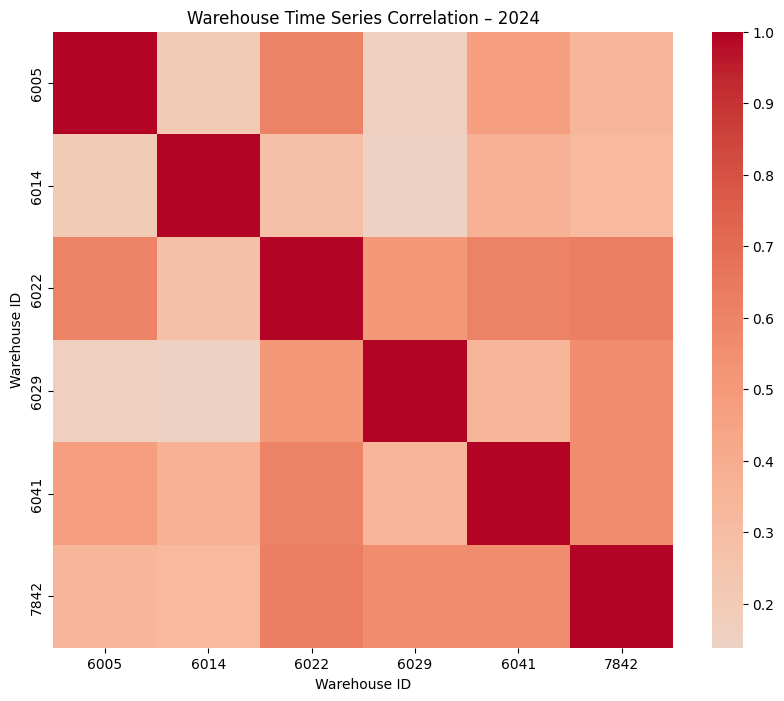

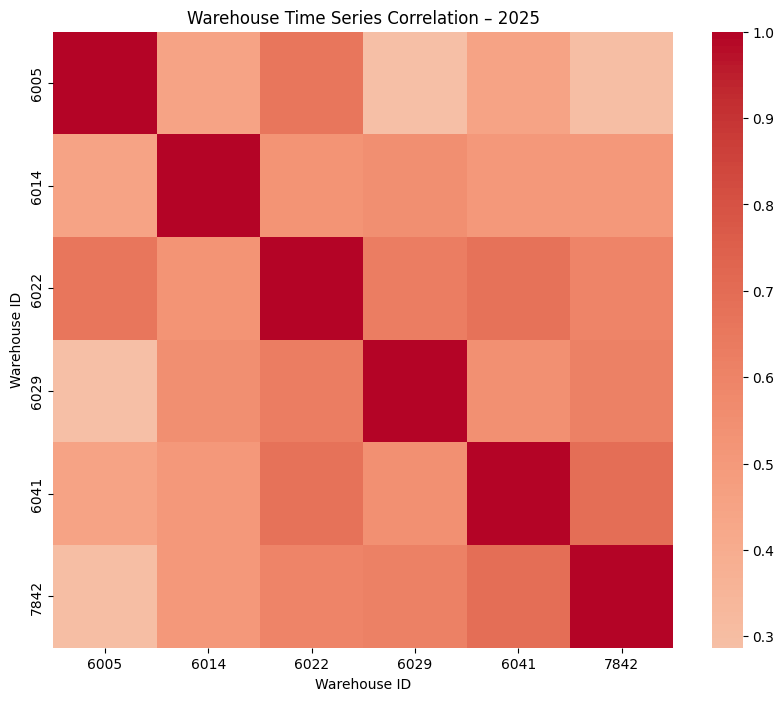

In [48]:
# METRIC 9: CROSS WAREHOUSE / CATEGORY COMPARISONS
# a) Correlation between warehouse time series

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df['cases'] = df['cases'].astype(float)
df = df.sort_values('calendar_date')

for year, df_year in df.groupby('year'):
    
    # Create daily warehouse-level matrix
    warehouse_daily = (
        df_year
        .groupby(['calendar_date', 'warehouse_id'])['cases']
        .sum()
        .unstack(fill_value=0)
    )
    
    # Correlation matrix
    corr_matrix = warehouse_daily.corr()
    
    plt.figure(figsize=(10,8))
    sns.heatmap(corr_matrix, cmap='coolwarm', center=0)
    plt.title(f"Warehouse Time Series Correlation – {year}")
    plt.xlabel("Warehouse ID")
    plt.ylabel("Warehouse ID")
    plt.show()


In [49]:
# 9 b) Clustering of warehouses based on similar patterns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

cluster_results = []

for year, df_year in df.groupby('year'):
    
    warehouse_daily = (
        df_year
        .groupby(['calendar_date', 'warehouse_id'])['cases']
        .sum()
        .unstack(fill_value=0)
    )
    
    # Transpose: warehouses as rows
    X = warehouse_daily.T
    
    # Scale time series
    X_scaled = StandardScaler().fit_transform(X)
    
    # KMeans clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    clusters = kmeans.fit_predict(X_scaled)
    
    cluster_df = pd.DataFrame({
        "Year": year,
        "Warehouse": X.index,
        "Cluster": clusters
    })
    
    cluster_results.append(cluster_df)
    
    print(f"\n===== Warehouse Clusters – {year} =====")
    display(cluster_df.sort_values("Cluster"))



===== Warehouse Clusters – 2015 =====


,Year,Warehouse,Cluster
1,2015,6014,0
2,2015,6022,0
3,2015,6029,0
4,2015,6041,1
0,2015,6005,2



===== Warehouse Clusters – 2016 =====


,Year,Warehouse,Cluster
1,2016,6014,0
2,2016,6022,1
3,2016,6029,1
4,2016,6041,1
0,2016,6005,2



===== Warehouse Clusters – 2017 =====


,Year,Warehouse,Cluster
1,2017,6014,0
2,2017,6022,1
3,2017,6029,1
4,2017,6041,1
0,2017,6005,2



===== Warehouse Clusters – 2018 =====


,Year,Warehouse,Cluster
1,2018,6014,0
2,2018,6022,0
3,2018,6029,0
4,2018,6041,0
5,2018,7842,1
0,2018,6005,2



===== Warehouse Clusters – 2019 =====


,Year,Warehouse,Cluster
1,2019,6014,0
2,2019,6022,0
3,2019,6029,0
4,2019,6041,1
5,2019,7842,1
0,2019,6005,2



===== Warehouse Clusters – 2020 =====


,Year,Warehouse,Cluster
1,2020,6014,0
2,2020,6022,0
3,2020,6029,1
4,2020,6041,1
5,2020,7842,1
0,2020,6005,2



===== Warehouse Clusters – 2021 =====


,Year,Warehouse,Cluster
1,2021,6014,0
2,2021,6022,0
5,2021,7842,0
4,2021,6041,0
3,2021,6029,1
0,2021,6005,2



===== Warehouse Clusters – 2022 =====


,Year,Warehouse,Cluster
1,2022,6014,0
2,2022,6022,0
5,2022,7842,0
4,2022,6041,0
3,2022,6029,1
0,2022,6005,2



===== Warehouse Clusters – 2023 =====


,Year,Warehouse,Cluster
2,2023,6022,0
1,2023,6014,1
3,2023,6029,1
4,2023,6041,1
5,2023,7842,1
0,2023,6005,2



===== Warehouse Clusters – 2024 =====


,Year,Warehouse,Cluster
2,2024,6022,0
5,2024,7842,0
3,2024,6029,1
1,2024,6014,1
4,2024,6041,1
0,2024,6005,2



===== Warehouse Clusters – 2025 =====


,Year,Warehouse,Cluster
1,2025,6014,0
2,2025,6022,0
3,2025,6029,0
5,2025,7842,0
4,2025,6041,1
0,2025,6005,2


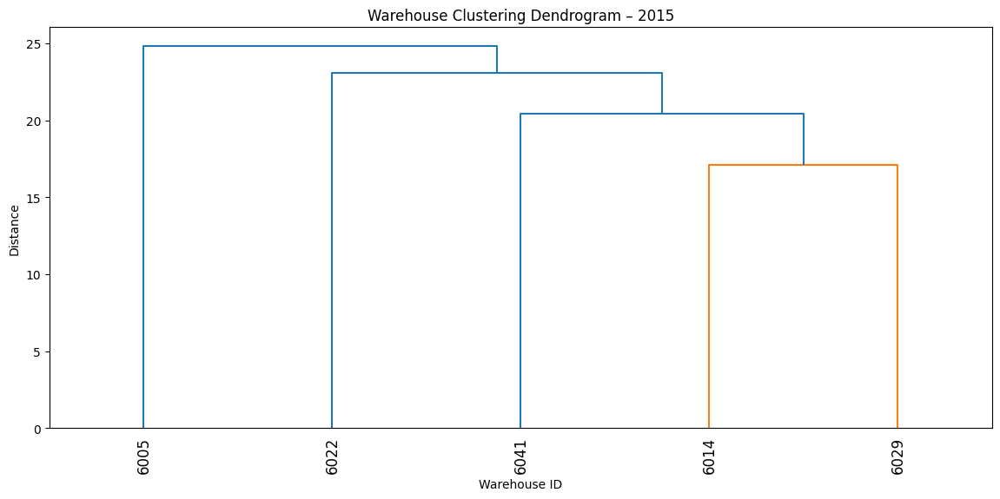

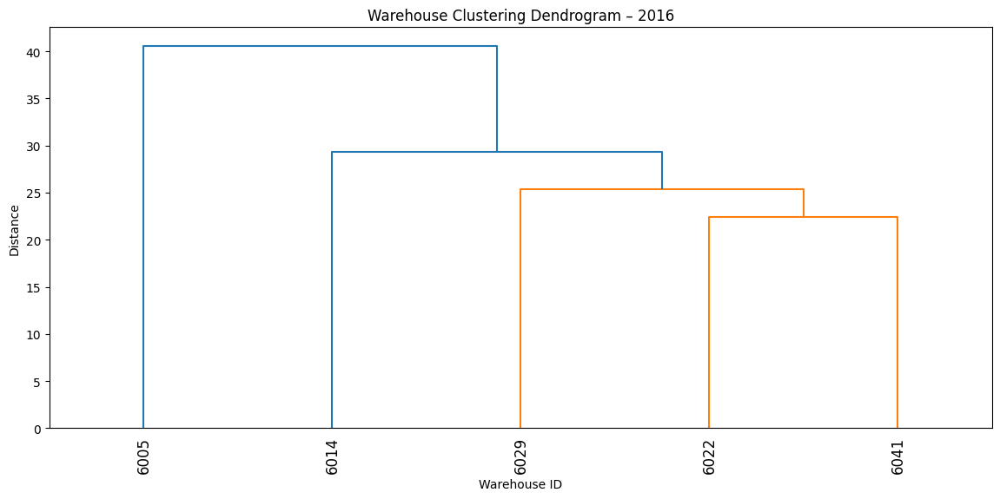

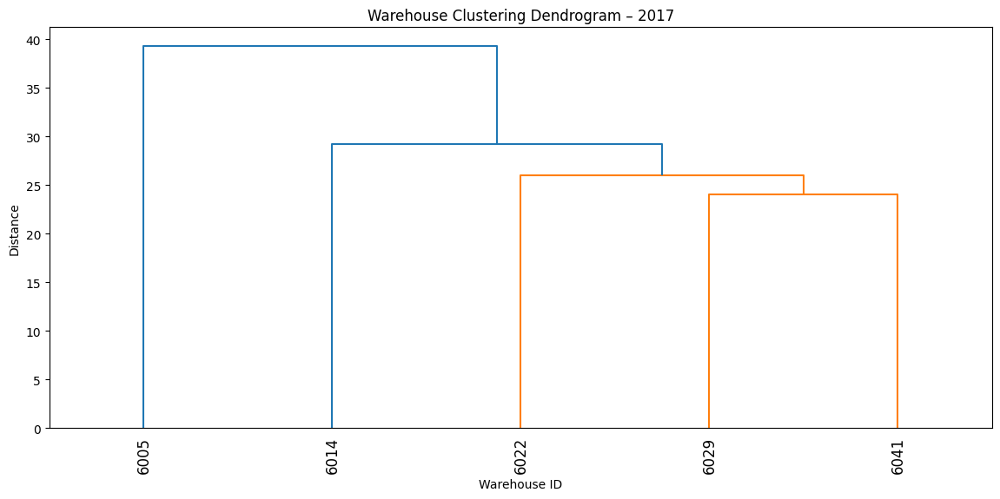

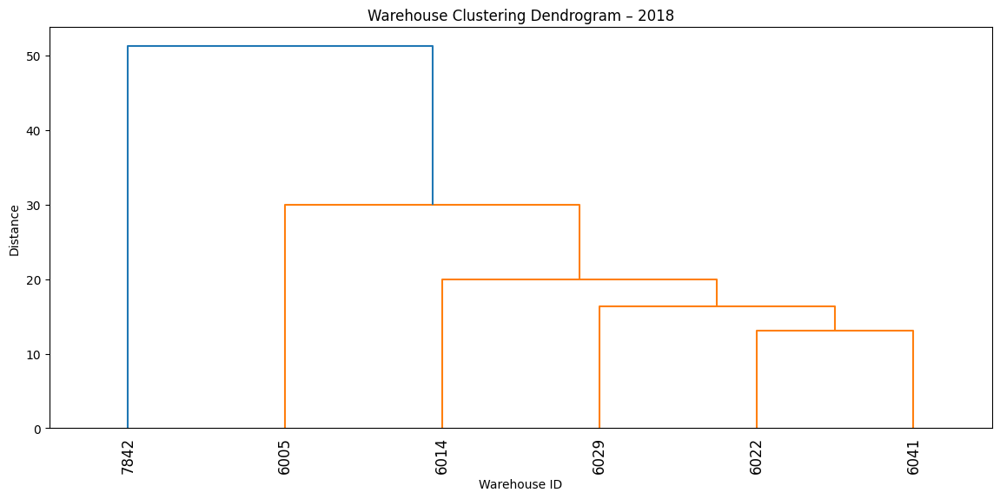

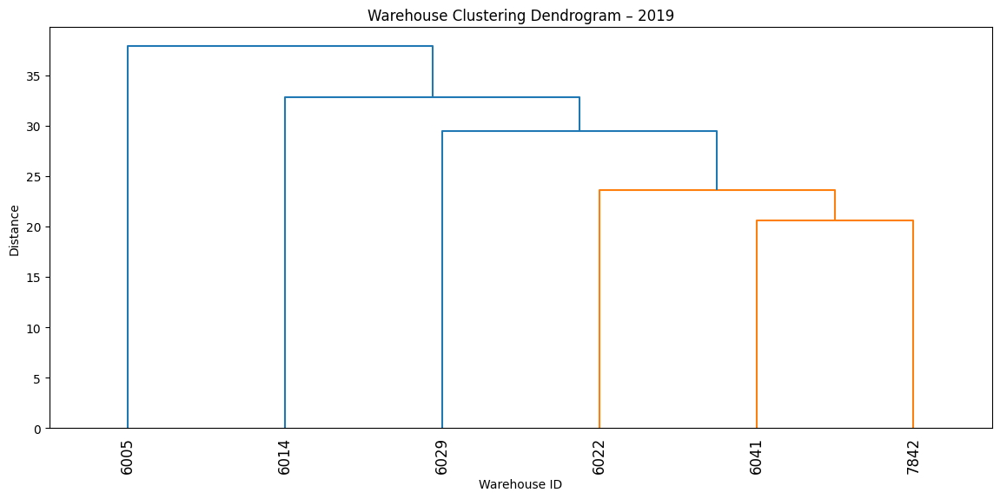

...

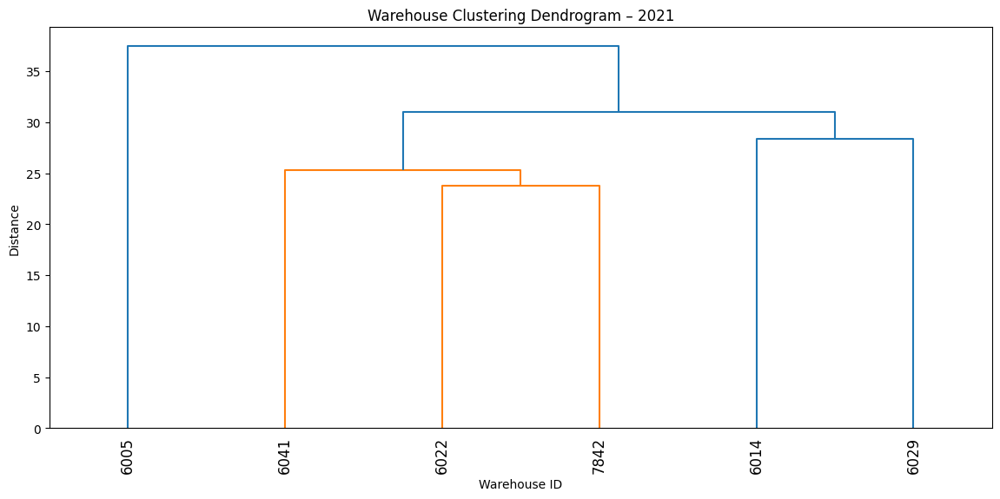

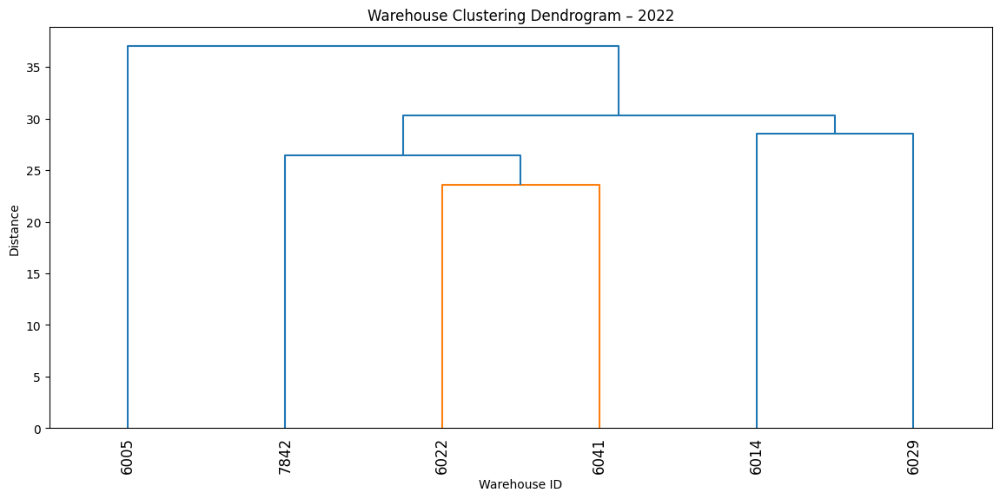

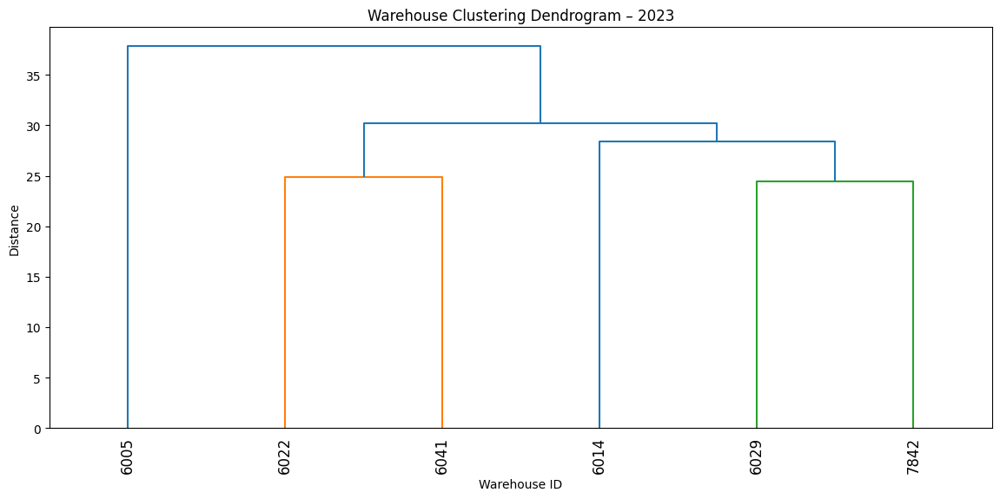

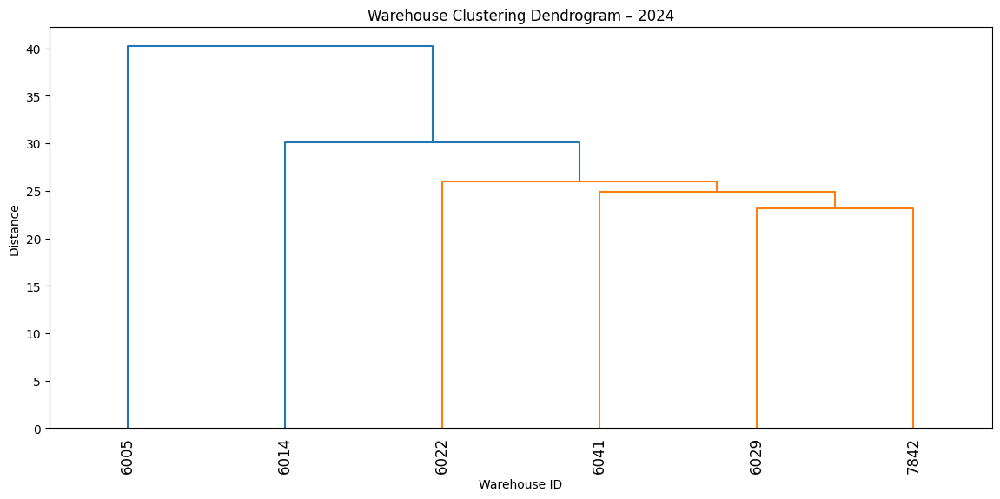

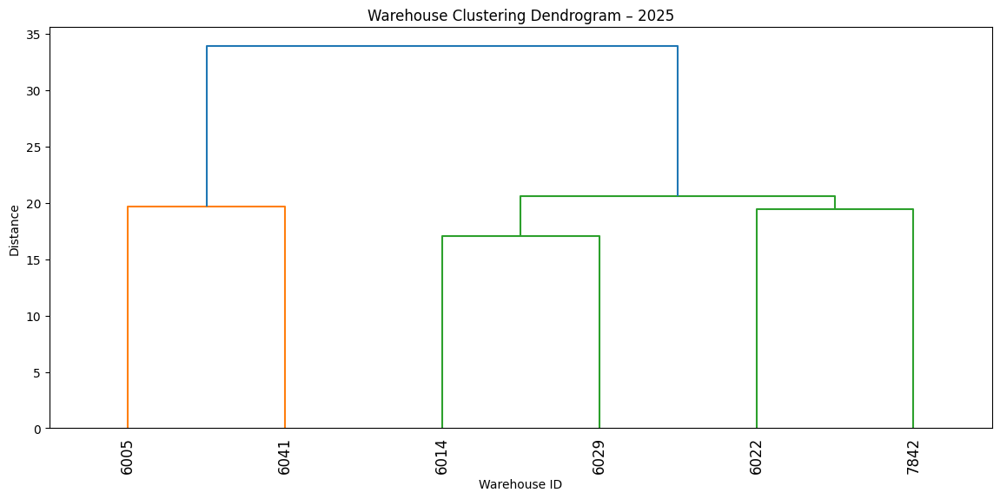

In [50]:
# =====================================================
# METRIC 9(b): WAREHOUSE CLUSTERING – DENDROGRAM
# (Hierarchical Clustering, Year-wise)
# =====================================================

from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

for year, df_year in df.groupby('year'):
    
    # ---------------------------------------------
    # Prepare warehouse-level daily time series
    # ---------------------------------------------
    warehouse_daily = (
        df_year
        .groupby(['calendar_date', 'warehouse_id'])['cases']
        .sum()
        .unstack(fill_value=0)
    )
    
    # Warehouses as rows
    X = warehouse_daily.T
    
    # Scale time series
    X_scaled = StandardScaler().fit_transform(X)
    
    # ---------------------------------------------
    # Hierarchical clustering (Ward linkage)
    # ---------------------------------------------
    Z = linkage(X_scaled, method='ward')
    
    # ---------------------------------------------
    # Plot dendrogram
    # ---------------------------------------------
    plt.figure(figsize=(14,6))
    dendrogram(
        Z,
        labels=X.index.astype(str),
        leaf_rotation=90
    )
    
    plt.title(f"Warehouse Clustering Dendrogram – {year}")
    plt.xlabel("Warehouse ID")
    plt.ylabel("Distance")
    plt.show()


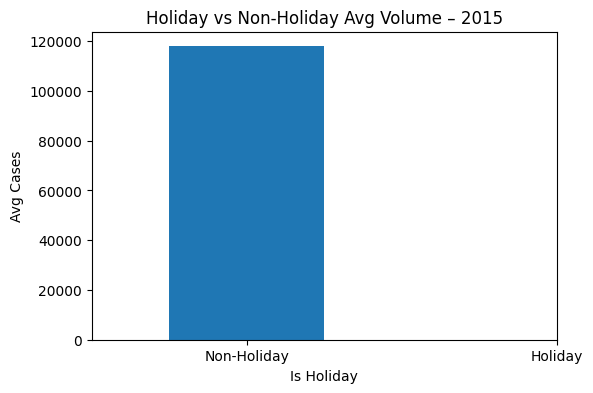

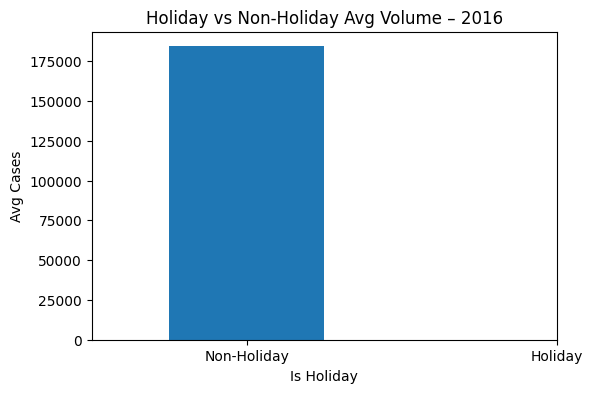

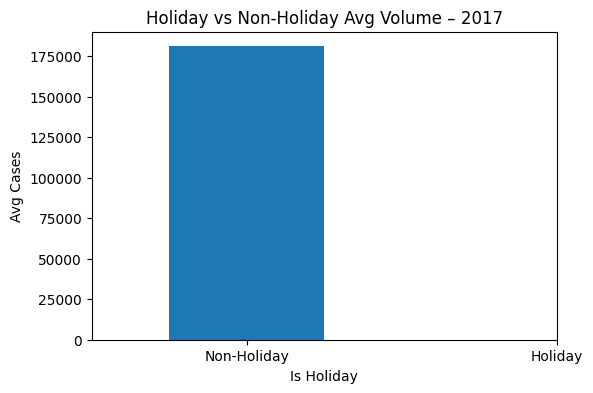

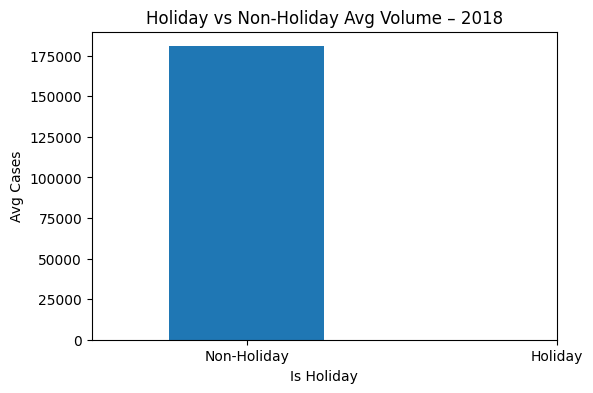

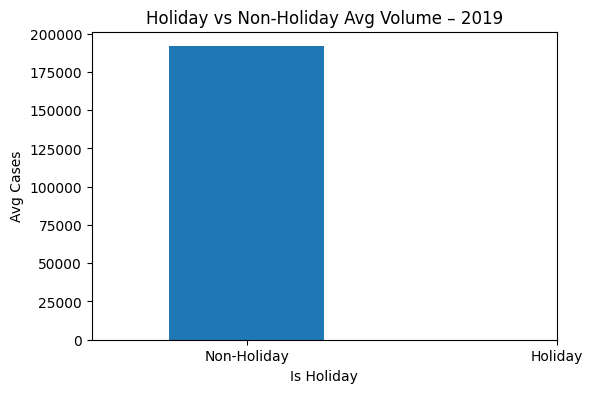

...

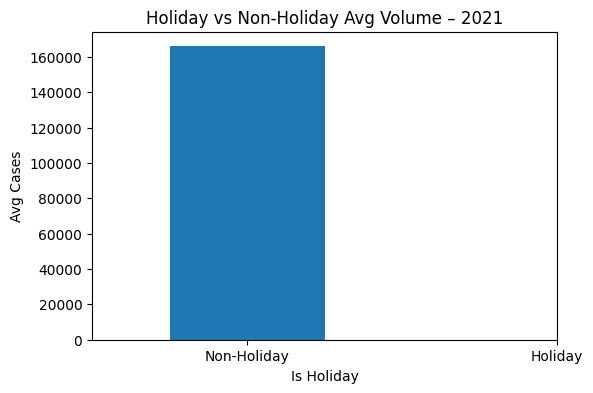

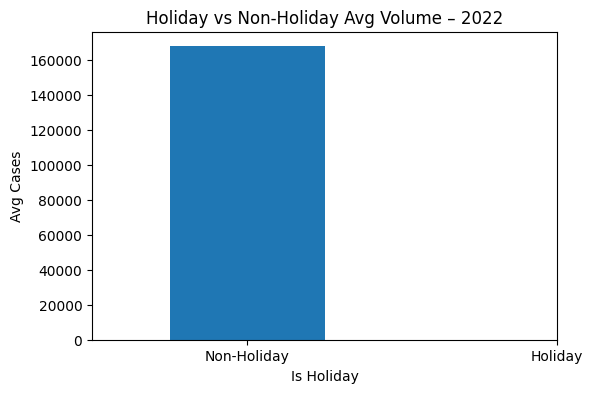

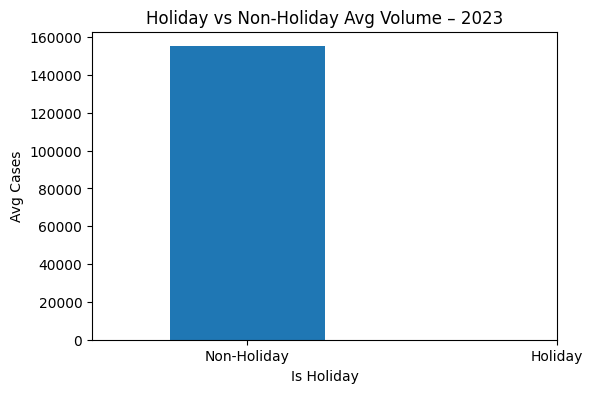

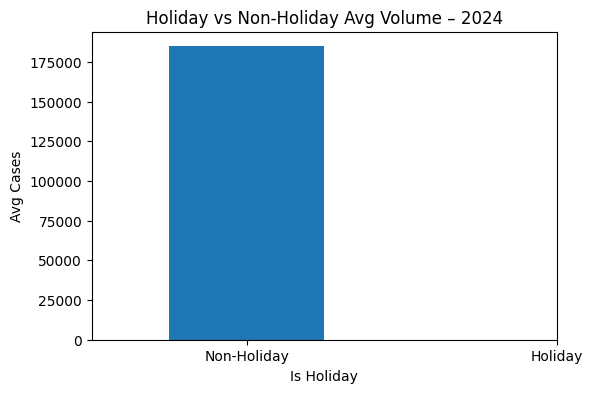

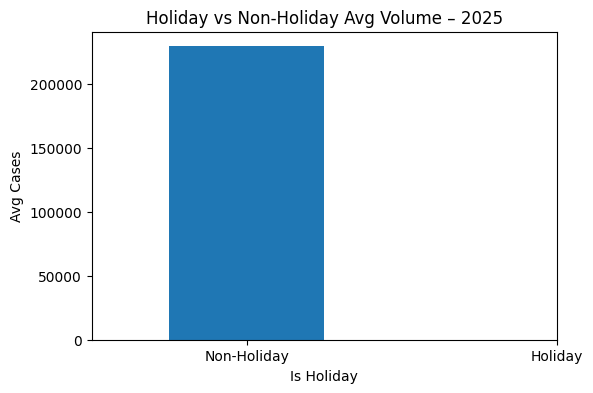

In [51]:
# METRIC 10: EXTERNAL FACTOR / EVENT ANALYSIS
# a) Holidays / Weather (proxy)

import holidays
import matplotlib.pyplot as plt
import pandas as pd

us_holidays = holidays.US()

df['is_holiday'] = df['calendar_date'].isin(us_holidays)

for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby(['calendar_date', 'is_holiday'])['cases']
        .sum()
        .reset_index()
    )
    
    holiday_avg = daily.groupby('is_holiday')['cases'].mean()
    
    plt.figure(figsize=(6,4))
    holiday_avg.plot(kind='bar')
    plt.title(f"Holiday vs Non-Holiday Avg Volume – {year}")
    plt.xlabel("Is Holiday")
    plt.ylabel("Avg Cases")
    plt.xticks([0,1], ["Non-Holiday", "Holiday"], rotation=0)
    plt.show()


In [52]:
# 10 b) Promotions (proxy-based)
from scipy.stats import zscore
import numpy as np

promotion_like_days = []

for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    z = zscore(daily.fillna(0))
    
    promo_days = daily[z > 3]   # positive spikes only
    
    for date, val in promo_days.items():
        promotion_like_days.append({
            "Year": year,
            "Date": date,
            "Volume": val,
            "Z-score": z[daily.index.get_loc(date)]
        })

promotion_df = pd.DataFrame(promotion_like_days)
promotion_df.head()


,Year,Date,Volume,Z-score
0,2015,2015-10-16,468405.0,3.996110
1,2017,2017-05-06,363041.0,3.144068
2,2018,2018-05-03,427631.0,3.893223
3,2018,2018-05-04,392964.0,3.346456
4,2019,2019-05-02,437758.0,3.379157


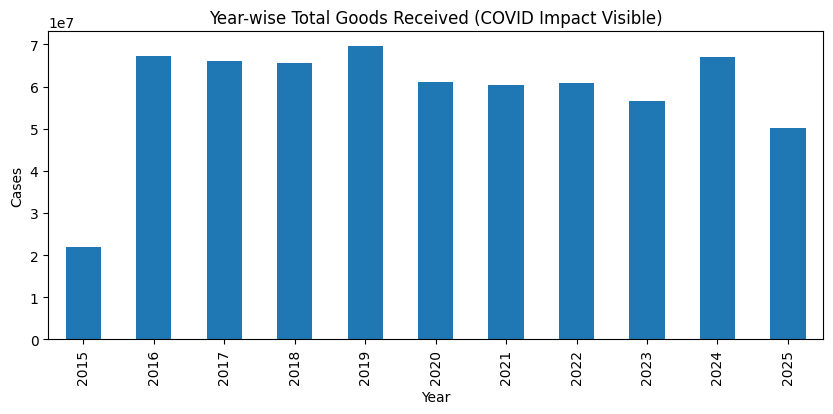

In [53]:
# 10 c) COVID impact (year-based shock analysis)
yearly_volume = (
    df
    .groupby('year')['cases']
    .sum()
)

plt.figure(figsize=(10,4))
yearly_volume.plot(kind='bar')
plt.title("Year-wise Total Goods Received (COVID Impact Visible)")
plt.xlabel("Year")
plt.ylabel("Cases")
plt.show()


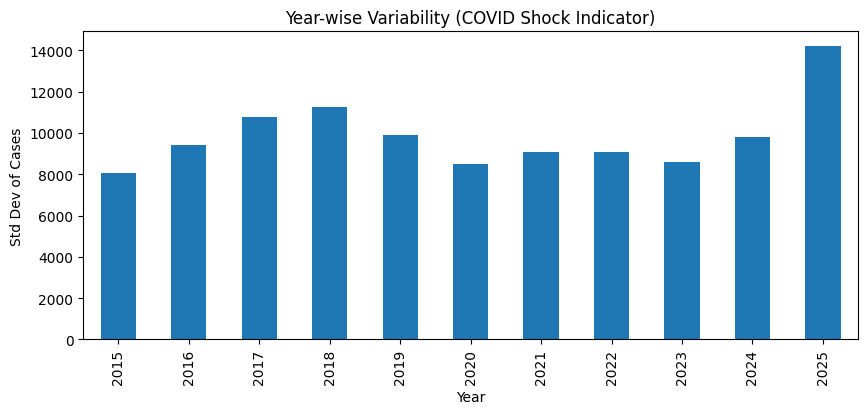

In [54]:
#Year-wise Variability (Shock Indicator)
yearly_std = (
    df
    .groupby('year')['cases']
    .std()
)

plt.figure(figsize=(10,4))
yearly_std.plot(kind='bar')
plt.title("Year-wise Variability (COVID Shock Indicator)")
plt.xlabel("Year")
plt.ylabel("Std Dev of Cases")
plt.show()


In [55]:
# =====================================================
# METRIC 11: TIME SERIES STATIONARITY CHECK
# a) Augmented Dickey–Fuller (ADF) Test (Year-wise)
# =====================================================

import pandas as pd
from statsmodels.tsa.stattools import adfuller

# Ensure correct type
df['cases'] = df['cases'].astype(float)
df = df.sort_values('calendar_date')

adf_results = []

for year, df_year in df.groupby('year'):
    
    # Daily total volume time series
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    # ADF needs enough data points
    if len(daily) < 10:
        continue
    
    adf_test = adfuller(daily, autolag='AIC')
    
    adf_results.append({
        "Year": year,
        "ADF Statistic": adf_test[0],
        "p-value": adf_test[1],
        "Lags Used": adf_test[2],
        "Observations": adf_test[3],
        "Stationary (p < 0.05)": adf_test[1] < 0.05
    })

adf_df = pd.DataFrame(adf_results).sort_values("Year")
adf_df


,Year,ADF Statistic,p-value,Lags Used,Observations,Stationary (p < 0.05)
0,2015,-1.537880,0.514697,6,180,False
1,2016,-2.030012,0.273571,16,348,False
2,2017,-2.955099,0.039306,15,349,True
3,2018,-2.189648,0.210024,15,347,False
4,2019,-2.114038,0.238908,12,350,False
5,2020,-2.698388,0.074318,17,347,False
6,2021,-2.134315,0.230942,17,346,False
7,2022,-1.349101,0.606420,17,345,False
8,2023,-2.936863,0.041226,16,347,True
9,2024,-2.888844,0.046661,17,345,True


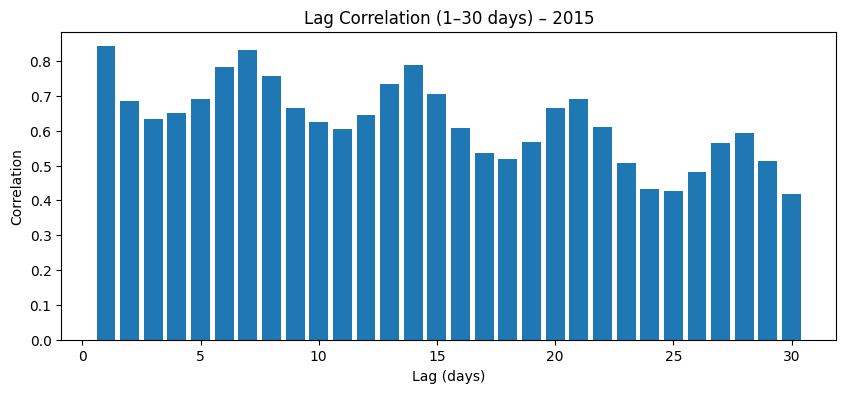

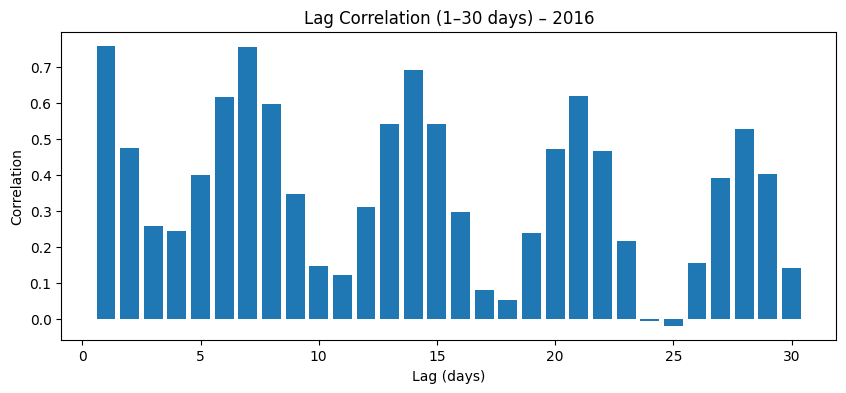

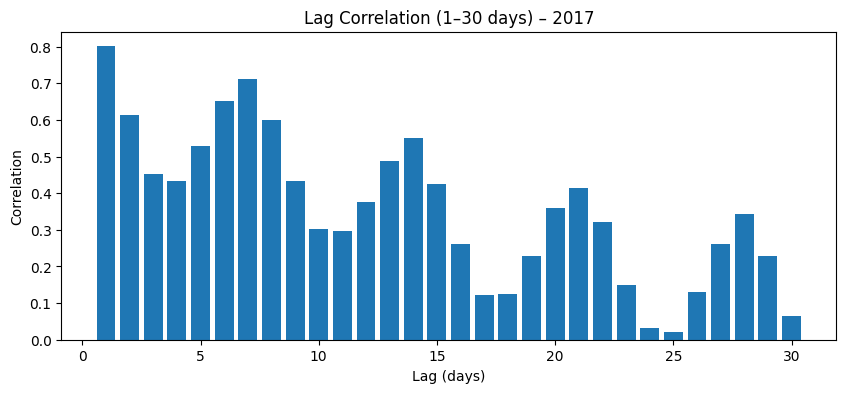

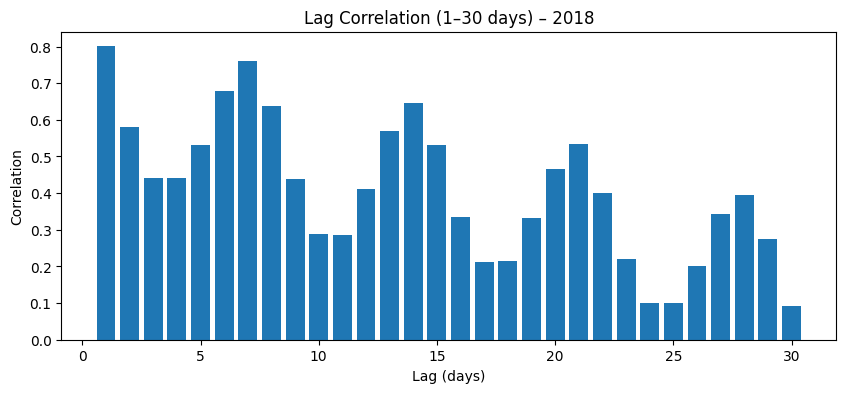

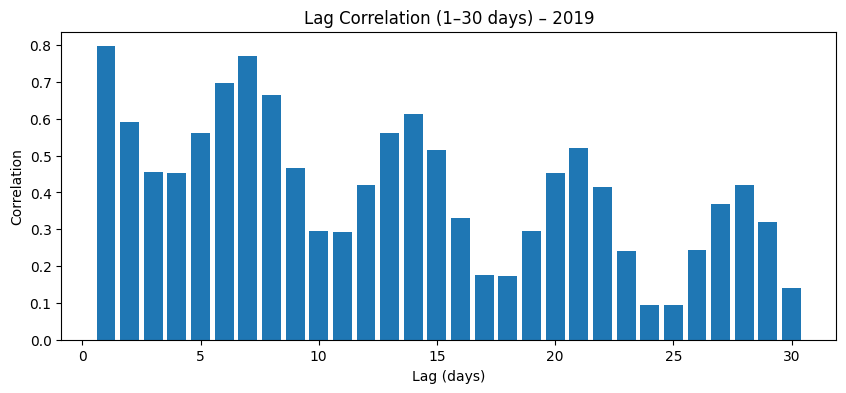

...

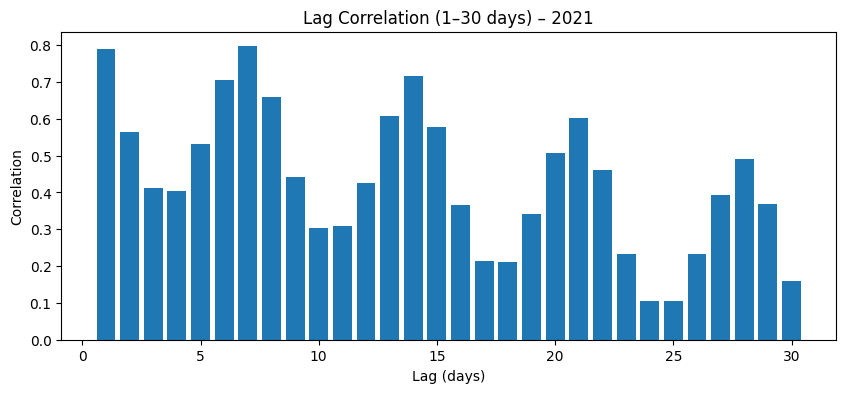

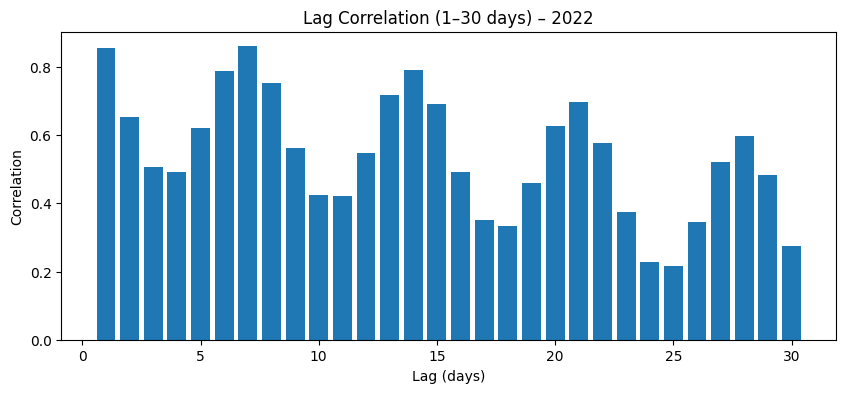

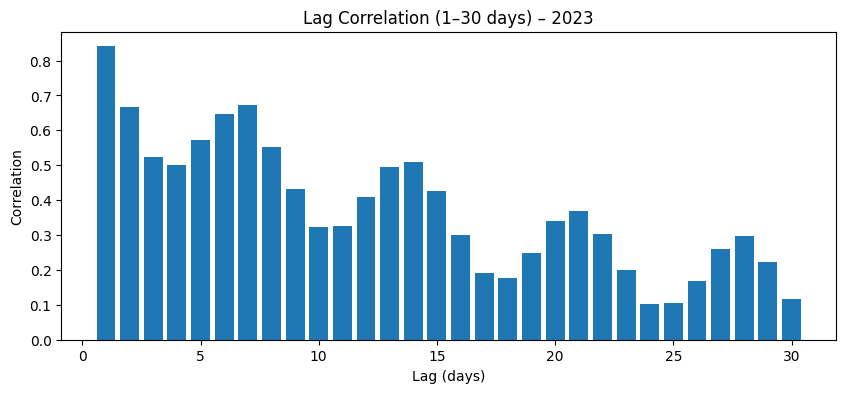

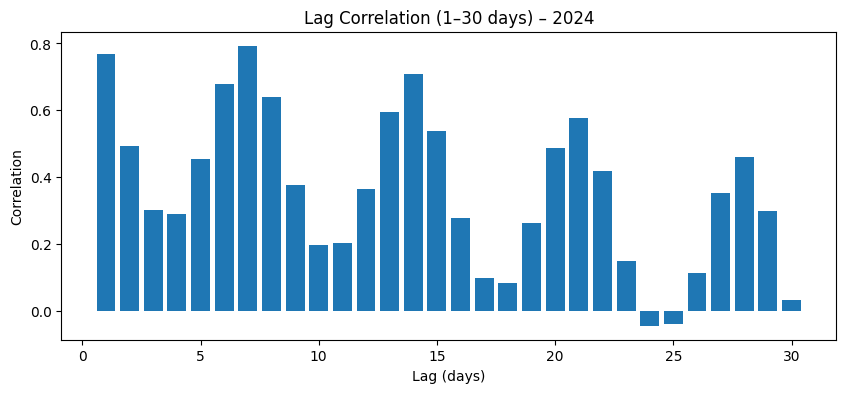

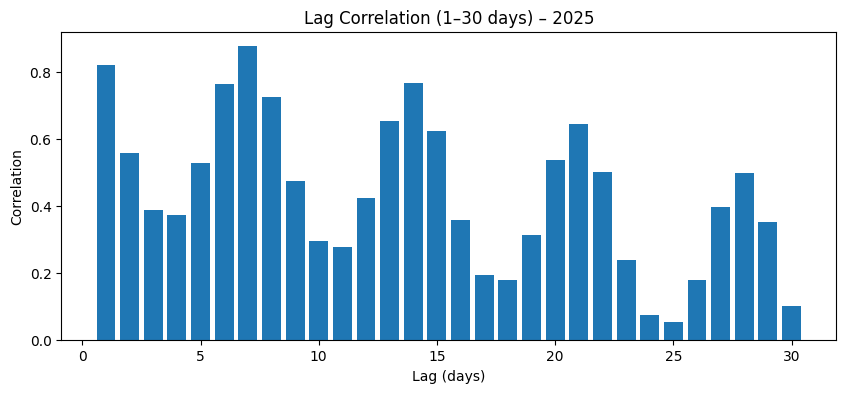

In [56]:
# METRIC 12: LAG FEATURE CORRELATION
# a) Lag correlation plots


import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf

# Ensure correct type and ordering
df['cases'] = df['cases'].astype(float)
df = df.sort_values('calendar_date')

max_lag = 30   # you can adjust (e.g., 7, 14, 30)

for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    lag_corr = []
    
    for lag in range(1, max_lag + 1):
        corr = daily.corr(daily.shift(lag))
        lag_corr.append(corr)
    
    plt.figure(figsize=(10,4))
    plt.bar(range(1, max_lag + 1), lag_corr)
    plt.title(f"Lag Correlation (1–{max_lag} days) – {year}")
    plt.xlabel("Lag (days)")
    plt.ylabel("Correlation")
    plt.show()


<Figure size 1000x400 with 0 Axes>

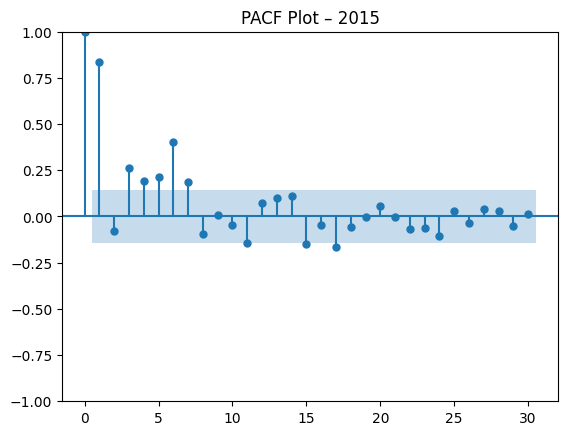

<Figure size 1000x400 with 0 Axes>

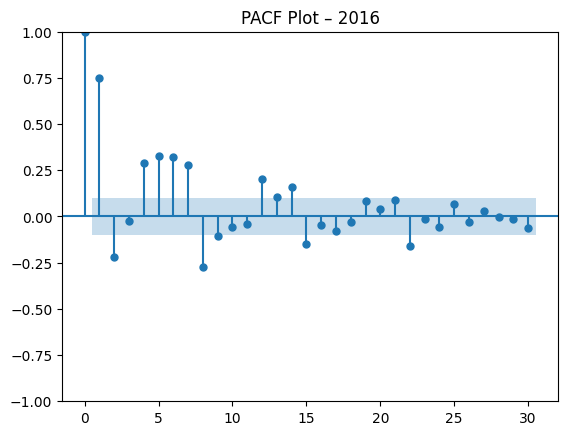

<Figure size 1000x400 with 0 Axes>

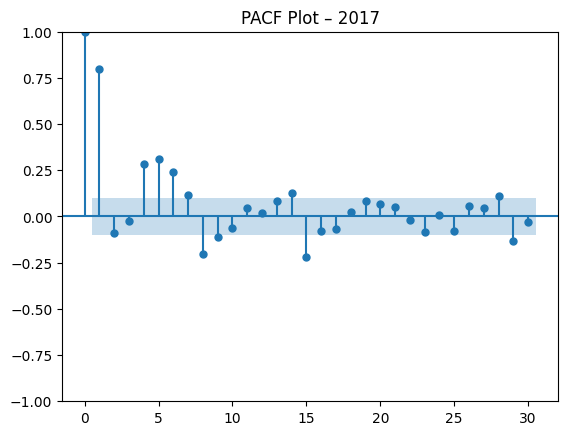

<Figure size 1000x400 with 0 Axes>

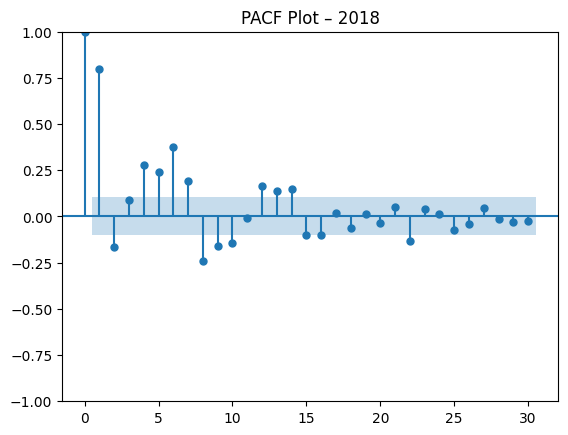

<Figure size 1000x400 with 0 Axes>

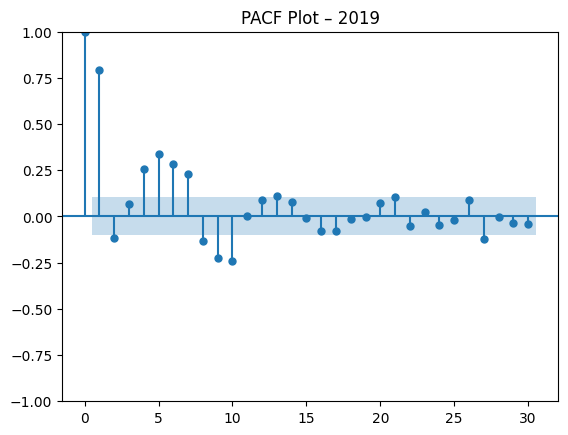

<Figure size 1000x400 with 0 Axes>

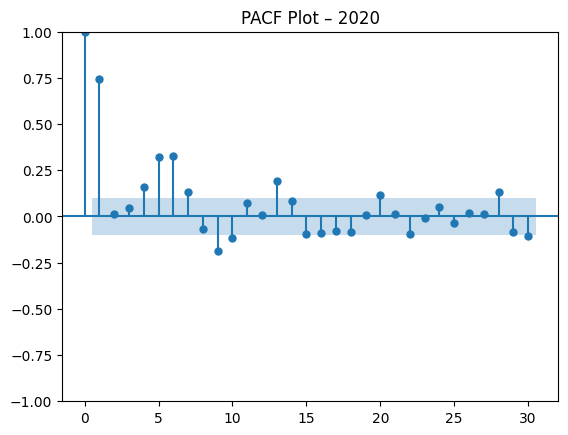

<Figure size 1000x400 with 0 Axes>

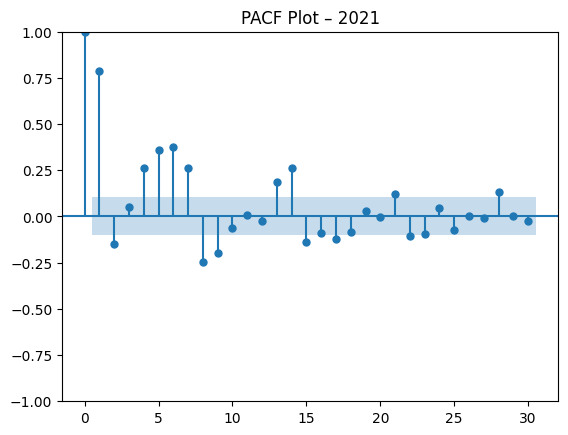

<Figure size 1000x400 with 0 Axes>

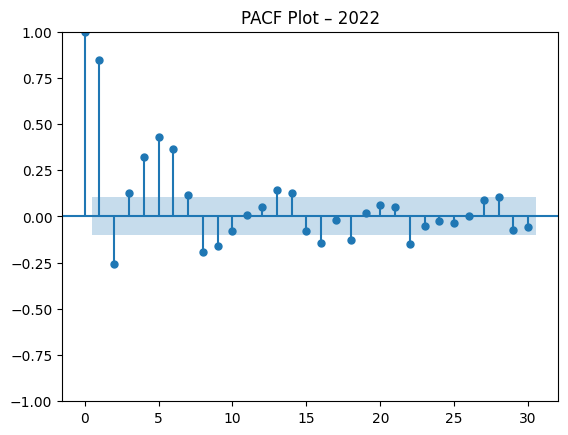

<Figure size 1000x400 with 0 Axes>

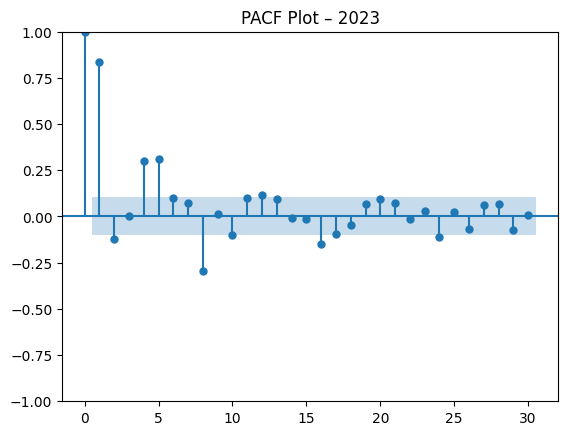

<Figure size 1000x400 with 0 Axes>

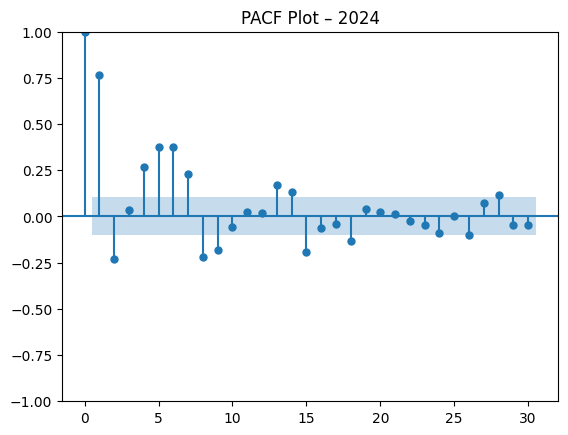

<Figure size 1000x400 with 0 Axes>

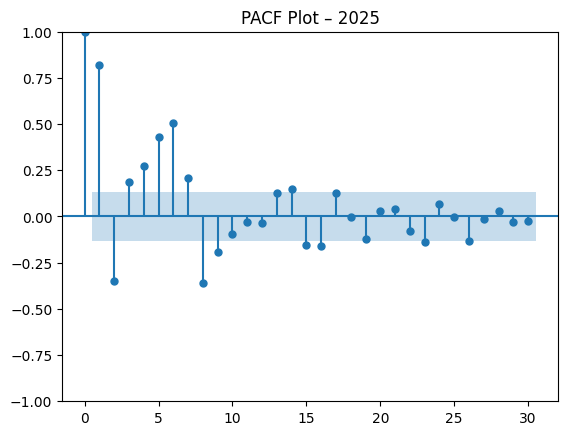

In [57]:
# b) Partial Auto-Correlation Function (PACF)
for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    if len(daily) < 20:
        continue
    
    plt.figure(figsize=(10,4))
    plot_pacf(daily, lags=30, method='ywm')
    plt.title(f"PACF Plot – {year}")
    plt.show()


In [58]:
# =====================================================
# METRIC 13: FORECASTABILITY
# a) Time Series Entropy
# b) Naive Forecast RMSE
# =====================================================

import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# Safety
df['cases'] = df['cases'].astype(float)
df = df.sort_values('calendar_date')


In [59]:
def time_series_entropy(series, bins=20):
    """
    Compute Shannon entropy for a numeric time series
    """
    hist, _ = np.histogram(series.dropna(), bins=bins, density=True)
    hist = hist[hist > 0]
    return -np.sum(hist * np.log(hist))


In [60]:
entropy_results = []

for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    if len(daily) < 10:
        continue
    
    entropy_val = time_series_entropy(daily)
    
    entropy_results.append({
        "Year": year,
        "Entropy": entropy_val
    })

entropy_df = pd.DataFrame(entropy_results).sort_values("Year")
entropy_df


,Year,Entropy
0,2015,0.000526
1,2016,0.000765
2,2017,0.000725
3,2018,0.000615
4,2019,0.000581
5,2020,0.000485
6,2021,0.000507
7,2022,0.000699
8,2023,0.000519
9,2024,0.000979


In [61]:
rmse_results = []

for year, df_year in df.groupby('year'):
    
    daily = (
        df_year
        .groupby('calendar_date')['cases']
        .sum()
        .sort_index()
    )
    
    if len(daily) < 2:
        continue
    
    y_true = daily[1:]
    y_pred = daily.shift(1)[1:]
    
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    
    rmse_results.append({
        "Year": year,
        "Naive_RMSE": rmse
    })

rmse_df = pd.DataFrame(rmse_results).sort_values("Year")
rmse_df


,Year,Naive_RMSE
0,2015,49321.619174
1,2016,44397.582470
2,2017,36515.097576
3,2018,40065.176904
4,2019,46441.793014
5,2020,41867.469855
6,2021,45621.177418
7,2022,35942.664726
8,2023,37364.030644
9,2024,34391.909925
